In [1]:
import pandas as pd
import numpy as np
import random
from datetime import datetime, timedelta
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import beta
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, mean_squared_error
from sklearn.impute import SimpleImputer
import joblib
import os

In [2]:
def generate_customer_datasets(num_customers_total=500, seed=42, learning_output_path='data/customer_learning_dataset.csv', predicting_output_path='data/customer_predicting_dataset.csv'):
    """
    Generate customer datasets for learning and predicting purposes.

    This function generates a dataset with a specified number of customers, splits it into two datasets,
    and saves them to CSV files. The first dataset is used for learning purposes, and the second dataset
    is used for predicting purposes.

    Parameters:
    num_customers_total (int): The total number of customers to generate. Default is 500.
    seed (int): The seed for reproducibility. Default is 42.
    learning_output_path (str): The path where the learning dataset will be saved. Default is 'data/customer_learning_dataset.csv'.
    predicting_output_path (str): The path where the predicting dataset will be saved. Default is 'data/customer_predicting_dataset.csv'.

    Returns:
    None
    """
    # Set seed for reproducibility
    np.random.seed(seed)
    random.seed(seed)

    # Generate customer IDs
    customer_ids = [f'CUST{i:04d}' for i in range(1, num_customers_total + 1)]

    # Generate contract start and end dates
    start_dates = [datetime(2023, 1, 1) + timedelta(days=np.random.randint(0, 365)) for _ in range(num_customers_total)]
    end_dates = [start_date + timedelta(days=365) for start_date in start_dates]

    # Generate other features
    ages = np.random.randint(18, 80, num_customers_total)
    family_statuses = np.random.choice(['Single', 'Married', 'Divorced', 'Widowed'], num_customers_total)
    products = np.random.choice(['ProductA', 'ProductB', 'ProductC'], num_customers_total)
    premiums = np.random.uniform(500, 2000, num_customers_total)
    claims = np.random.uniform(0, 1000, num_customers_total)

    # Generate has_existing_discount with 5% having the value 1
    has_existing_discount = np.random.choice([0, 1], num_customers_total, p=[0.95, 0.05])

    # Create the DataFrame
    data = {
        'customer_id': customer_ids,
        'contract_start_date': start_dates,
        'contract_end_date': end_dates,
        'age': ages,
        'family_status': family_statuses,
        'product': products,
        'premium': premiums,
        'claims': claims,
        'has_existing_discount': has_existing_discount
    }

    df = pd.DataFrame(data)

    # Calculate time from renewal date
    current_date = datetime(2024, 1, 1)
    df['time_from_renewal'] = df['contract_end_date'].apply(lambda x: (current_date - x).days)

    # Split the DataFrame into two datasets
    df_learning = df.iloc[:250]
    df_predicting = df.iloc[250:]

    # Save the DataFrames to CSV files
    df_learning.to_csv(learning_output_path, index=False)
    df_predicting.to_csv(predicting_output_path, index=False)
    
# Example usage
generate_customer_datasets()

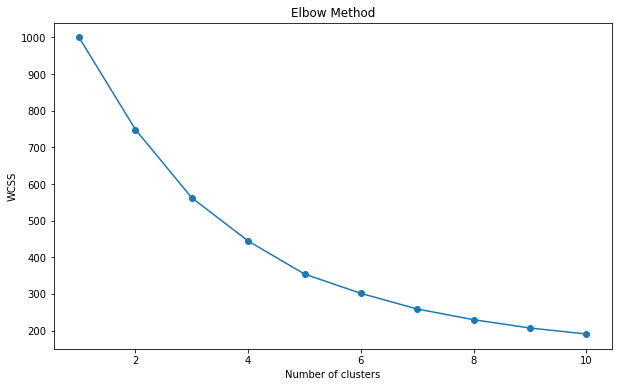

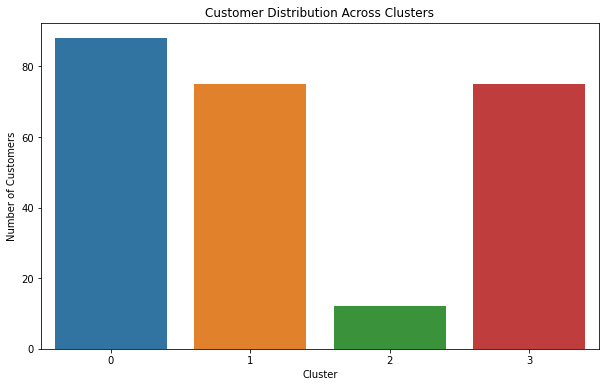

,cluster,age,premium,claims,has_existing_discount
0,0,68.204545,1254.430507,482.515562,0.0
1,1,39.453333,1120.650134,212.545339,0.0
2,2,52.333333,1140.693909,481.671404,1.0
3,3,37.973333,1414.778367,752.970243,0.0



Cluster 0:
Average Age: 68.20
Average Premium: 1254.43
Average Claims: 482.52
Percentage with Existing Discount: 0.00%

Cluster 1:
Average Age: 39.45
Average Premium: 1120.65
Average Claims: 212.55
Percentage with Existing Discount: 0.00%

Cluster 2:
Average Age: 52.33
Average Premium: 1140.69
Average Claims: 481.67
Percentage with Existing Discount: 100.00%

Cluster 3:
Average Age: 37.97
Average Premium: 1414.78
Average Claims: 752.97
Percentage with Existing Discount: 0.00%


In [3]:
df=pd.read_csv('data/customer_learning_dataset.csv')

# Select relevant features for clustering
features = df[['age', 'premium', 'claims', 'has_existing_discount']]

# Standardize the features
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Determine the optimal number of clusters using the Elbow method
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=42)
    kmeans.fit(features_scaled)
    wcss.append(kmeans.inertia_)

# Plot the Elbow method graph
plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), wcss, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

# Based on the Elbow method, let's choose the optimal number of clusters
optimal_clusters = 4  # Example choice, adjust based on the Elbow plot

# Fit the K-means model with the optimal number of clusters
kmeans = KMeans(n_clusters=optimal_clusters, init='k-means++', max_iter=300, n_init=10, random_state=42)
df['cluster'] = kmeans.fit_predict(features_scaled)

# Ensure all customers are part of a segmentation
df['cluster'] = df['cluster'].apply(lambda x: optimal_clusters if pd.isna(x) else x)

# Plot the group sizes
plt.figure(figsize=(10, 6))
sns.countplot(x='cluster', data=df)
plt.title('Customer Distribution Across Clusters')
plt.xlabel('Cluster')
plt.ylabel('Number of Customers')
plt.show()

# Describe the clusters
cluster_summary = df.groupby('cluster').agg({
    'age': 'mean',
    'premium': 'mean',
    'claims': 'mean',
    'has_existing_discount': 'mean'
}).reset_index()

display(cluster_summary)

# Descriptive analysis of each cluster
for cluster in range(optimal_clusters):
    cluster_data = df[df['cluster'] == cluster]
    print(f"\nCluster {cluster}:")
    print(f"Average Age: {cluster_data['age'].mean():.2f}")
    print(f"Average Premium: {cluster_data['premium'].mean():.2f}")
    print(f"Average Claims: {cluster_data['claims'].mean():.2f}")
    print(f"Percentage with Existing Discount: {cluster_data['has_existing_discount'].mean() * 100:.2f}%")

# Experimental Phase

In [4]:
# Function to plot Beta distributions
def plot_beta_distributions(priors, title):
    plt.figure(figsize=(12, 8))
    for treatment, params in priors.items():
        alpha, beta_param = params['alpha'], params['beta']
        x = np.linspace(0, 1, 1000)
        y = beta.pdf(x, alpha, beta_param)
        plt.plot(x, y, label=f'{treatment} (alpha={alpha}, beta={beta_param})')
    plt.title(title)
    plt.xlabel('Probability of Retention')
    plt.ylabel('Density')
    plt.legend()
    plt.show()

# Function to select a treatment using Thompson Sampling
def select_treatment(priors):
    best_treatment = None
    best_sample = -1
    for treatment, params in priors.items():
        alpha, beta_param = params['alpha'], params['beta']
        sample = np.random.beta(alpha, beta_param)
        if sample > best_sample:
            best_sample = sample
            best_treatment = treatment
    return best_treatment

# Function to update priors based on user input
def update_priors(priors, treatment, retained):
    if retained:
        priors[treatment]['alpha'] += 1
    else:
        priors[treatment]['beta'] += 1

# Function to log priors
def log_priors(trial, customer_id, contract_start_date, treatment, priors, outcome):
    alpha, beta_param = priors[treatment]['alpha'], priors[treatment]['beta']
    log_df.loc[len(log_df)] = [trial, customer_id, contract_start_date, treatment, alpha, beta_param, outcome]

# Function to run the experiment
def run_experiment(df):
    for trial, row in df.iterrows():
        customer_id = row['customer_id']
        contract_start_date = row['contract_start_date']

        # Select treatment using Thompson Sampling
        treatment = select_treatment(priors)
        print(f"Trial {trial + 1}: CustomerID = {customer_id}, Selected treatment = {treatment}")

        # Ask user for retention outcome
        retained = input(f"Was the customer {customer_id} retained? (y/n): ").strip().lower() == 'y'
        outcome = 'y' if retained else 'n'

        # Update priors based on user input
        update_priors(priors, treatment, retained)

        # Log priors
        log_priors(trial + 1, customer_id, contract_start_date, treatment, priors, outcome)

        # Plot updated priors
        plot_beta_distributions(priors, f'Prior Distributions After Trial {trial + 1}')

    # Save log to CSV
    log_df.to_csv('data/experimentation_output.csv', index=False)

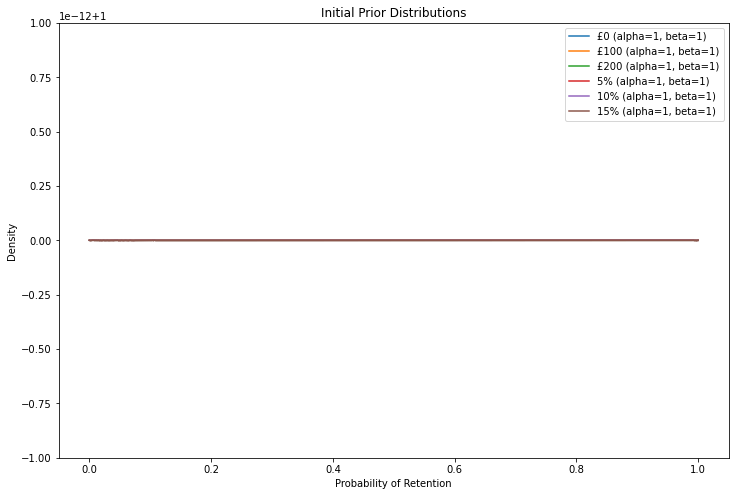

Trial 1: CustomerID = CUST0001, Selected treatment = £200
Was the customer CUST0001 retained? (y/n): y


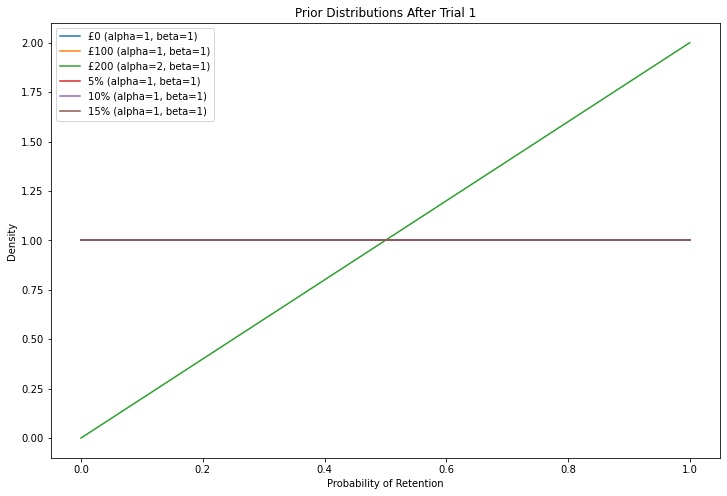

Trial 2: CustomerID = CUST0002, Selected treatment = 15%
Was the customer CUST0002 retained? (y/n): y


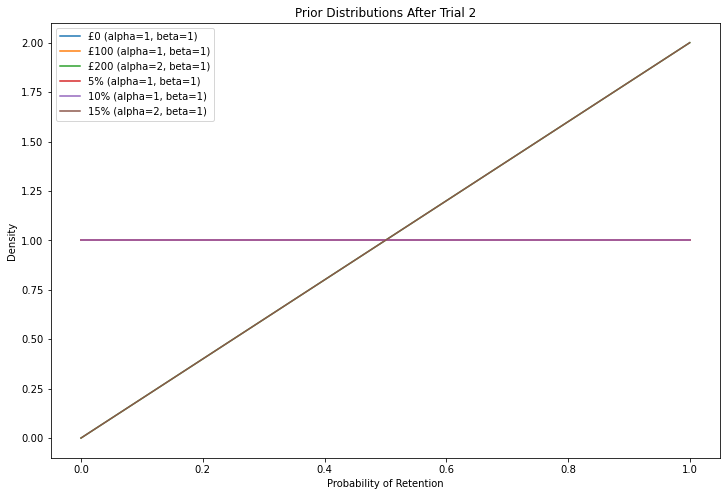

Trial 3: CustomerID = CUST0003, Selected treatment = £0
Was the customer CUST0003 retained? (y/n): y


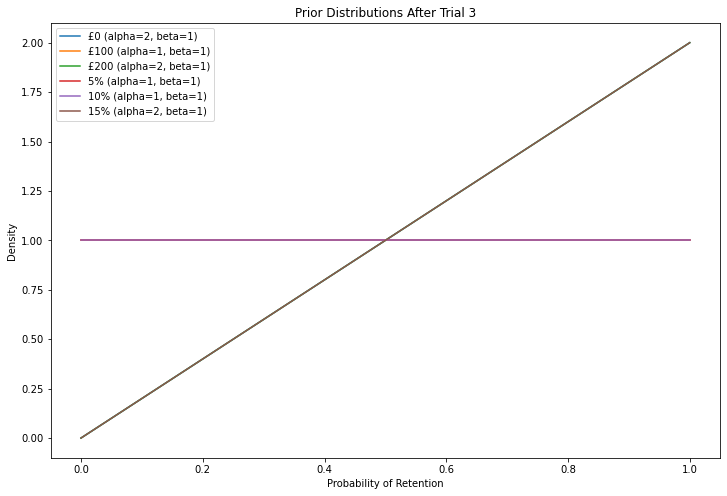

Trial 4: CustomerID = CUST0004, Selected treatment = £200
Was the customer CUST0004 retained? (y/n): y


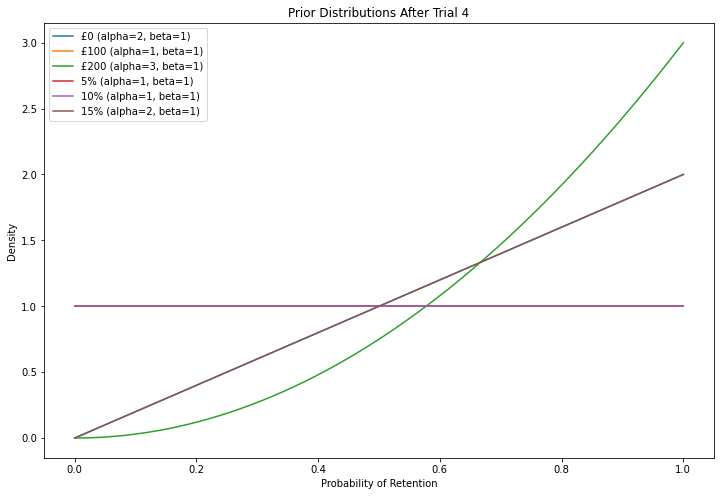

Trial 5: CustomerID = CUST0005, Selected treatment = £200
Was the customer CUST0005 retained? (y/n): y


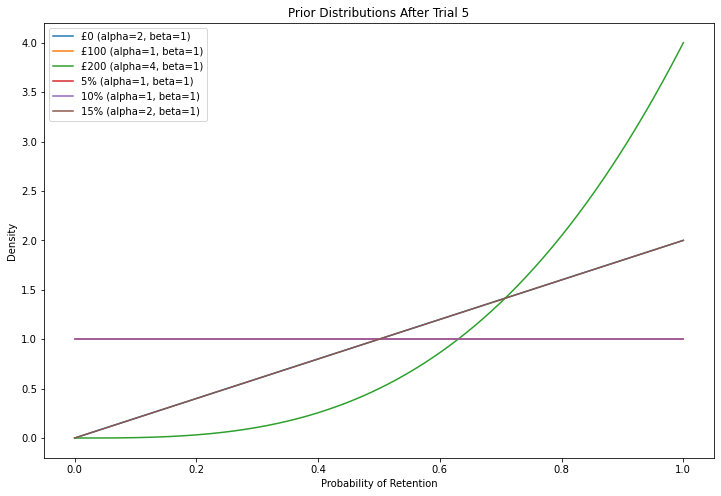

Trial 6: CustomerID = CUST0006, Selected treatment = £0
Was the customer CUST0006 retained? (y/n): y


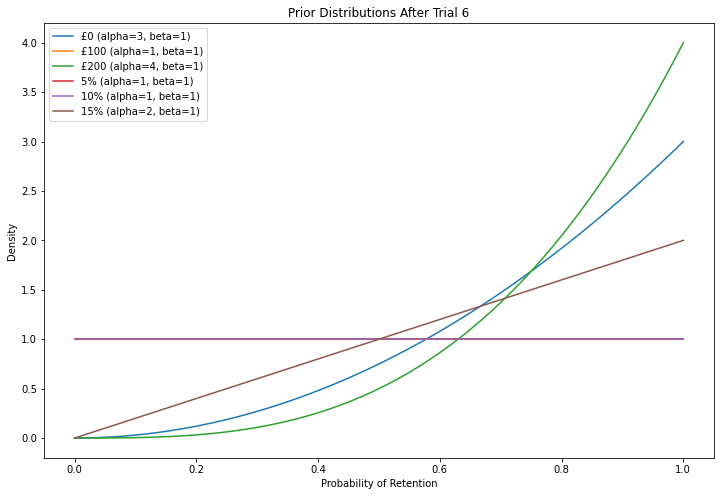

Trial 7: CustomerID = CUST0007, Selected treatment = 15%
Was the customer CUST0007 retained? (y/n): 


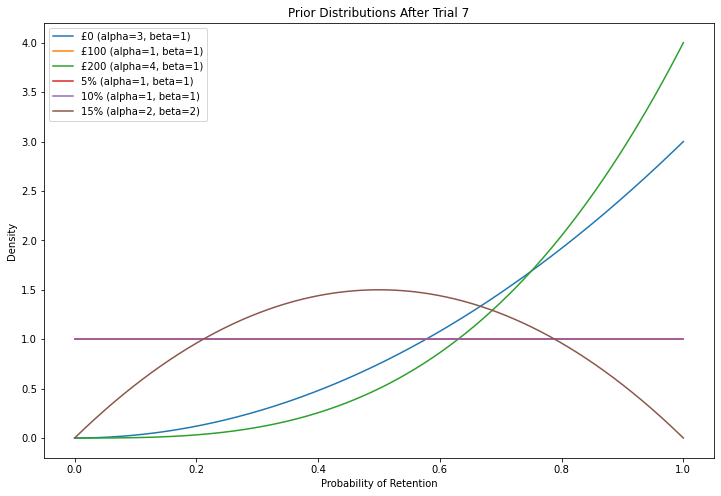

Trial 8: CustomerID = CUST0008, Selected treatment = £200
Was the customer CUST0008 retained? (y/n): 


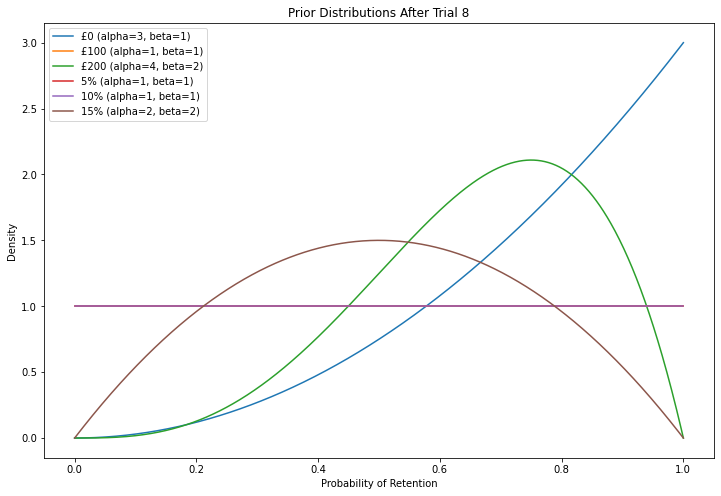

Trial 9: CustomerID = CUST0009, Selected treatment = £100
Was the customer CUST0009 retained? (y/n): 


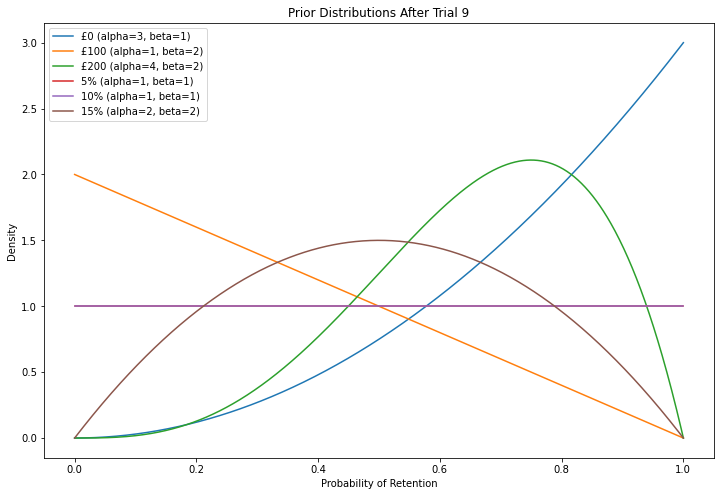

Trial 10: CustomerID = CUST0010, Selected treatment = £0
Was the customer CUST0010 retained? (y/n): 


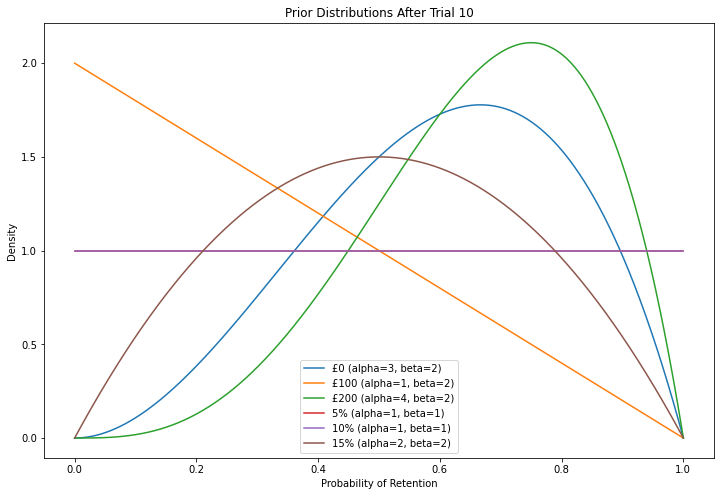

Trial 11: CustomerID = CUST0011, Selected treatment = £0
Was the customer CUST0011 retained? (y/n): 


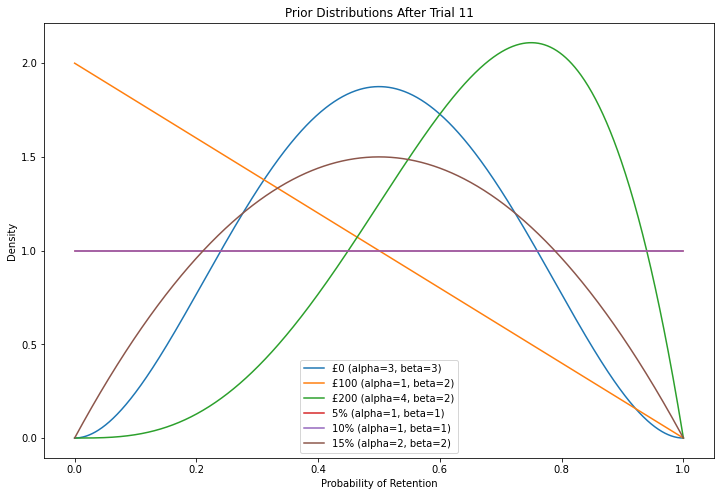

Trial 12: CustomerID = CUST0012, Selected treatment = £0
Was the customer CUST0012 retained? (y/n): 


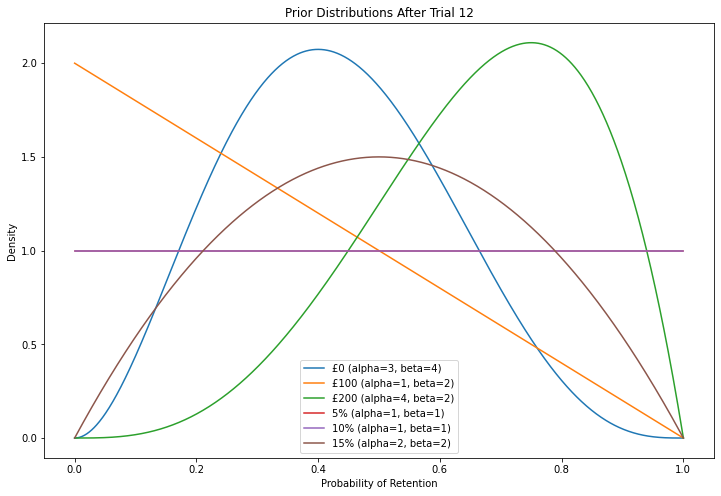

Trial 13: CustomerID = CUST0013, Selected treatment = 15%
Was the customer CUST0013 retained? (y/n): 


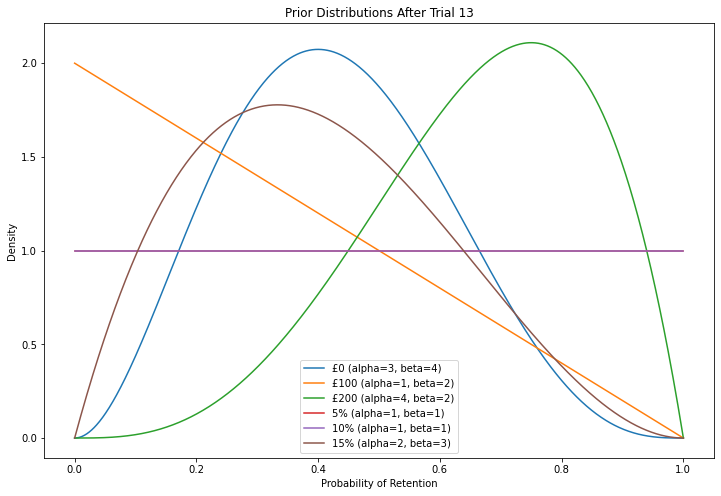

Trial 14: CustomerID = CUST0014, Selected treatment = 5%
Was the customer CUST0014 retained? (y/n): y


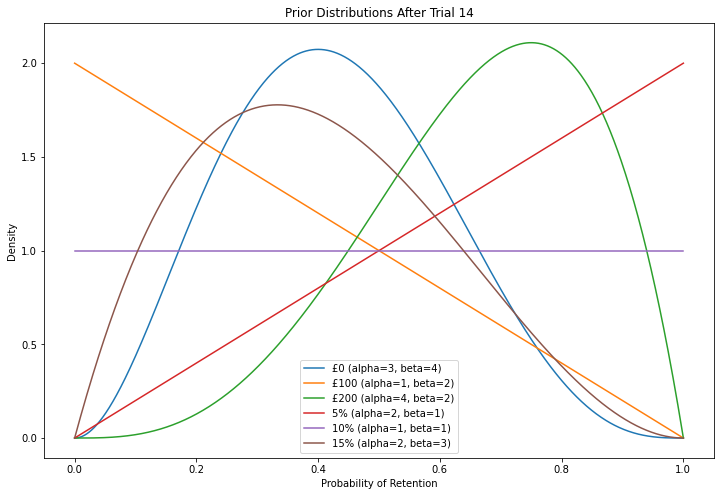

Trial 15: CustomerID = CUST0015, Selected treatment = 10%
Was the customer CUST0015 retained? (y/n): n


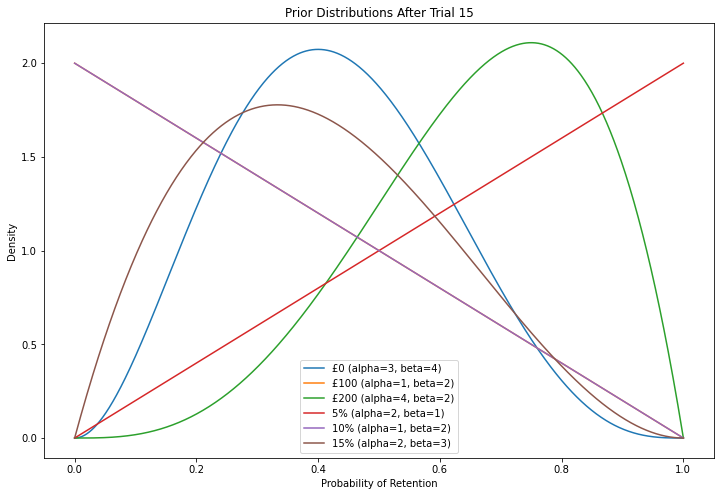

Trial 16: CustomerID = CUST0016, Selected treatment = 10%
Was the customer CUST0016 retained? (y/n): 


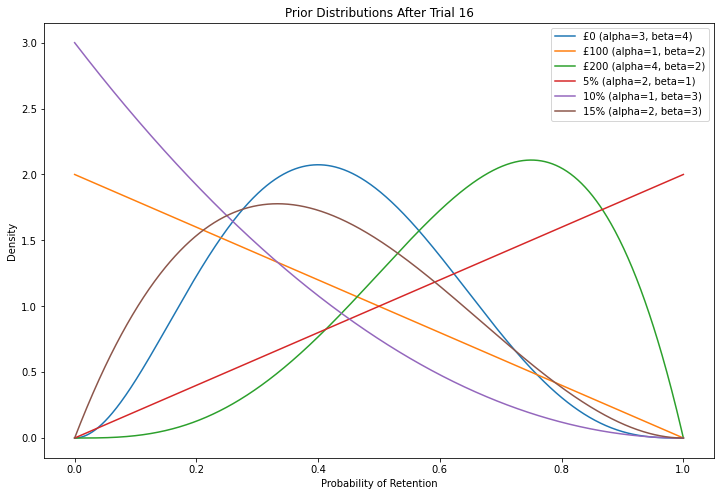

Trial 17: CustomerID = CUST0017, Selected treatment = £0
Was the customer CUST0017 retained? (y/n): 


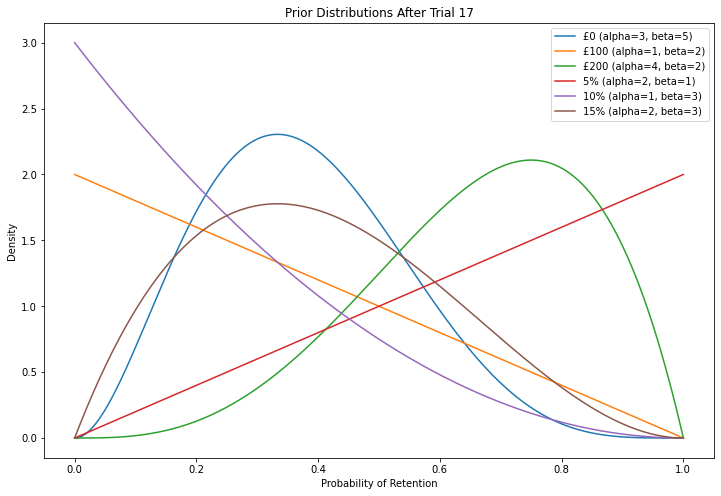

Trial 18: CustomerID = CUST0018, Selected treatment = £200
Was the customer CUST0018 retained? (y/n): 


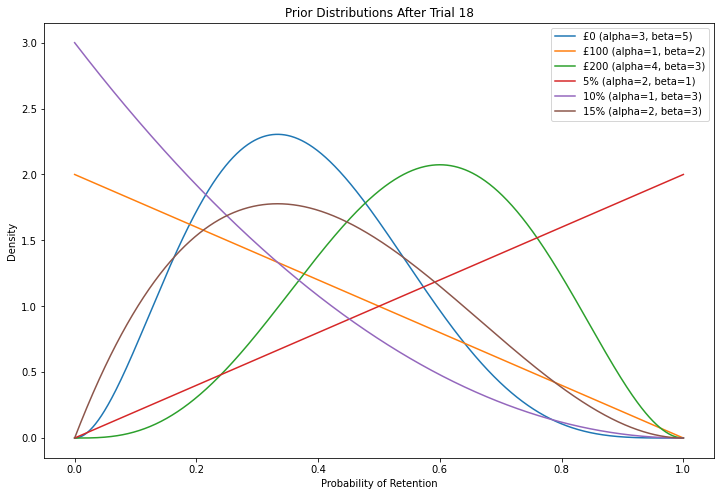

Trial 19: CustomerID = CUST0019, Selected treatment = £100
Was the customer CUST0019 retained? (y/n): 


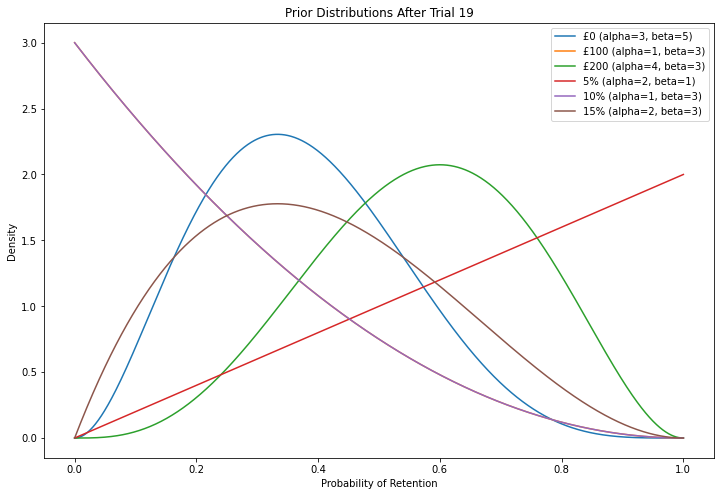

Trial 20: CustomerID = CUST0020, Selected treatment = 5%
Was the customer CUST0020 retained? (y/n): 


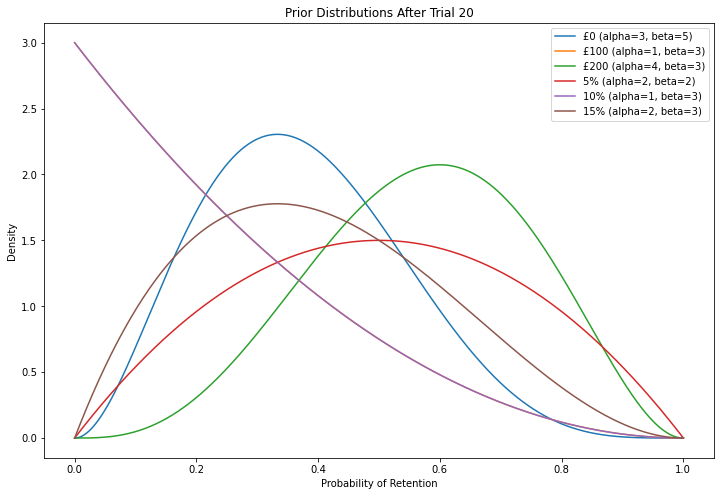

Trial 21: CustomerID = CUST0021, Selected treatment = 5%
Was the customer CUST0021 retained? (y/n): 


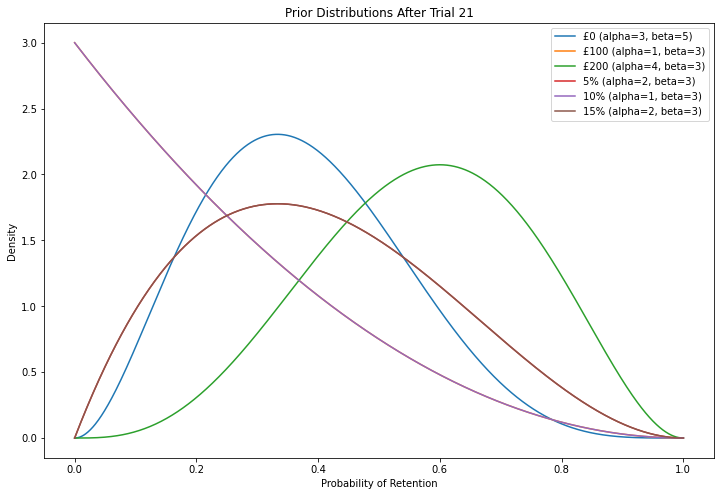

Trial 22: CustomerID = CUST0022, Selected treatment = 10%
Was the customer CUST0022 retained? (y/n): 


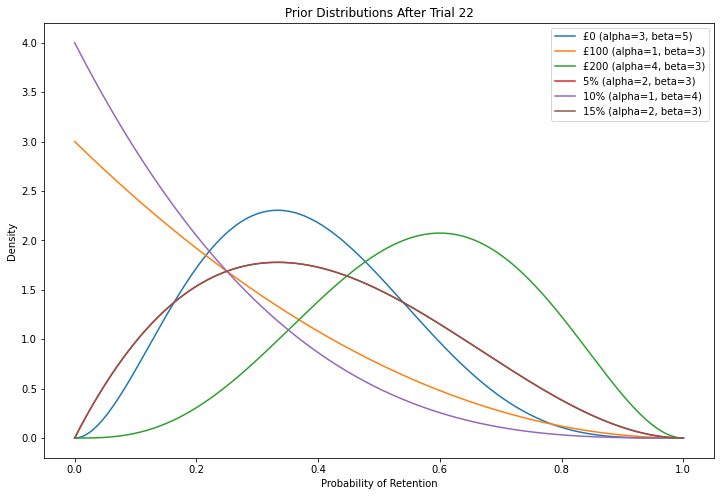

Trial 23: CustomerID = CUST0023, Selected treatment = £200
Was the customer CUST0023 retained? (y/n): 


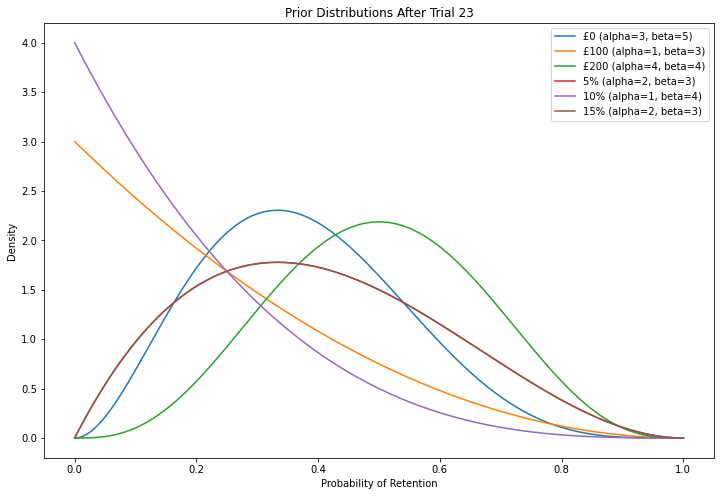

Trial 24: CustomerID = CUST0024, Selected treatment = £100
Was the customer CUST0024 retained? (y/n): 


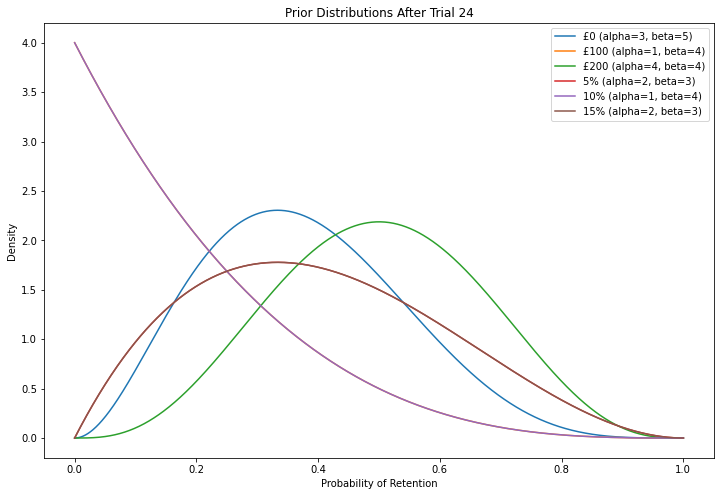

Trial 25: CustomerID = CUST0025, Selected treatment = 5%
Was the customer CUST0025 retained? (y/n): y


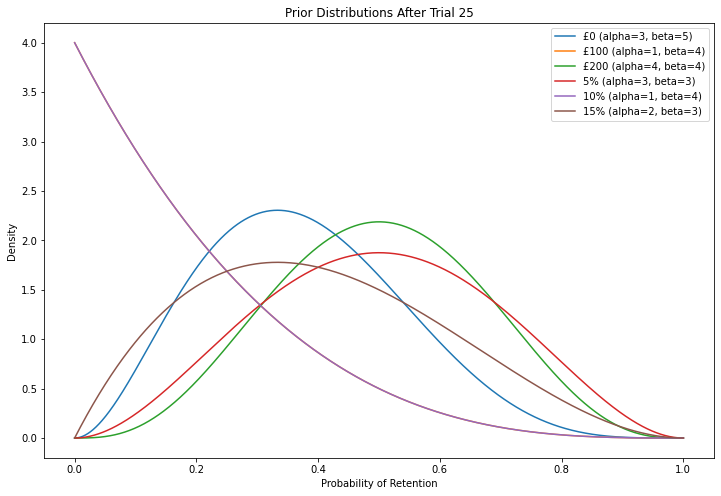

Trial 26: CustomerID = CUST0026, Selected treatment = £0
Was the customer CUST0026 retained? (y/n): y


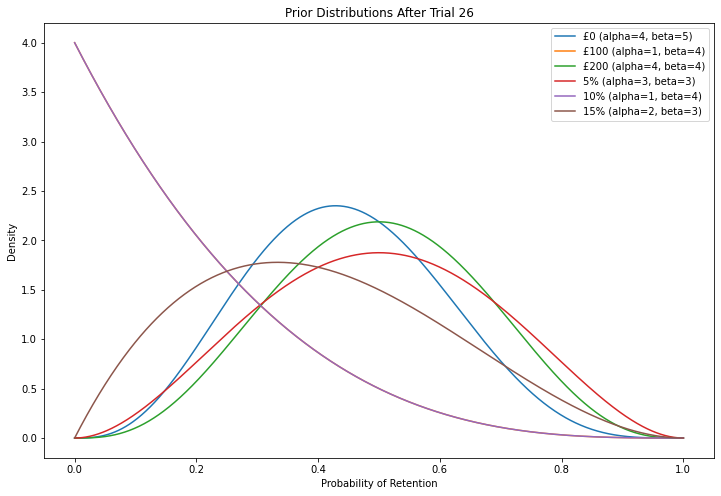

Trial 27: CustomerID = CUST0027, Selected treatment = £200
Was the customer CUST0027 retained? (y/n): 


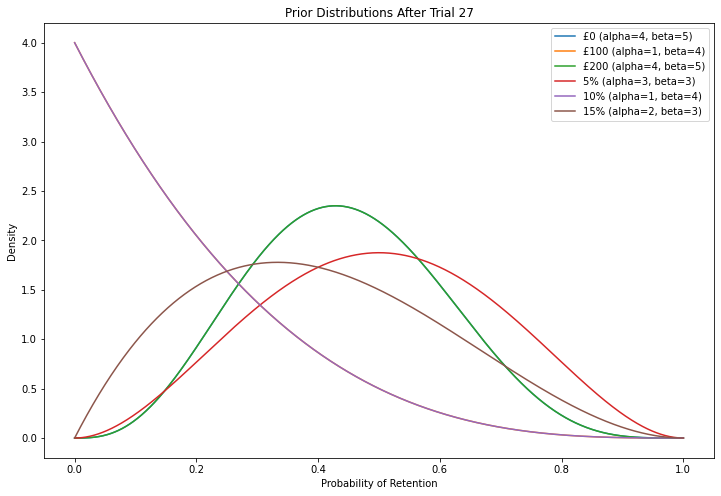

Trial 28: CustomerID = CUST0028, Selected treatment = £0
Was the customer CUST0028 retained? (y/n): 


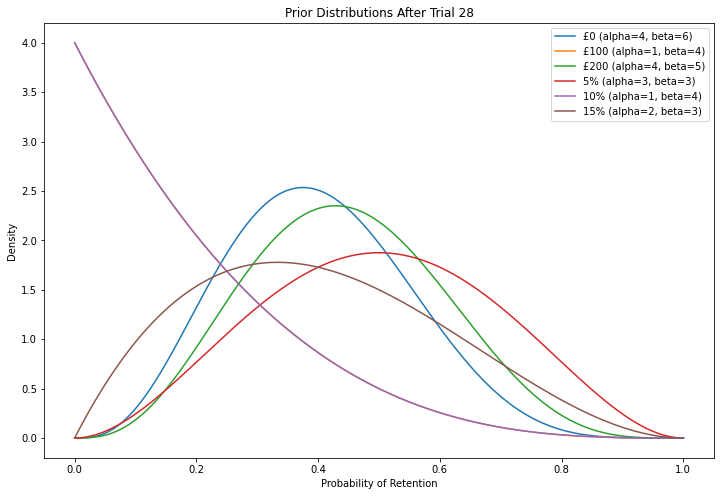

Trial 29: CustomerID = CUST0029, Selected treatment = 15%
Was the customer CUST0029 retained? (y/n): 


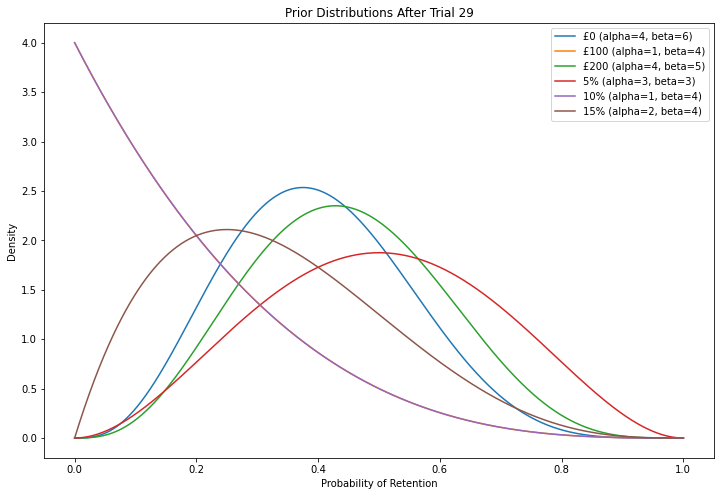

Trial 30: CustomerID = CUST0030, Selected treatment = 15%
Was the customer CUST0030 retained? (y/n): 


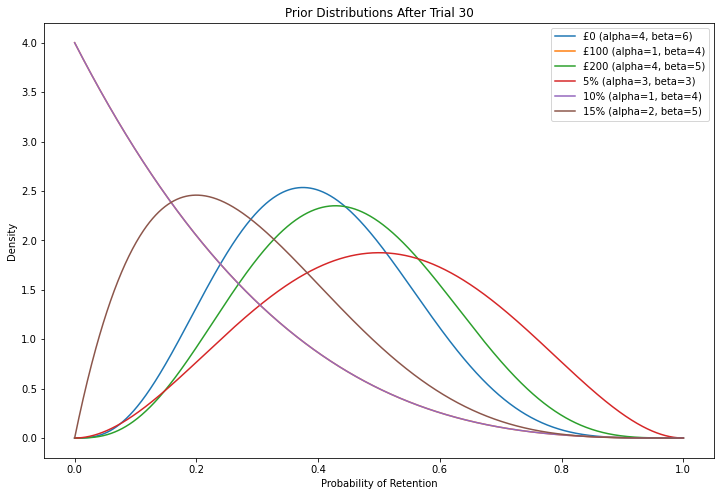

Trial 31: CustomerID = CUST0031, Selected treatment = £0
Was the customer CUST0031 retained? (y/n): 


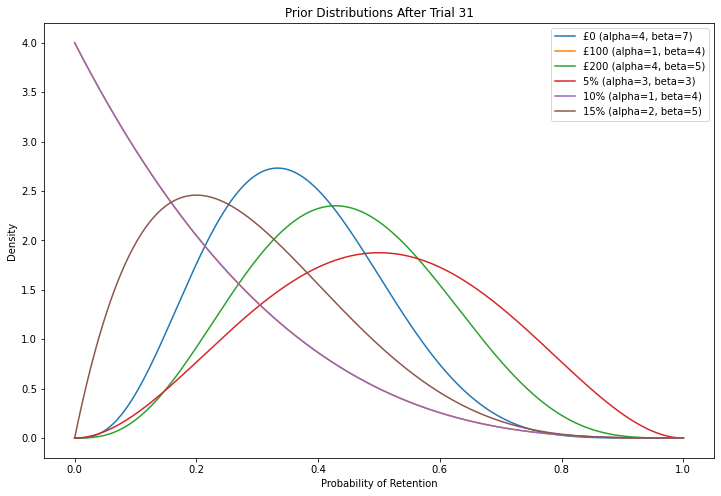

Trial 32: CustomerID = CUST0032, Selected treatment = 5%
Was the customer CUST0032 retained? (y/n): 


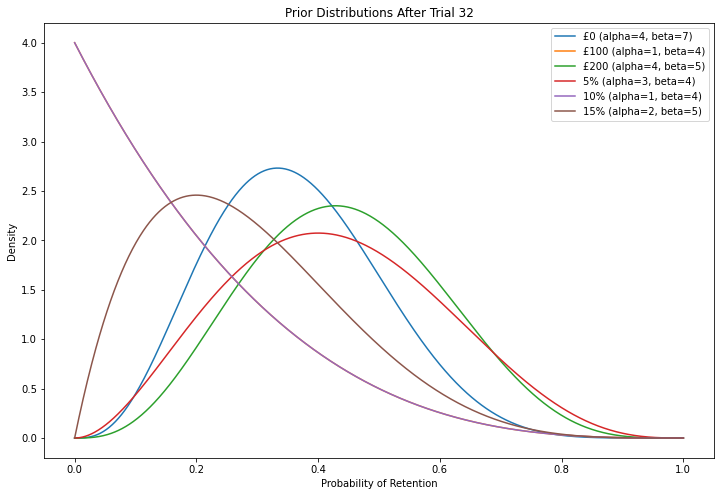

Trial 33: CustomerID = CUST0033, Selected treatment = £0
Was the customer CUST0033 retained? (y/n): 


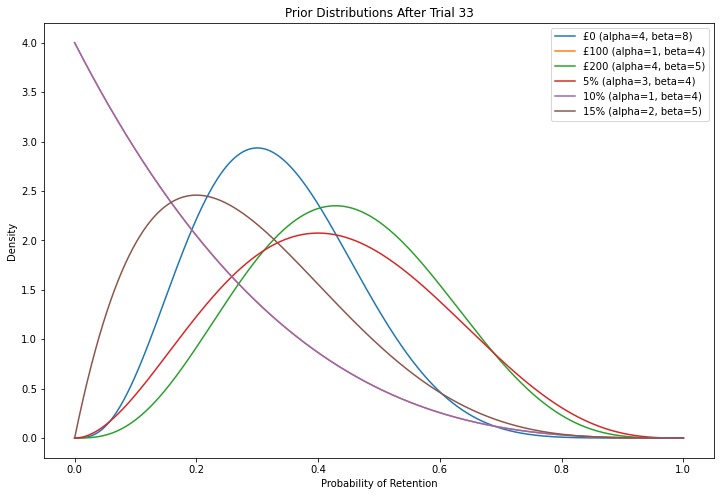

Trial 34: CustomerID = CUST0034, Selected treatment = 15%
Was the customer CUST0034 retained? (y/n): 


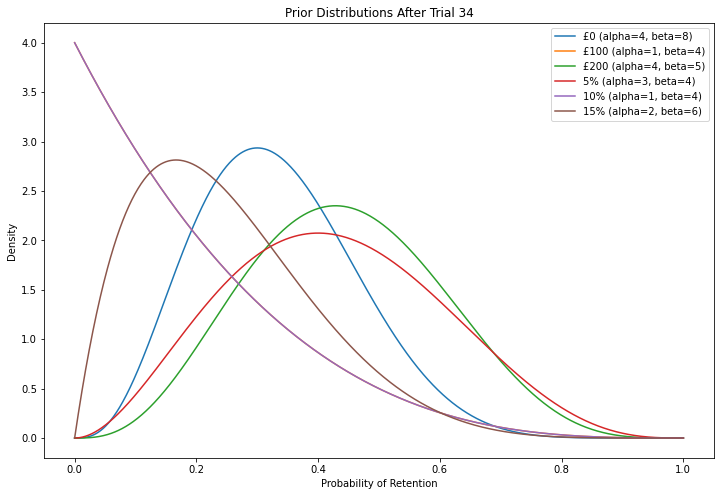

Trial 35: CustomerID = CUST0035, Selected treatment = 5%
Was the customer CUST0035 retained? (y/n): 


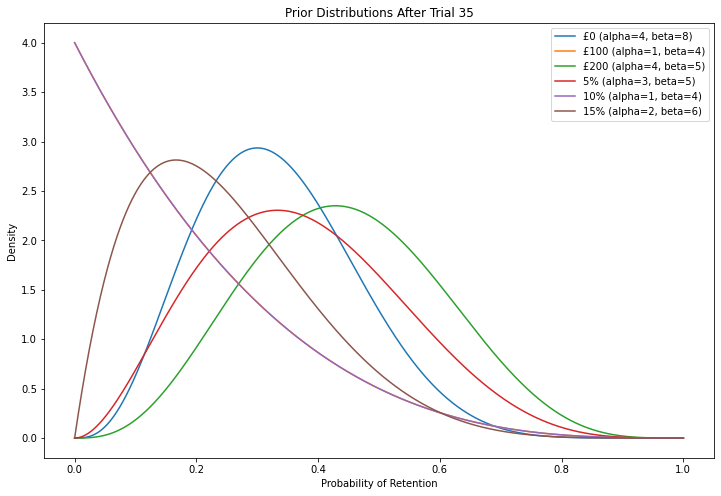

Trial 36: CustomerID = CUST0036, Selected treatment = £200
Was the customer CUST0036 retained? (y/n): 


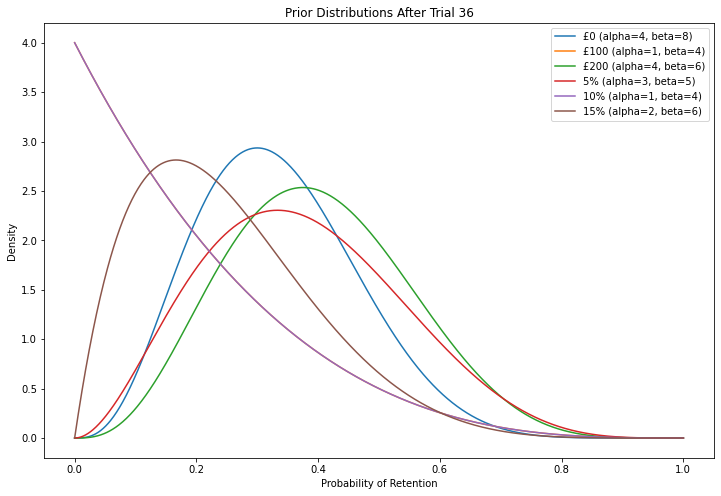

Trial 37: CustomerID = CUST0037, Selected treatment = £200
Was the customer CUST0037 retained? (y/n): 


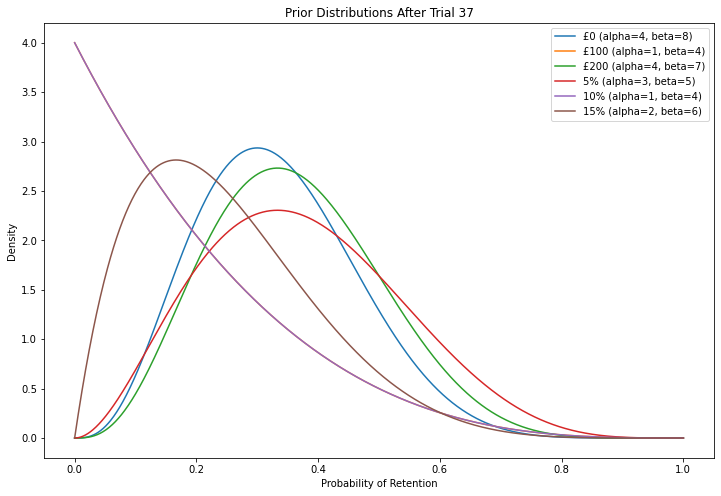

Trial 38: CustomerID = CUST0038, Selected treatment = 5%
Was the customer CUST0038 retained? (y/n): n


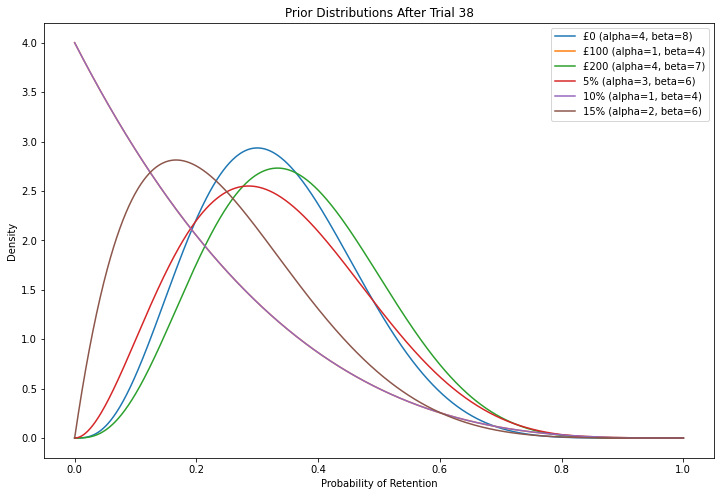

Trial 39: CustomerID = CUST0039, Selected treatment = £0
Was the customer CUST0039 retained? (y/n): 


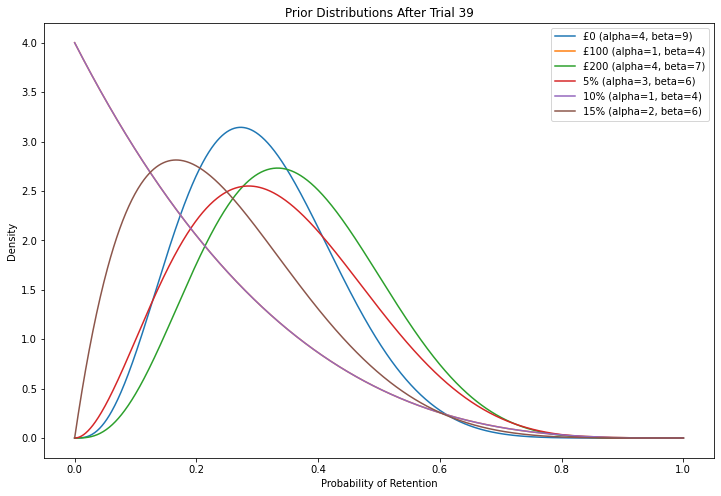

Trial 40: CustomerID = CUST0040, Selected treatment = 10%
Was the customer CUST0040 retained? (y/n): 


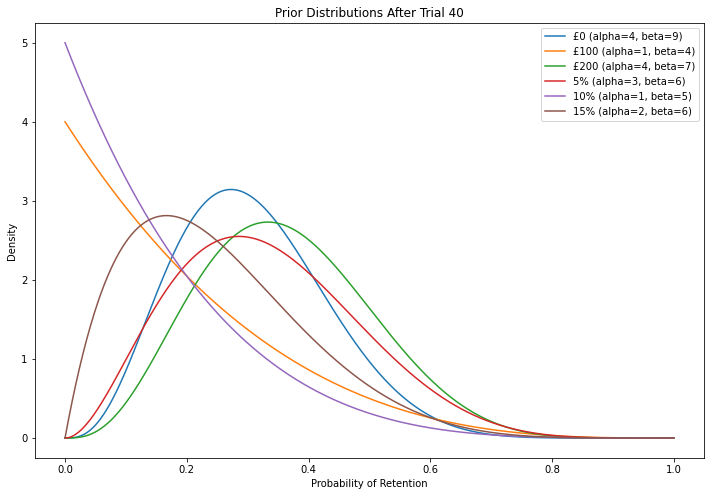

Trial 41: CustomerID = CUST0041, Selected treatment = 5%
Was the customer CUST0041 retained? (y/n): 


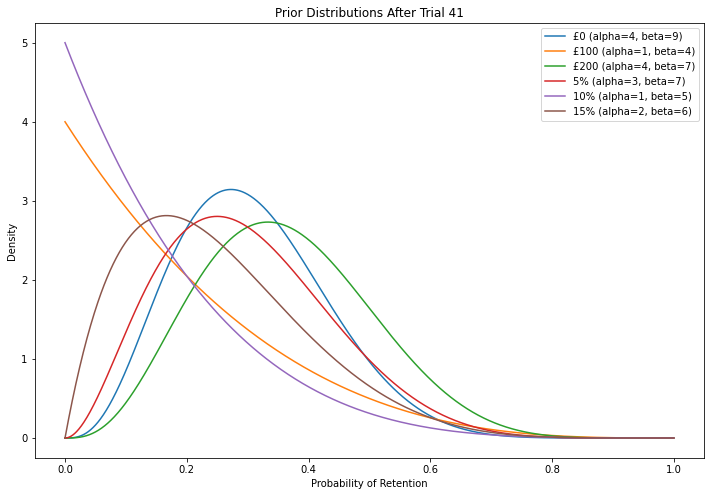

Trial 42: CustomerID = CUST0042, Selected treatment = 5%
Was the customer CUST0042 retained? (y/n): 


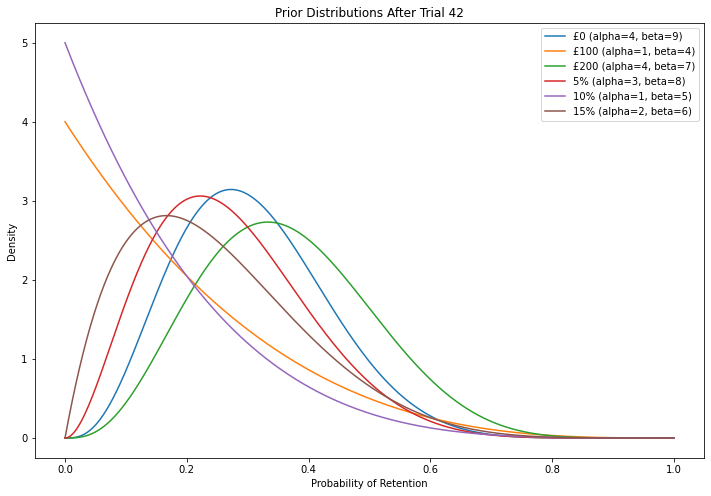

Trial 43: CustomerID = CUST0043, Selected treatment = 15%
Was the customer CUST0043 retained? (y/n): 


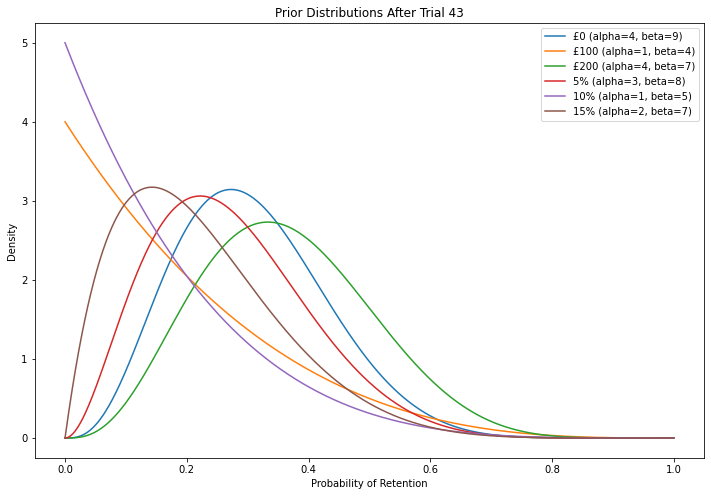

Trial 44: CustomerID = CUST0044, Selected treatment = 10%
Was the customer CUST0044 retained? (y/n): 


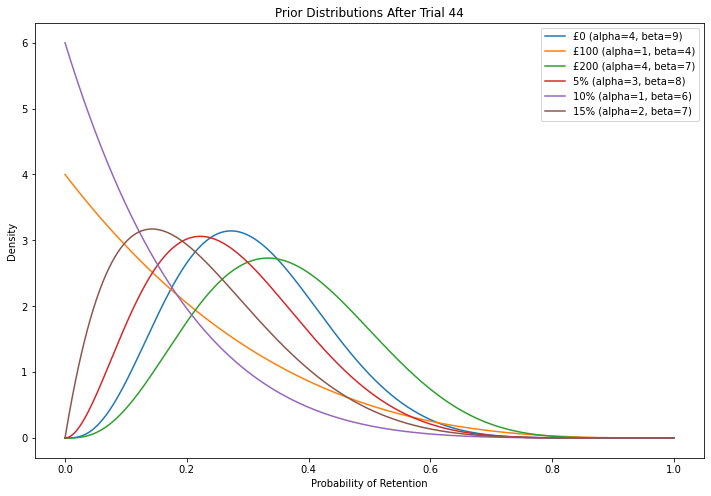

Trial 45: CustomerID = CUST0045, Selected treatment = £200
Was the customer CUST0045 retained? (y/n): 


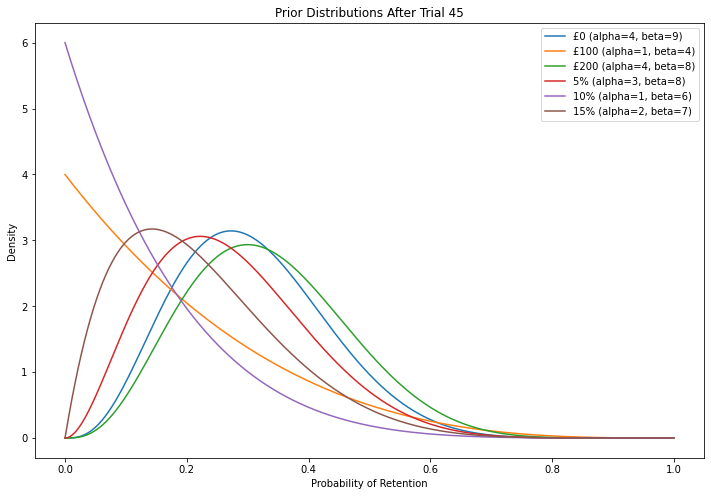

Trial 46: CustomerID = CUST0046, Selected treatment = 10%
Was the customer CUST0046 retained? (y/n): 


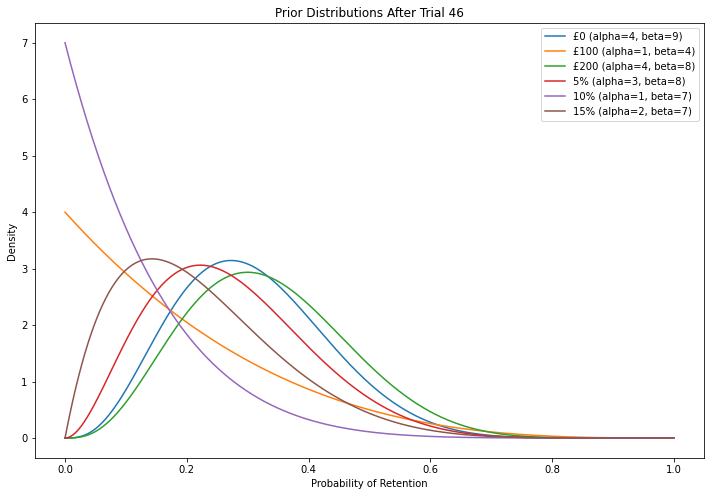

Trial 47: CustomerID = CUST0047, Selected treatment = £200
Was the customer CUST0047 retained? (y/n): n


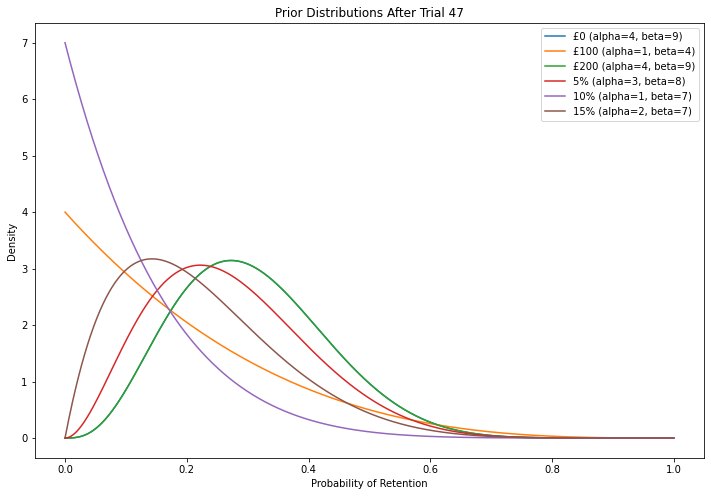

Trial 48: CustomerID = CUST0048, Selected treatment = 15%
Was the customer CUST0048 retained? (y/n): 


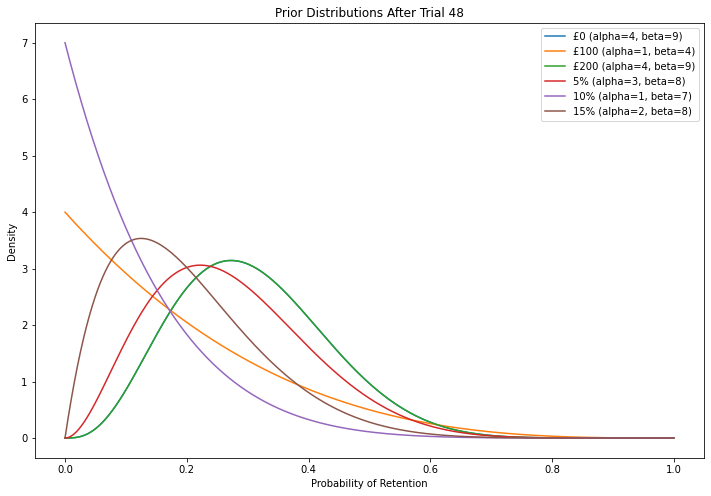

Trial 49: CustomerID = CUST0049, Selected treatment = 5%
Was the customer CUST0049 retained? (y/n): y


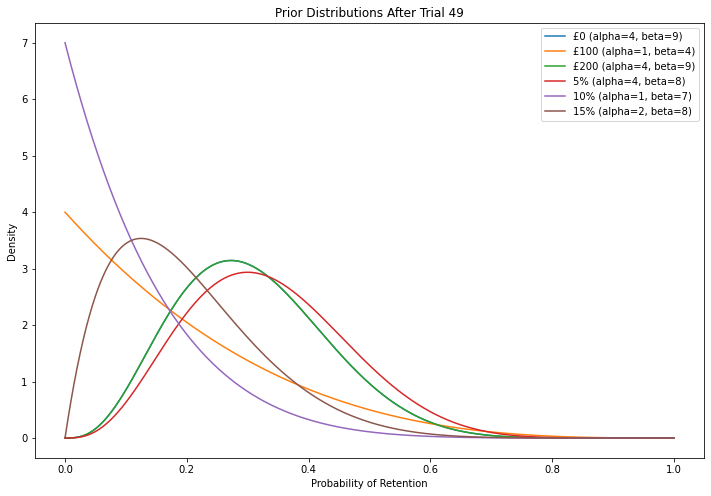

Trial 50: CustomerID = CUST0050, Selected treatment = £100
Was the customer CUST0050 retained? (y/n): 


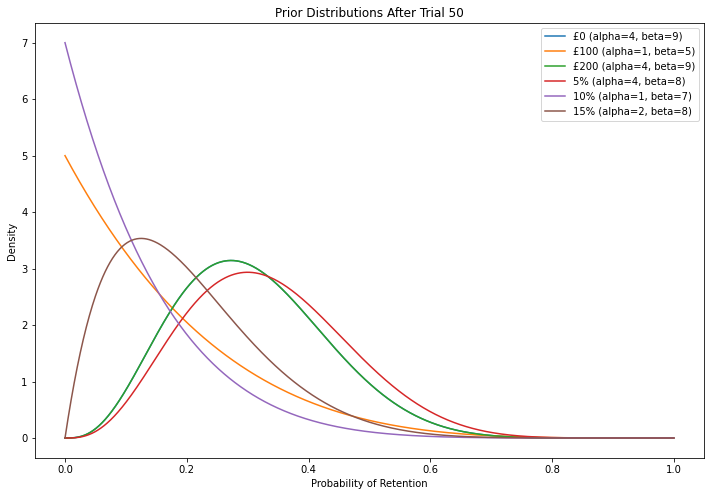

Trial 51: CustomerID = CUST0051, Selected treatment = 10%
Was the customer CUST0051 retained? (y/n): 


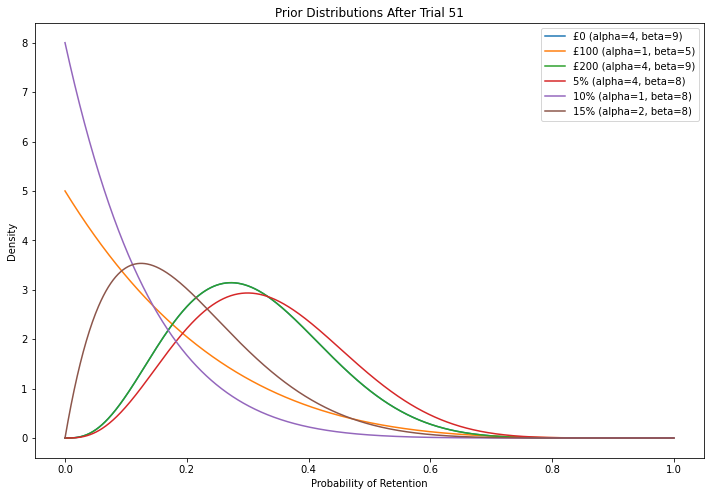

Trial 52: CustomerID = CUST0052, Selected treatment = 5%
Was the customer CUST0052 retained? (y/n): 


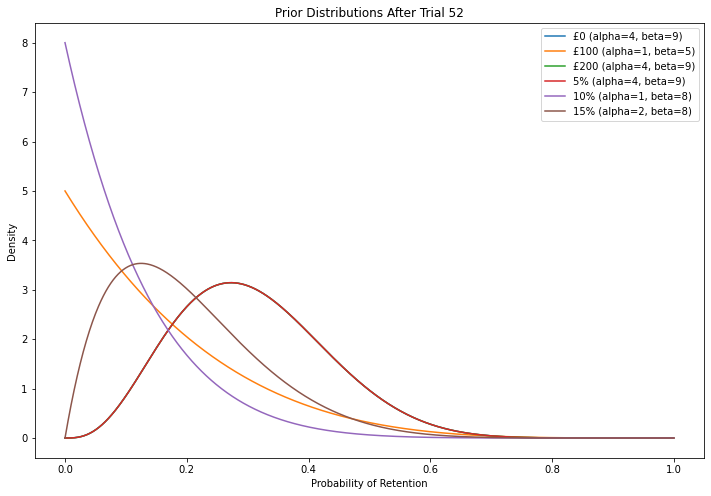

Trial 53: CustomerID = CUST0053, Selected treatment = £0
Was the customer CUST0053 retained? (y/n): 


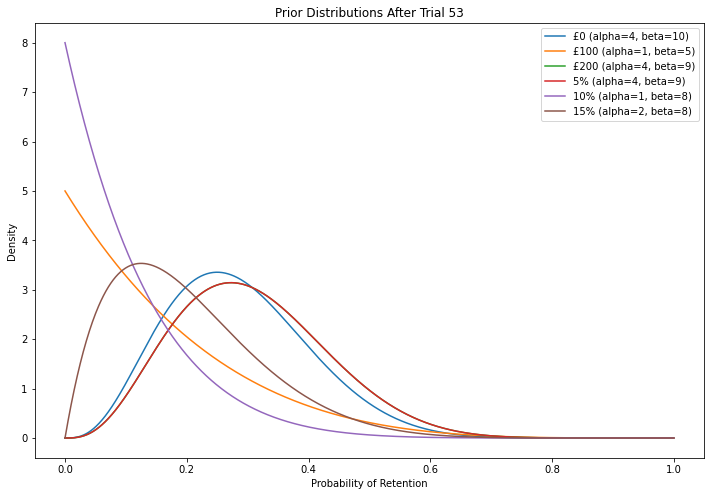

Trial 54: CustomerID = CUST0054, Selected treatment = £200
Was the customer CUST0054 retained? (y/n): 


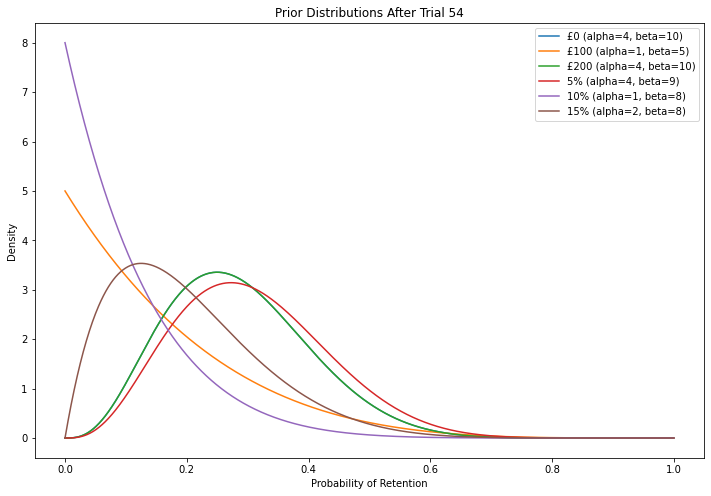

Trial 55: CustomerID = CUST0055, Selected treatment = 5%
Was the customer CUST0055 retained? (y/n): 


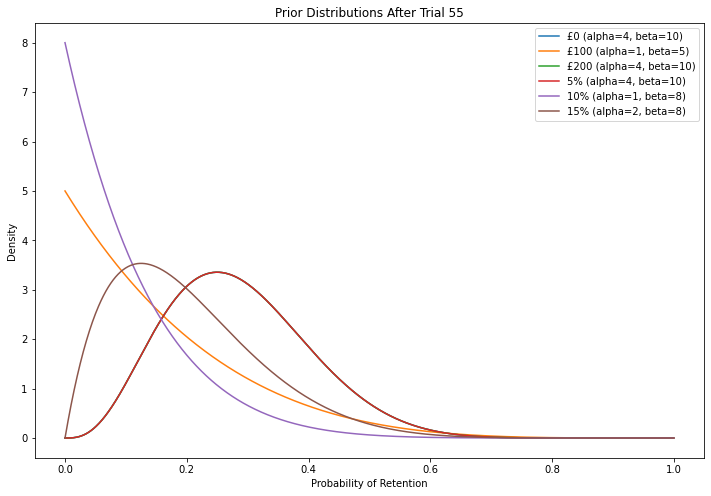

Trial 56: CustomerID = CUST0056, Selected treatment = 5%
Was the customer CUST0056 retained? (y/n): 


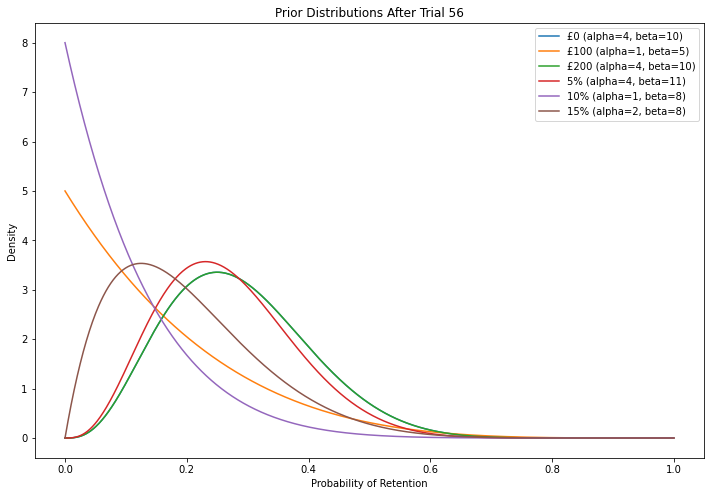

Trial 57: CustomerID = CUST0057, Selected treatment = 10%
Was the customer CUST0057 retained? (y/n): 


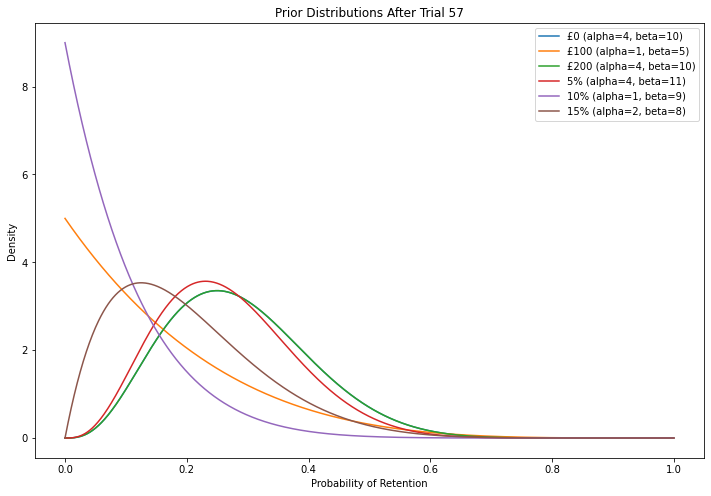

Trial 58: CustomerID = CUST0058, Selected treatment = £200
Was the customer CUST0058 retained? (y/n): 


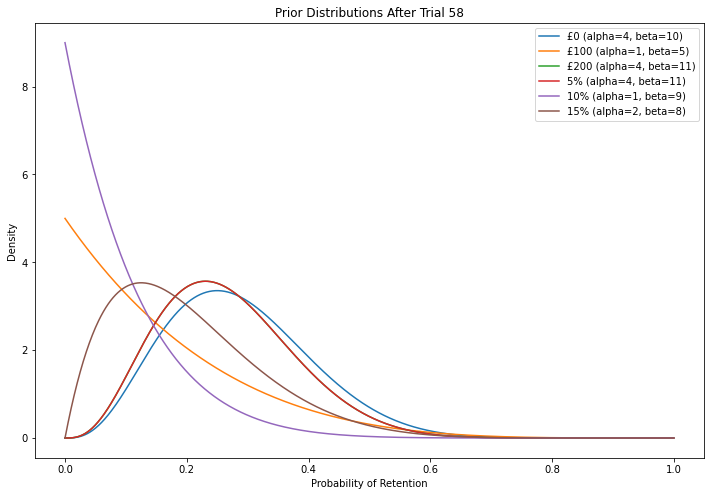

Trial 59: CustomerID = CUST0059, Selected treatment = 10%
Was the customer CUST0059 retained? (y/n): 


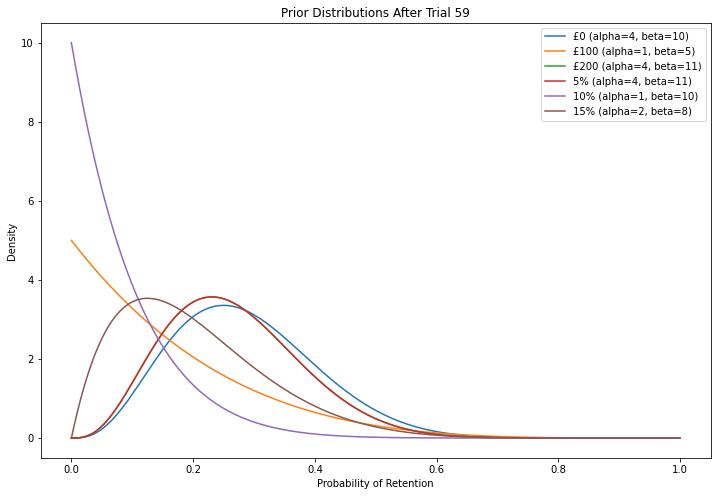

Trial 60: CustomerID = CUST0060, Selected treatment = £0
Was the customer CUST0060 retained? (y/n): 


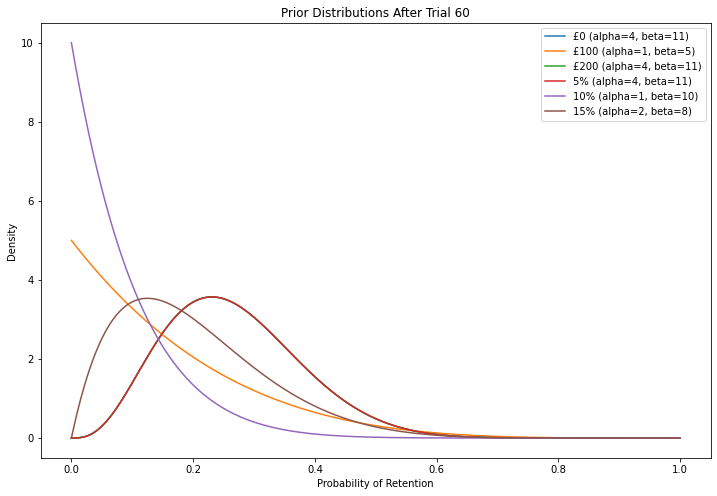

Trial 61: CustomerID = CUST0061, Selected treatment = £0
Was the customer CUST0061 retained? (y/n): 


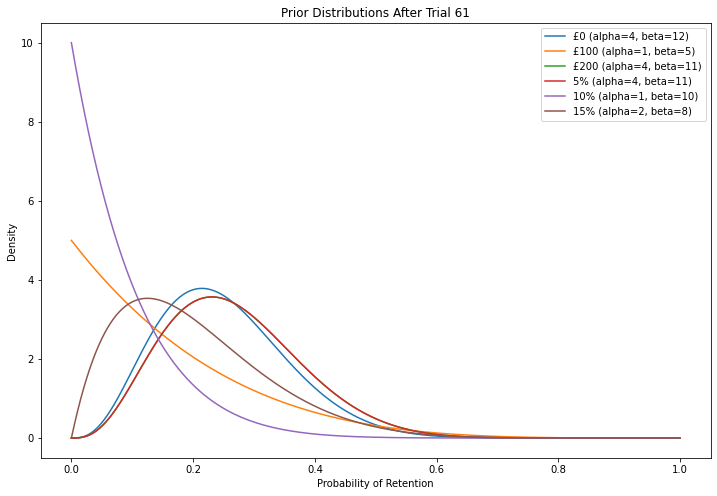

Trial 62: CustomerID = CUST0062, Selected treatment = £200
Was the customer CUST0062 retained? (y/n): 


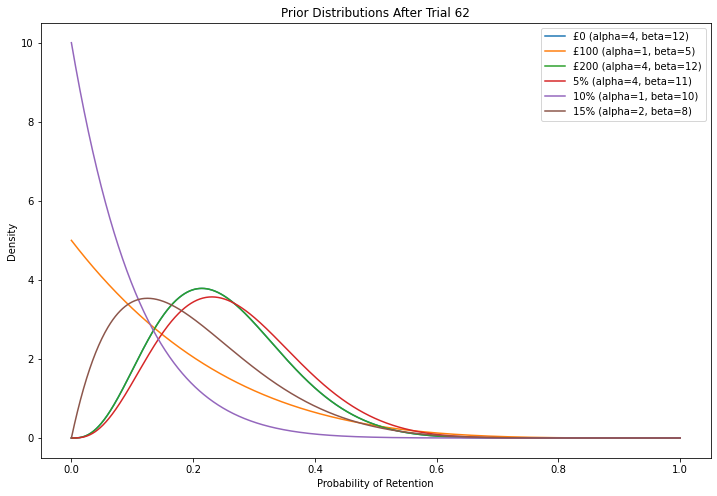

Trial 63: CustomerID = CUST0063, Selected treatment = £200
Was the customer CUST0063 retained? (y/n): 


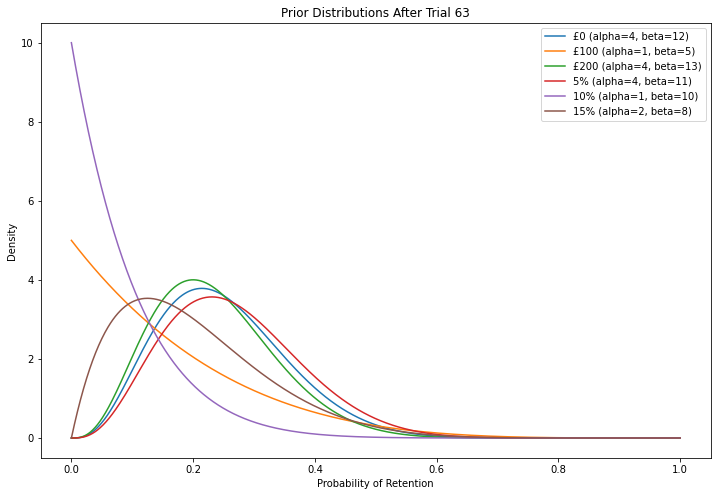

Trial 64: CustomerID = CUST0064, Selected treatment = 5%
Was the customer CUST0064 retained? (y/n): 


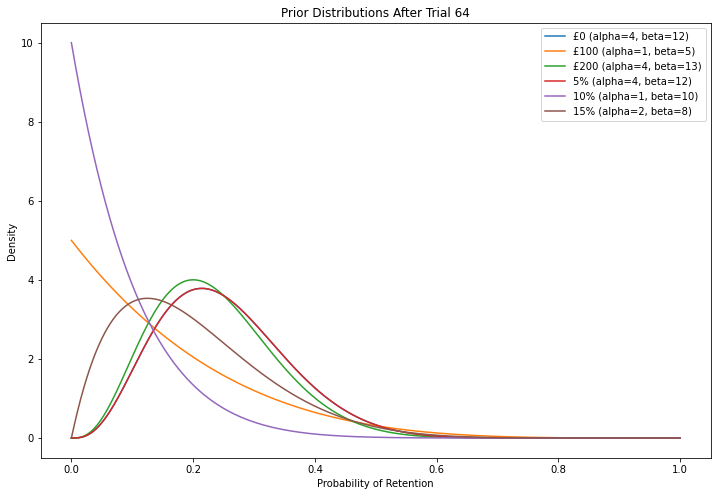

Trial 65: CustomerID = CUST0065, Selected treatment = £200
Was the customer CUST0065 retained? (y/n): 


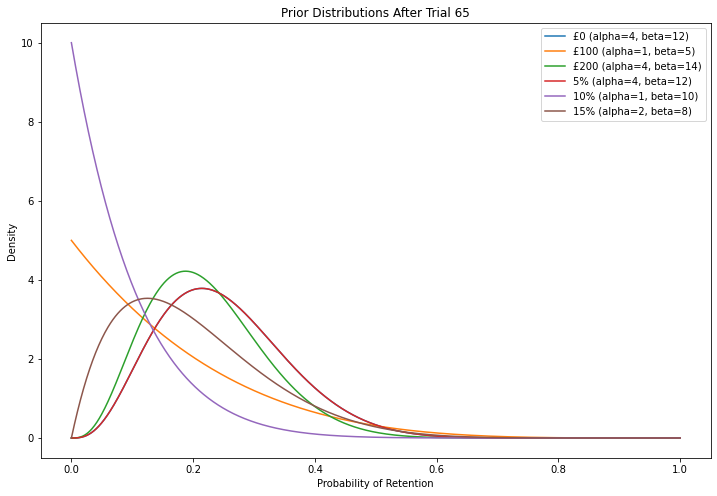

Trial 66: CustomerID = CUST0066, Selected treatment = £200
Was the customer CUST0066 retained? (y/n): 


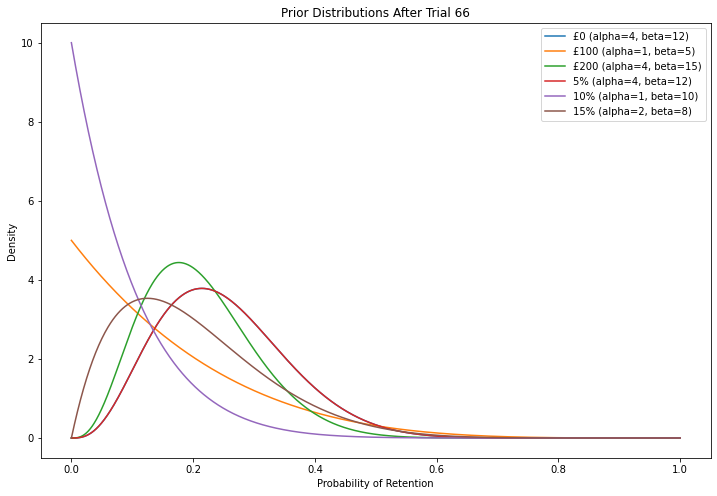

Trial 67: CustomerID = CUST0067, Selected treatment = 10%
Was the customer CUST0067 retained? (y/n): n


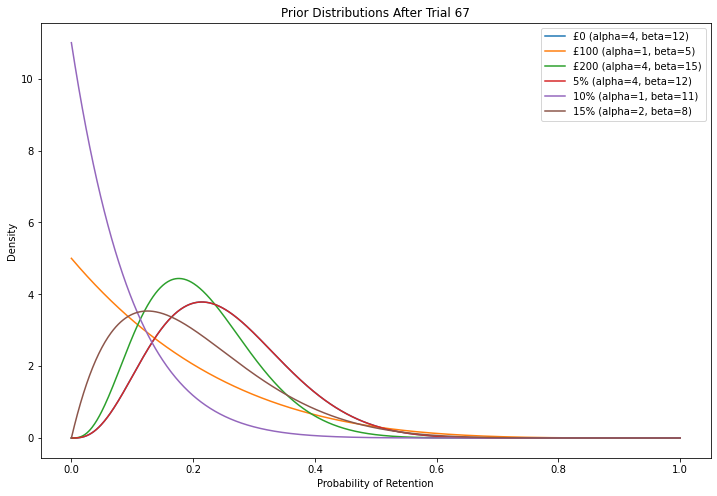

Trial 68: CustomerID = CUST0068, Selected treatment = 5%
Was the customer CUST0068 retained? (y/n): 


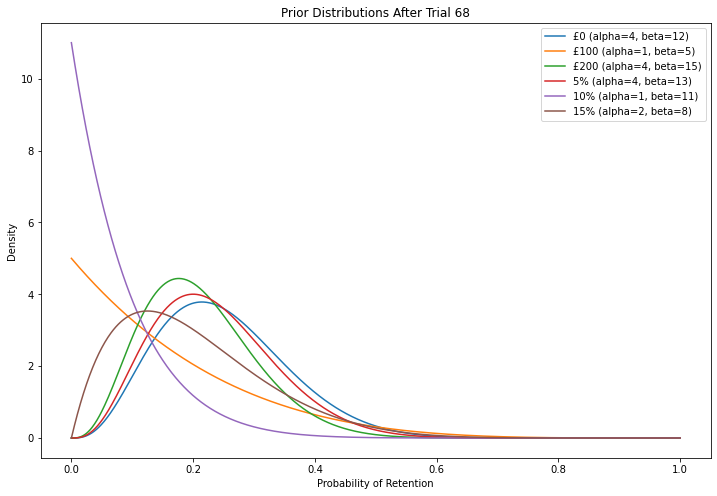

Trial 69: CustomerID = CUST0069, Selected treatment = 5%
Was the customer CUST0069 retained? (y/n): n


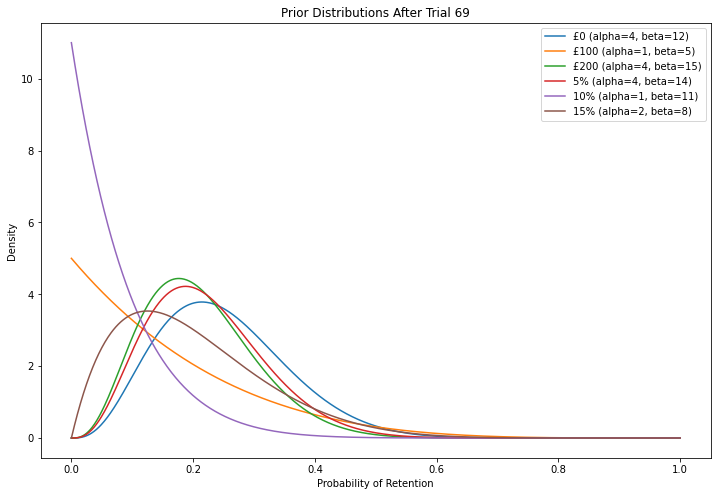

Trial 70: CustomerID = CUST0070, Selected treatment = £0
Was the customer CUST0070 retained? (y/n): n


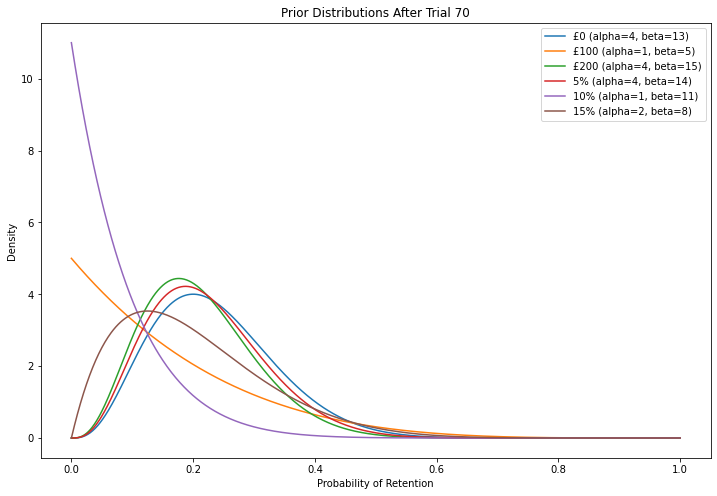

Trial 71: CustomerID = CUST0071, Selected treatment = £200
Was the customer CUST0071 retained? (y/n): 


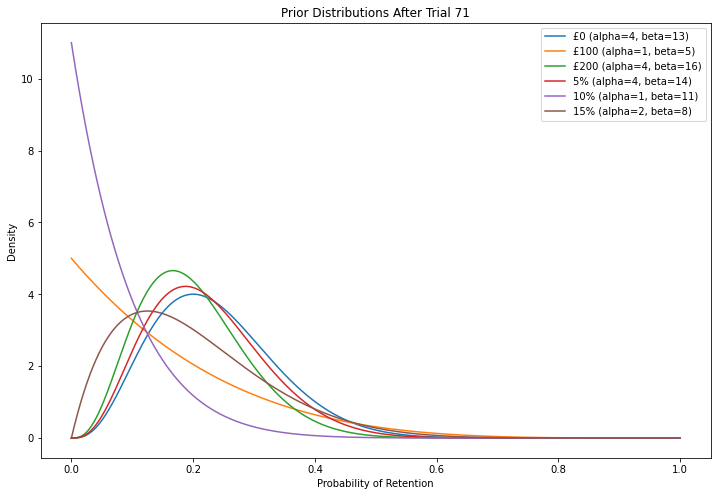

Trial 72: CustomerID = CUST0072, Selected treatment = £200
Was the customer CUST0072 retained? (y/n): 


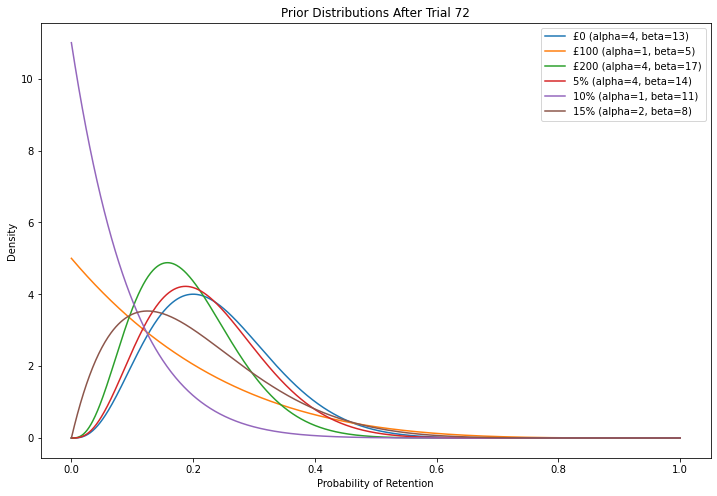

Trial 73: CustomerID = CUST0073, Selected treatment = 5%
Was the customer CUST0073 retained? (y/n): 


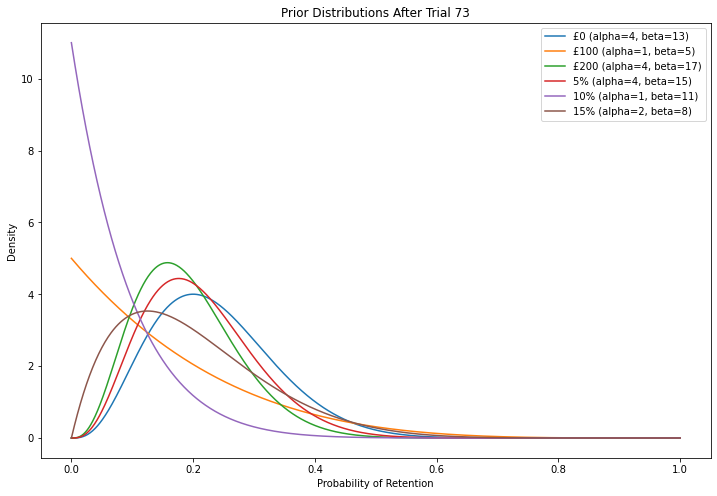

Trial 74: CustomerID = CUST0074, Selected treatment = £100
Was the customer CUST0074 retained? (y/n): 


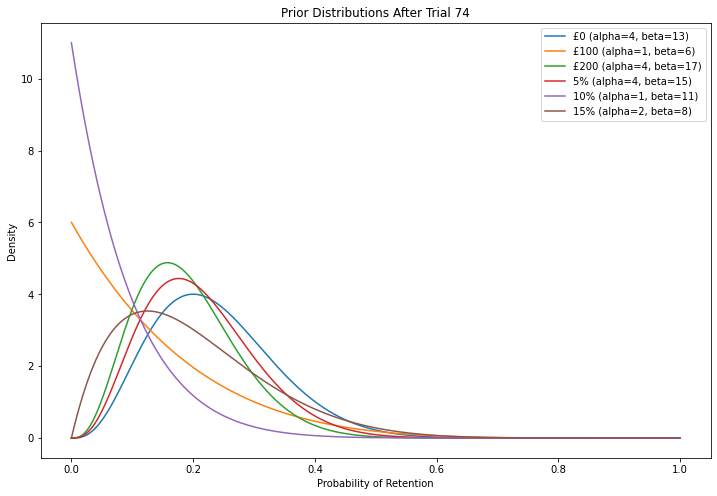

Trial 75: CustomerID = CUST0075, Selected treatment = £0
Was the customer CUST0075 retained? (y/n): 


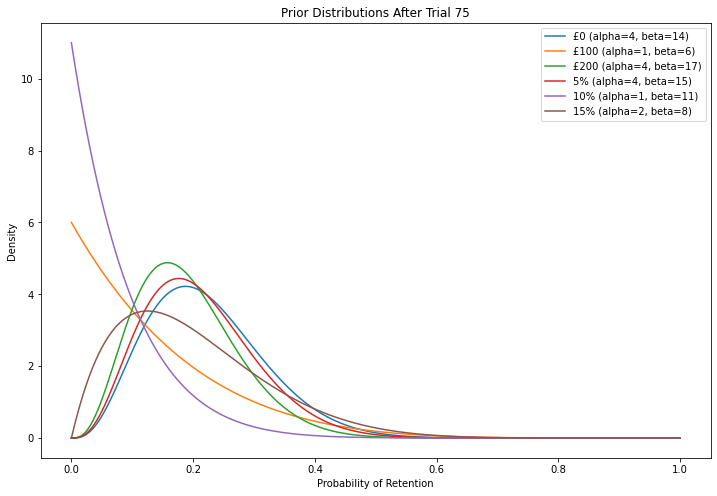

Trial 76: CustomerID = CUST0076, Selected treatment = £0
Was the customer CUST0076 retained? (y/n): 


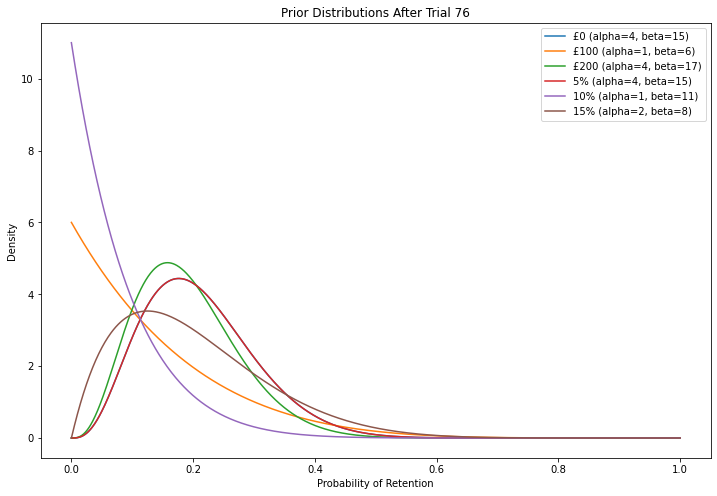

Trial 77: CustomerID = CUST0077, Selected treatment = 5%
Was the customer CUST0077 retained? (y/n): 


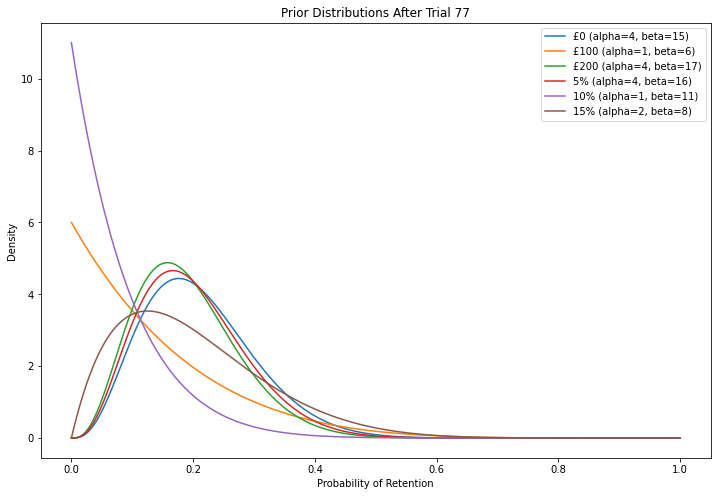

Trial 78: CustomerID = CUST0078, Selected treatment = £200
Was the customer CUST0078 retained? (y/n): 


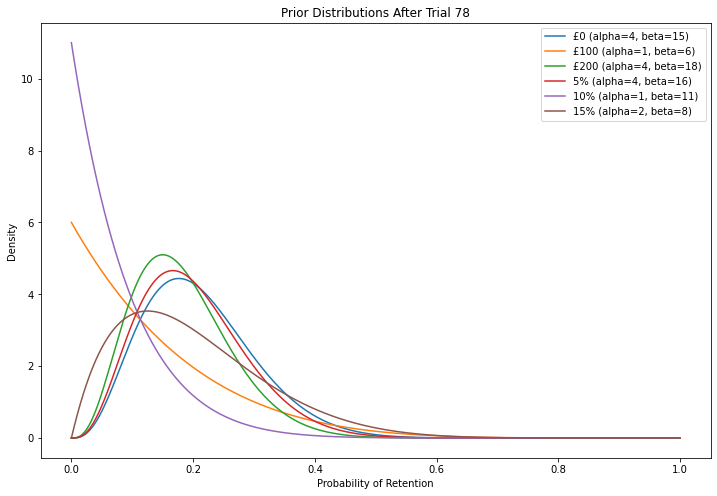

Trial 79: CustomerID = CUST0079, Selected treatment = £0
Was the customer CUST0079 retained? (y/n): 


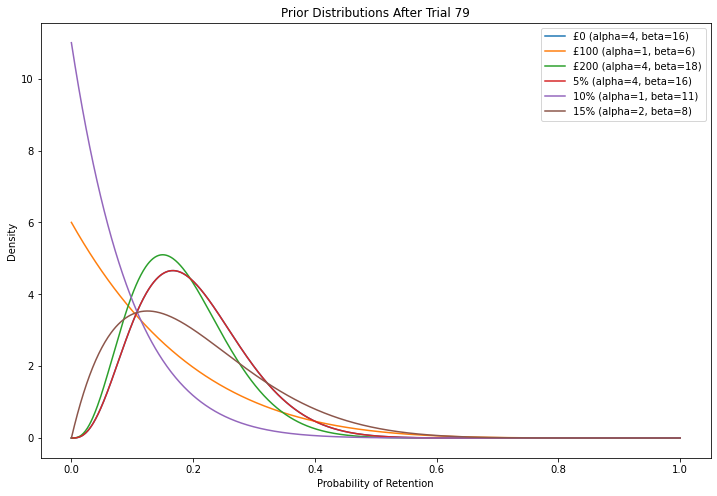

Trial 80: CustomerID = CUST0080, Selected treatment = 10%
Was the customer CUST0080 retained? (y/n): 


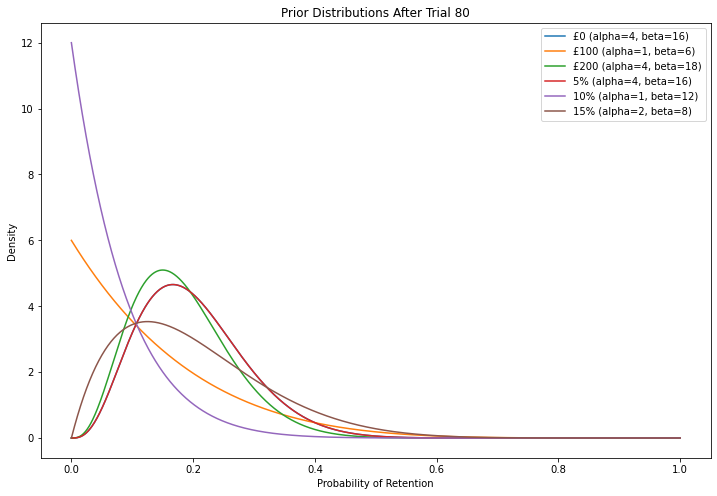

Trial 81: CustomerID = CUST0081, Selected treatment = 5%
Was the customer CUST0081 retained? (y/n): 


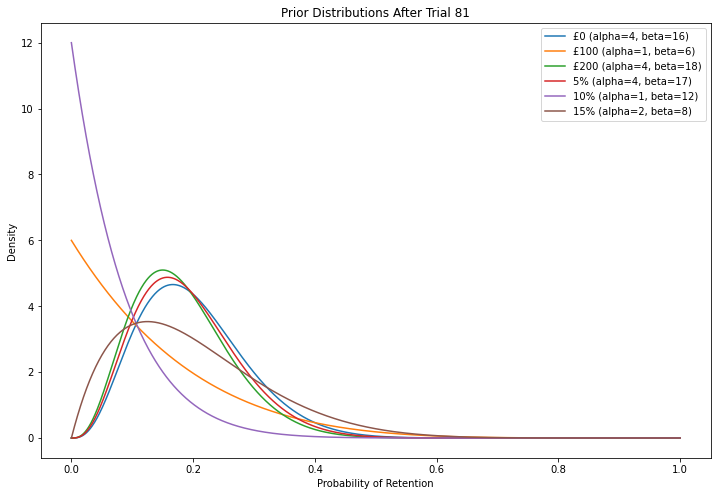

Trial 82: CustomerID = CUST0082, Selected treatment = £100
Was the customer CUST0082 retained? (y/n): 


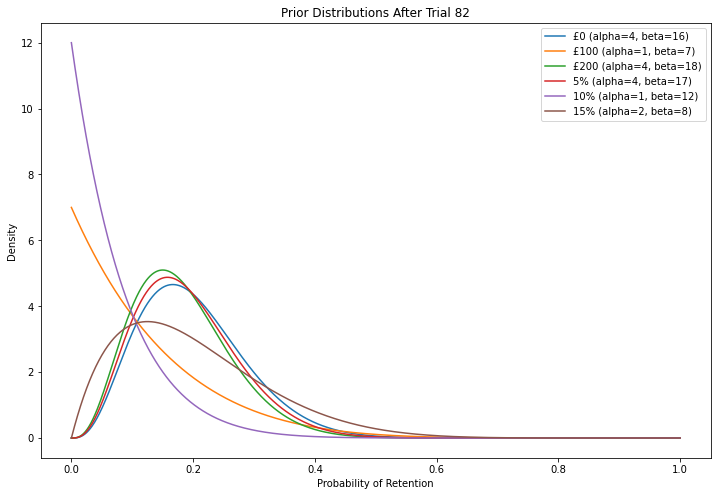

Trial 83: CustomerID = CUST0083, Selected treatment = £200
Was the customer CUST0083 retained? (y/n): 


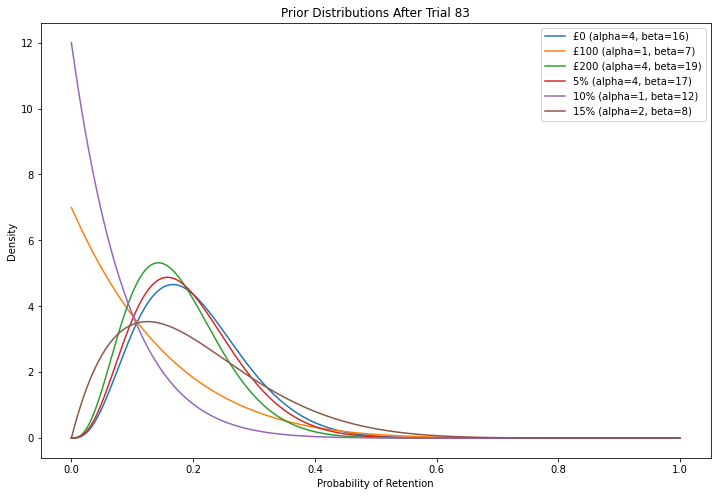

Trial 84: CustomerID = CUST0084, Selected treatment = 15%
Was the customer CUST0084 retained? (y/n): 


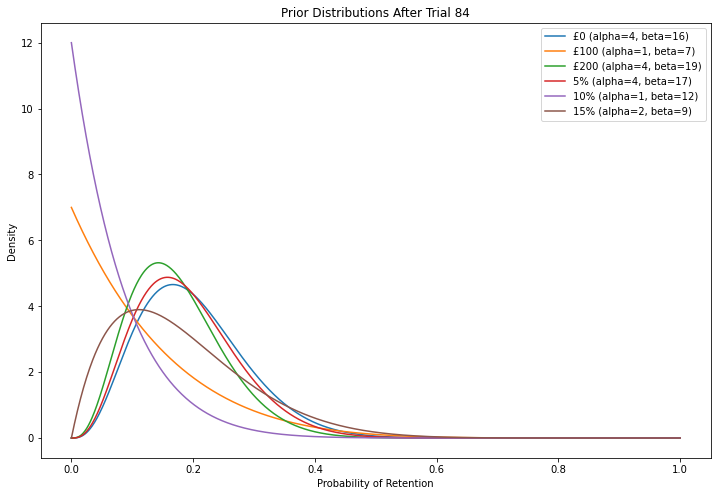

Trial 85: CustomerID = CUST0085, Selected treatment = 5%
Was the customer CUST0085 retained? (y/n): 


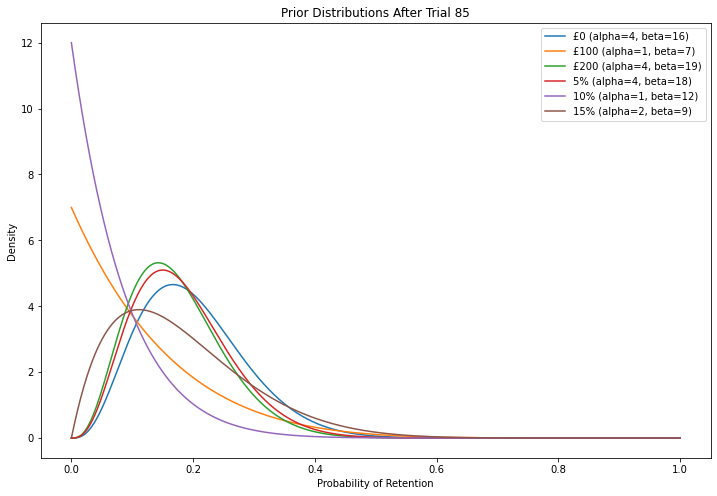

Trial 86: CustomerID = CUST0086, Selected treatment = £0
Was the customer CUST0086 retained? (y/n): 


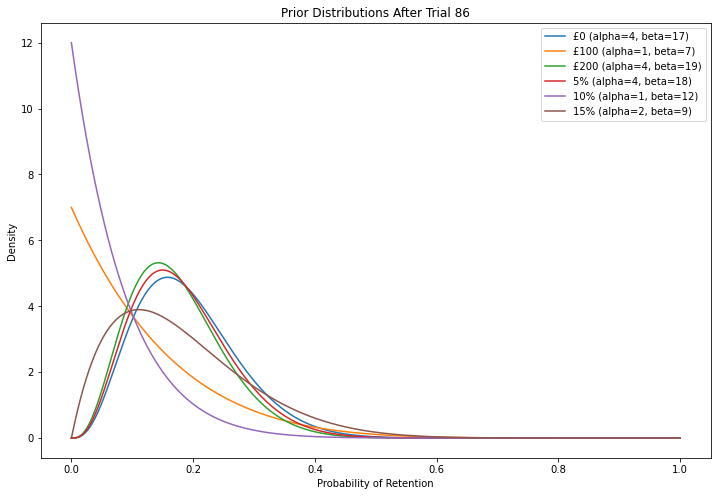

Trial 87: CustomerID = CUST0087, Selected treatment = 15%
Was the customer CUST0087 retained? (y/n): 


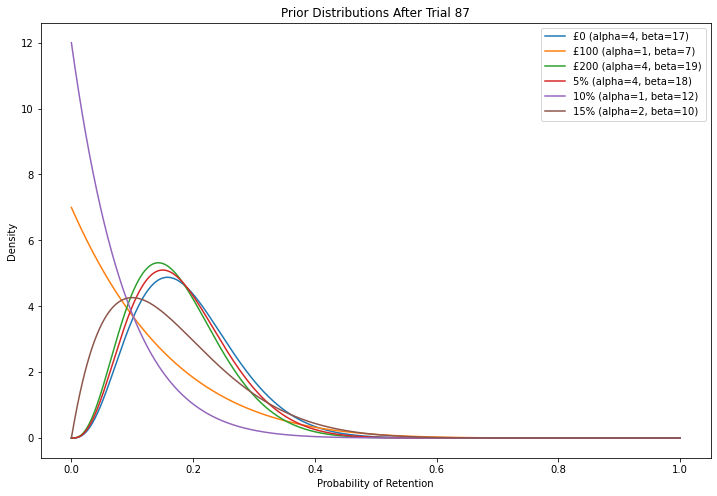

Trial 88: CustomerID = CUST0088, Selected treatment = 15%
Was the customer CUST0088 retained? (y/n): 


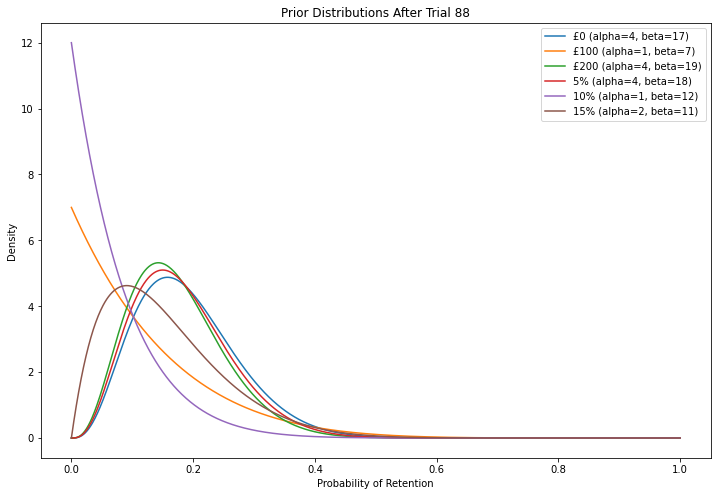

Trial 89: CustomerID = CUST0089, Selected treatment = 15%
Was the customer CUST0089 retained? (y/n): 


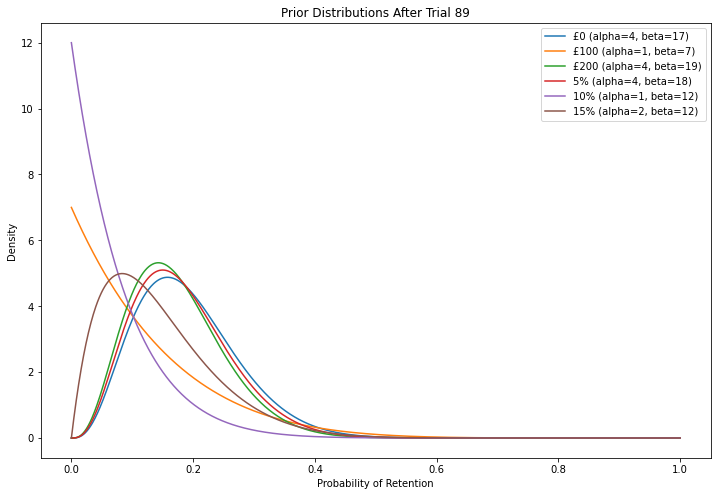

Trial 90: CustomerID = CUST0090, Selected treatment = 15%
Was the customer CUST0090 retained? (y/n): 


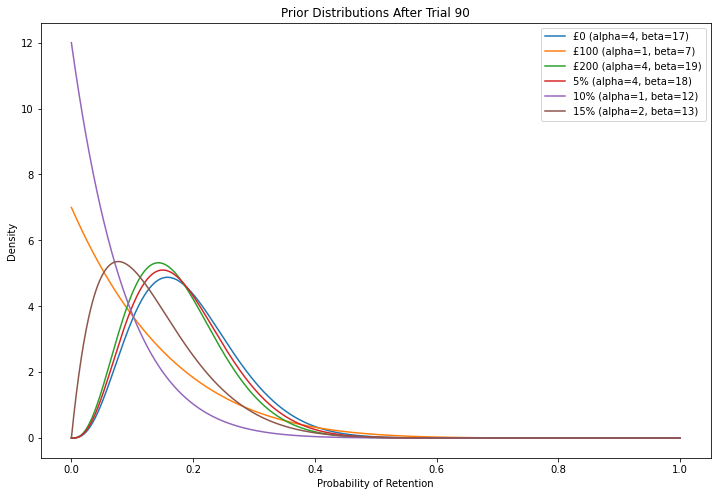

Trial 91: CustomerID = CUST0091, Selected treatment = 5%
Was the customer CUST0091 retained? (y/n): y


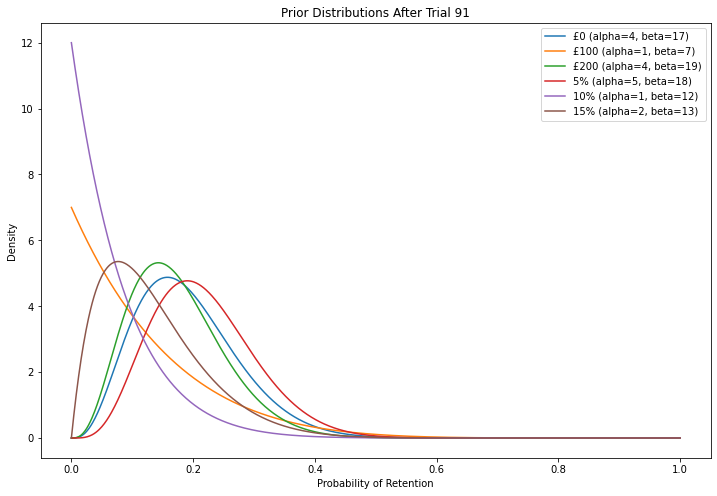

Trial 92: CustomerID = CUST0092, Selected treatment = 5%
Was the customer CUST0092 retained? (y/n): 


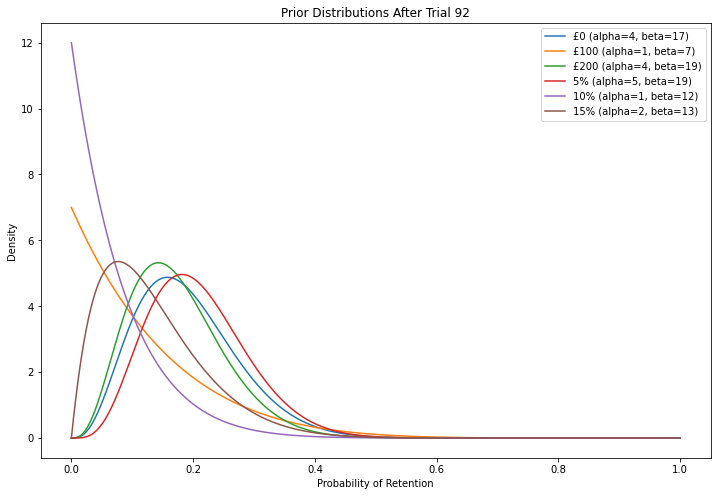

Trial 93: CustomerID = CUST0093, Selected treatment = £0
Was the customer CUST0093 retained? (y/n): 


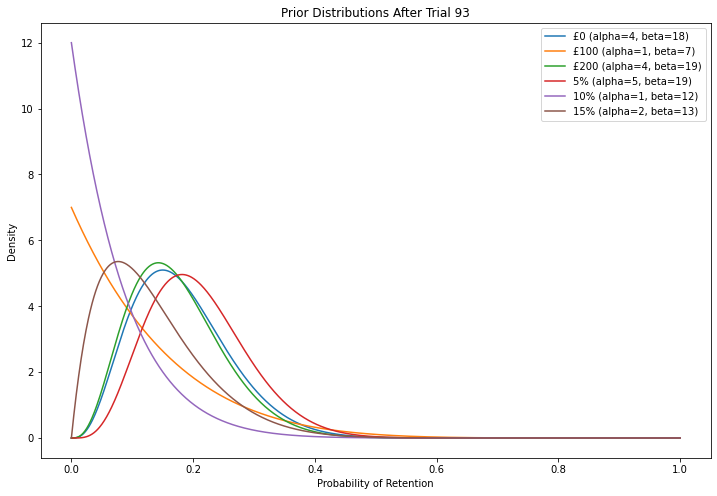

Trial 94: CustomerID = CUST0094, Selected treatment = 5%
Was the customer CUST0094 retained? (y/n): 


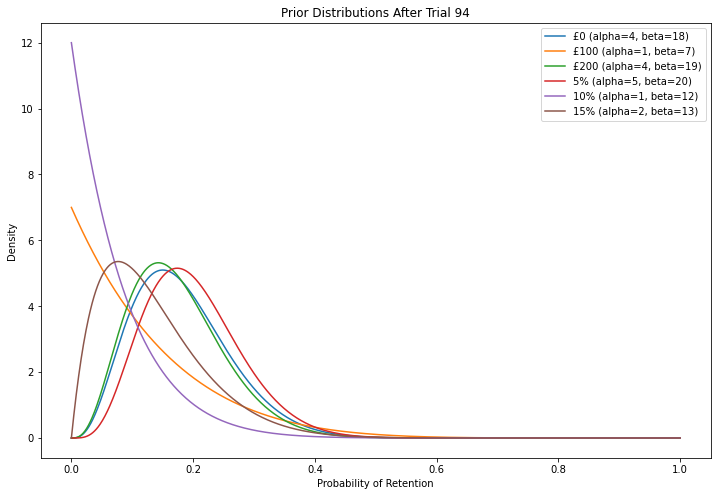

Trial 95: CustomerID = CUST0095, Selected treatment = £200
Was the customer CUST0095 retained? (y/n): 


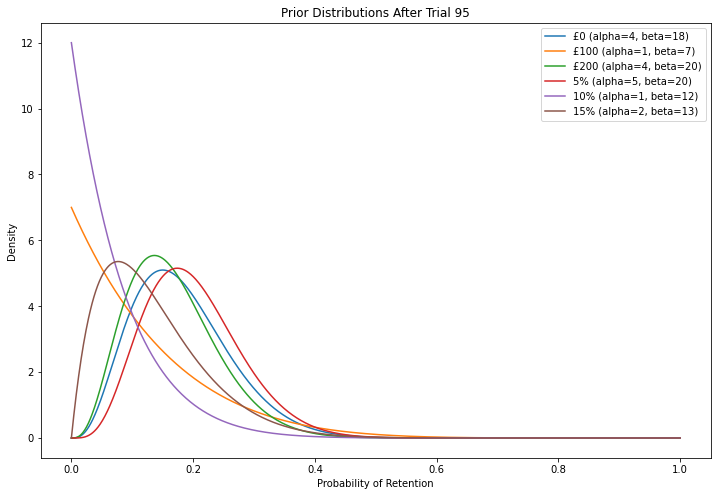

Trial 96: CustomerID = CUST0096, Selected treatment = £0
Was the customer CUST0096 retained? (y/n): 


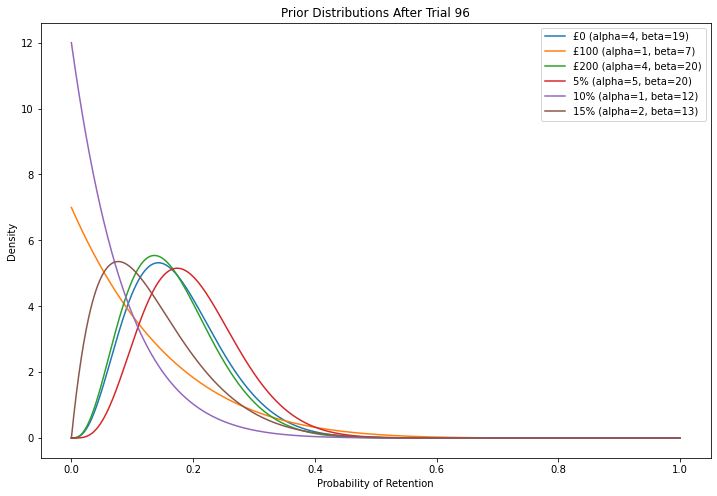

Trial 97: CustomerID = CUST0097, Selected treatment = £0
Was the customer CUST0097 retained? (y/n): 


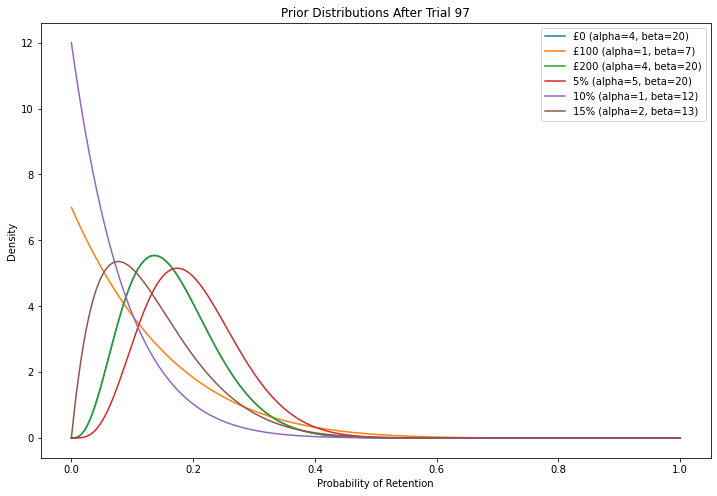

Trial 98: CustomerID = CUST0098, Selected treatment = 5%
Was the customer CUST0098 retained? (y/n): 


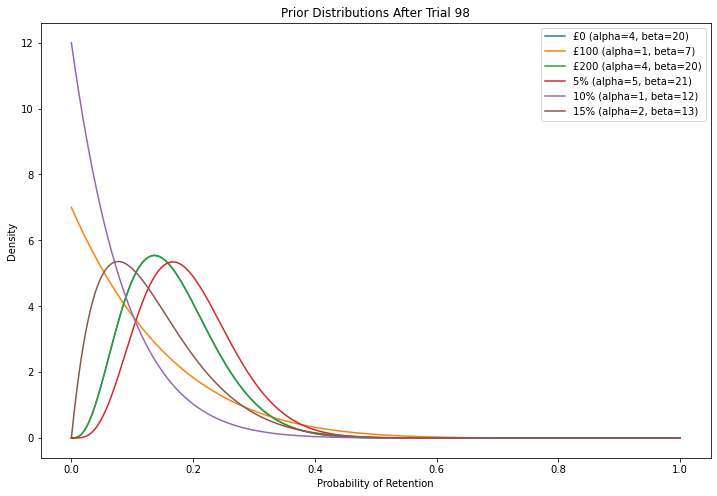

Trial 99: CustomerID = CUST0099, Selected treatment = 15%
Was the customer CUST0099 retained? (y/n): 


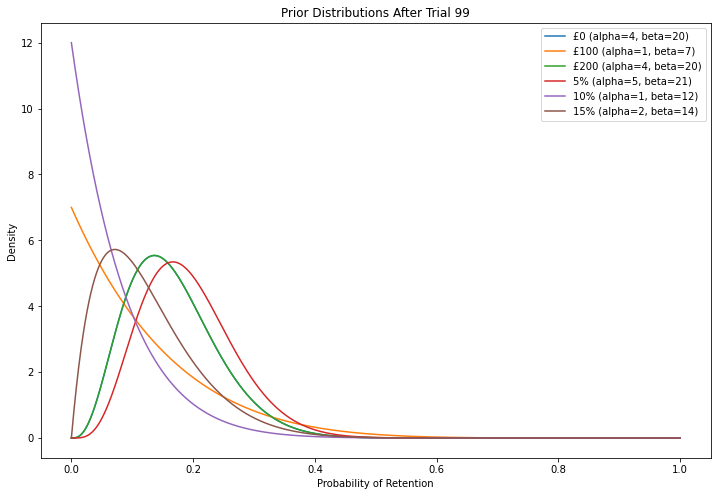

Trial 100: CustomerID = CUST0100, Selected treatment = £0
Was the customer CUST0100 retained? (y/n): 


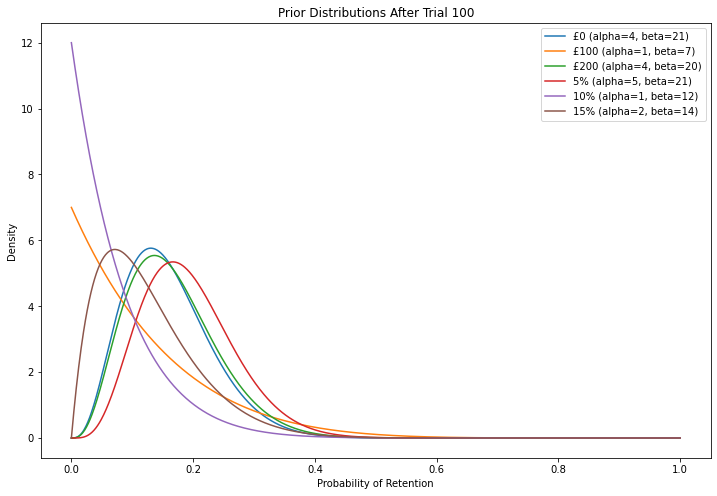

Trial 101: CustomerID = CUST0101, Selected treatment = £200
Was the customer CUST0101 retained? (y/n): 


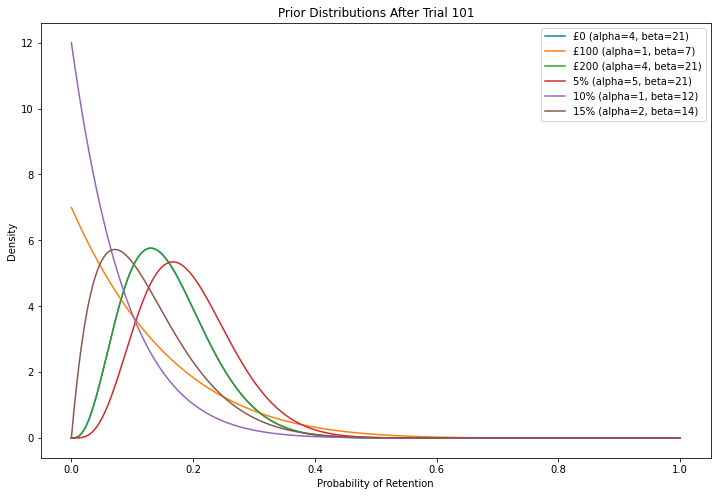

Trial 102: CustomerID = CUST0102, Selected treatment = £0
Was the customer CUST0102 retained? (y/n): 


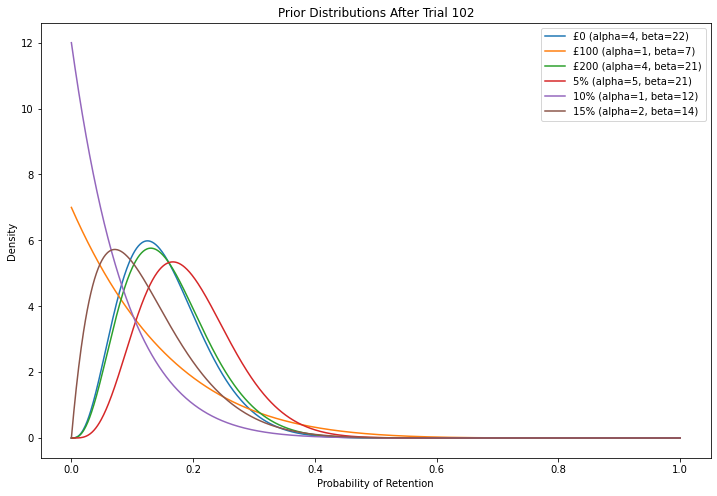

Trial 103: CustomerID = CUST0103, Selected treatment = £200
Was the customer CUST0103 retained? (y/n): 


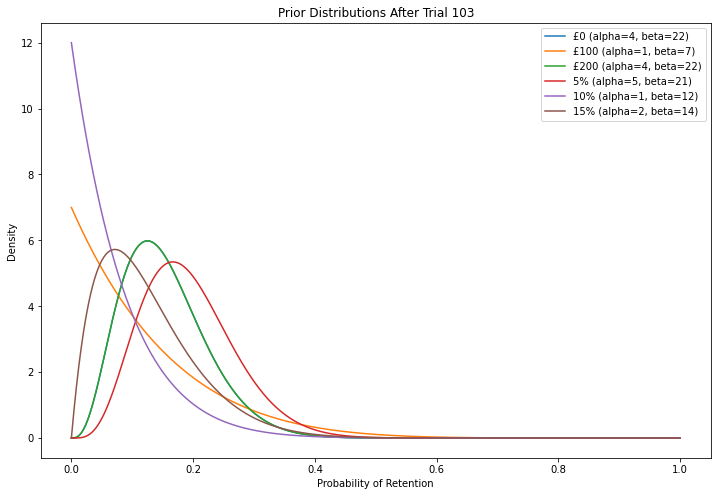

Trial 104: CustomerID = CUST0104, Selected treatment = 15%
Was the customer CUST0104 retained? (y/n): 


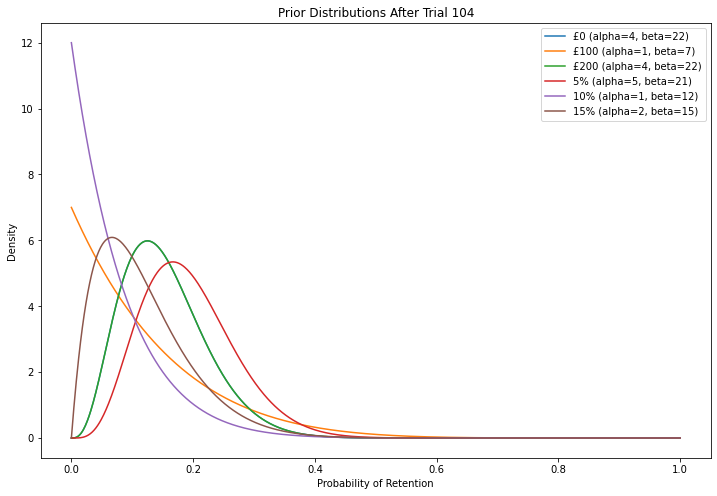

Trial 105: CustomerID = CUST0105, Selected treatment = £100
Was the customer CUST0105 retained? (y/n): 


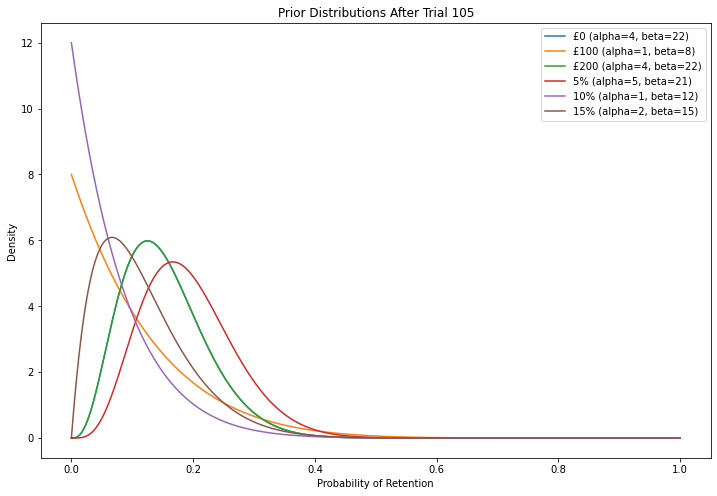

Trial 106: CustomerID = CUST0106, Selected treatment = 5%
Was the customer CUST0106 retained? (y/n): 


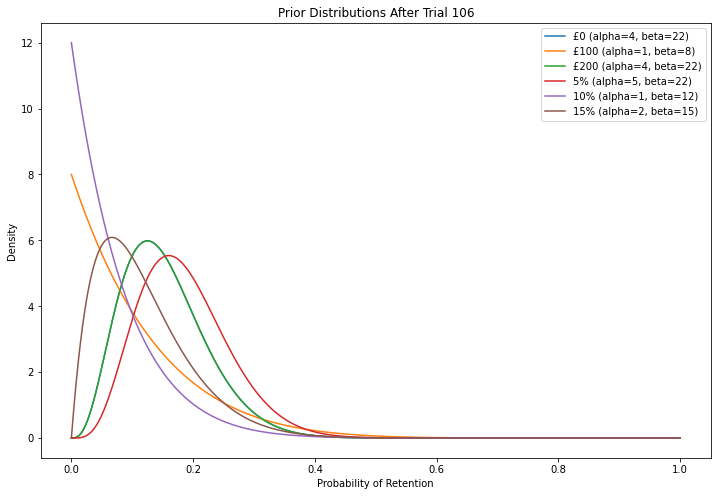

Trial 107: CustomerID = CUST0107, Selected treatment = 5%
Was the customer CUST0107 retained? (y/n): 


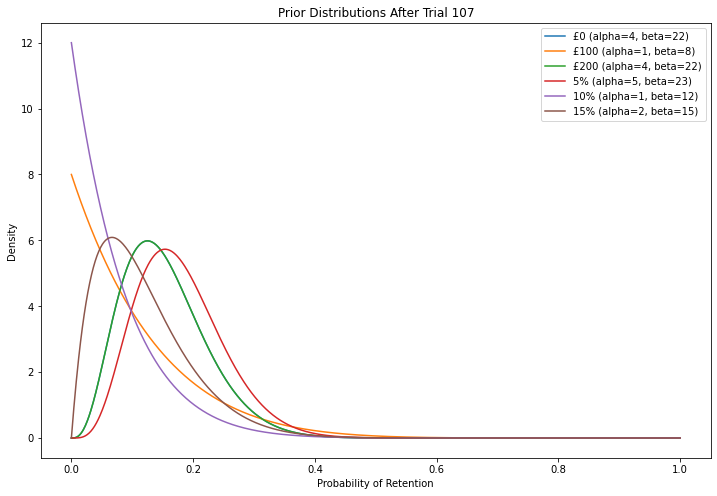

Trial 108: CustomerID = CUST0108, Selected treatment = £200
Was the customer CUST0108 retained? (y/n): 


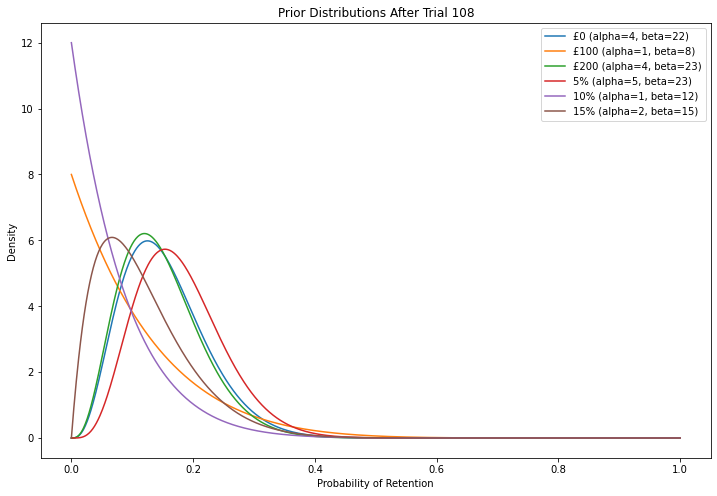

Trial 109: CustomerID = CUST0109, Selected treatment = 5%
Was the customer CUST0109 retained? (y/n): 


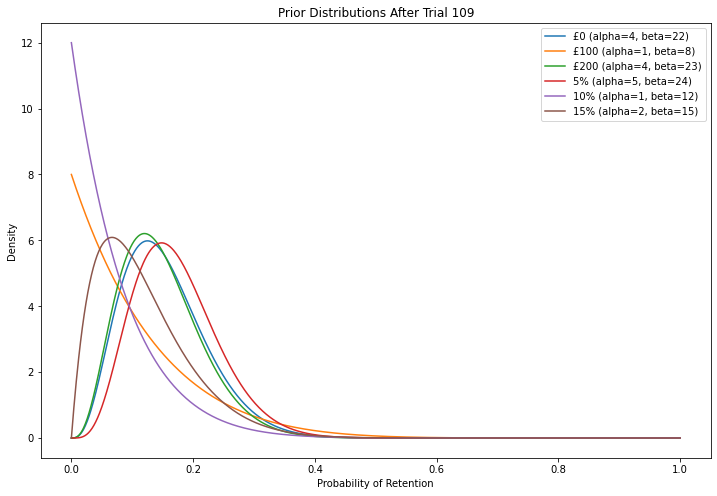

Trial 110: CustomerID = CUST0110, Selected treatment = 5%
Was the customer CUST0110 retained? (y/n): 


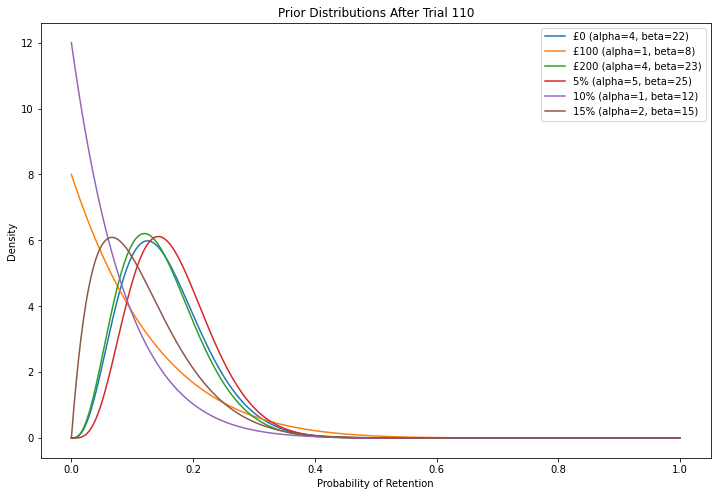

Trial 111: CustomerID = CUST0111, Selected treatment = 5%
Was the customer CUST0111 retained? (y/n): 


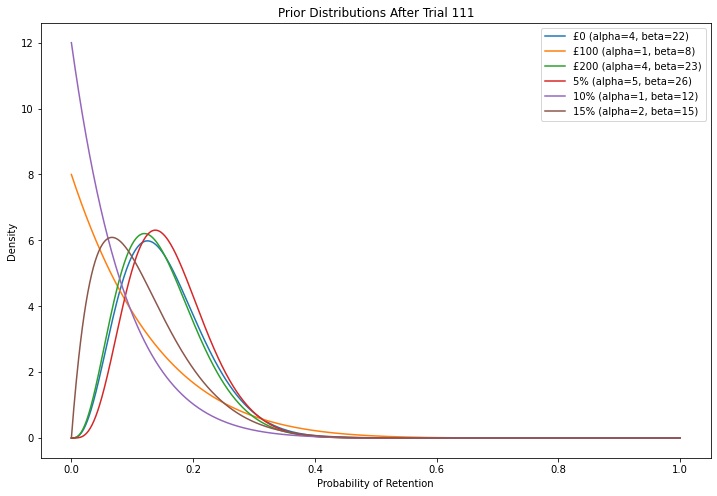

Trial 112: CustomerID = CUST0112, Selected treatment = £0
Was the customer CUST0112 retained? (y/n): 


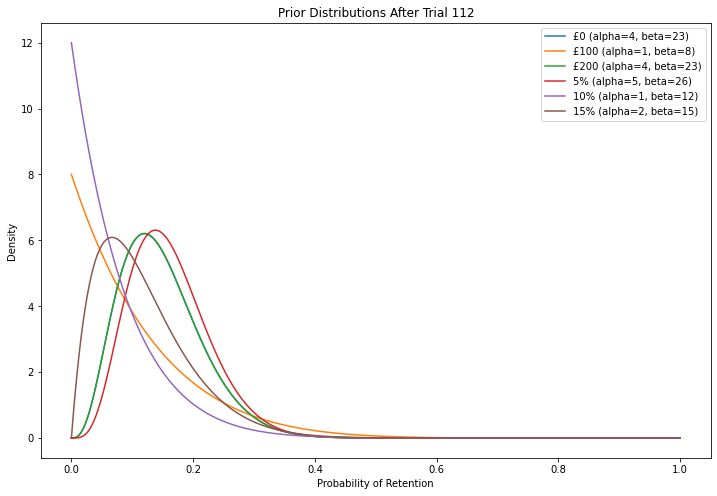

Trial 113: CustomerID = CUST0113, Selected treatment = £100
Was the customer CUST0113 retained? (y/n): y


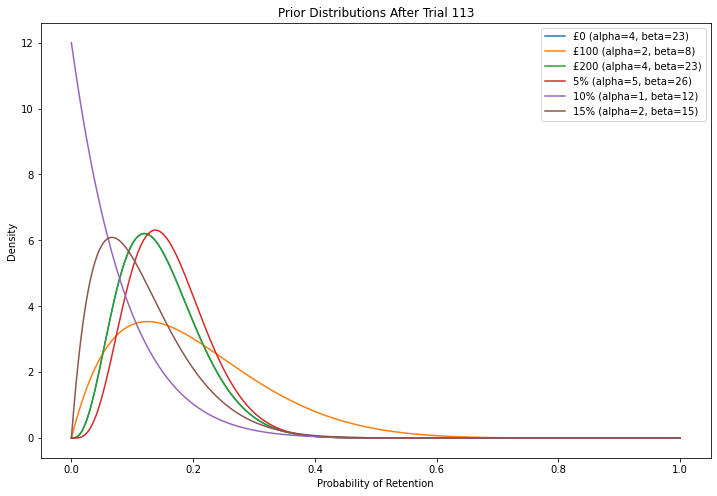

Trial 114: CustomerID = CUST0114, Selected treatment = 5%
Was the customer CUST0114 retained? (y/n): 


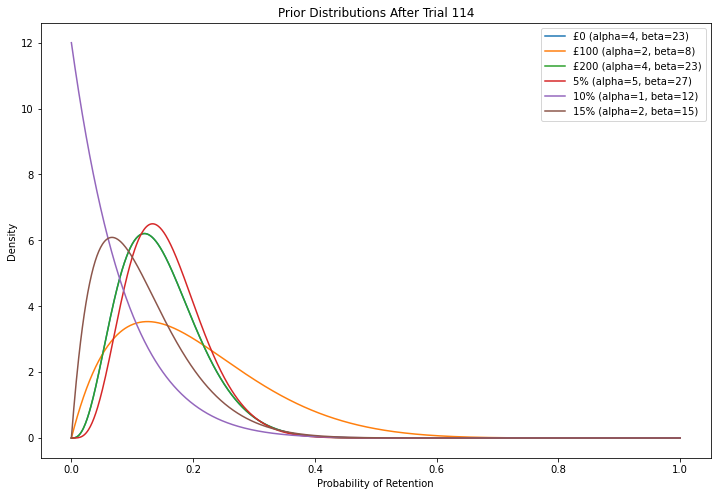

Trial 115: CustomerID = CUST0115, Selected treatment = £100
Was the customer CUST0115 retained? (y/n): 


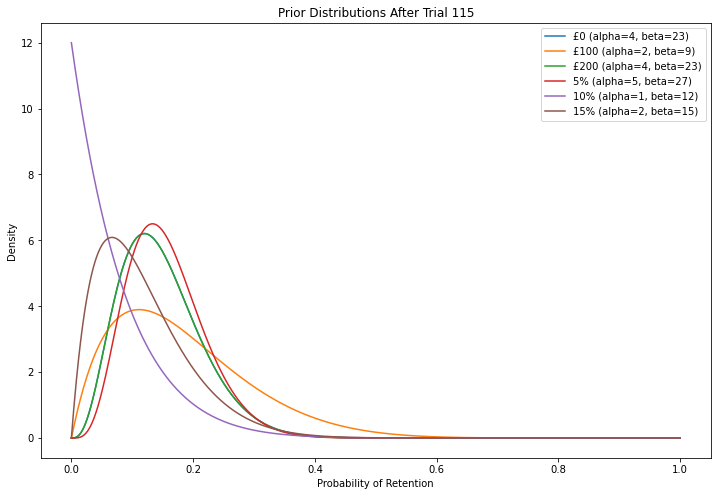

Trial 116: CustomerID = CUST0116, Selected treatment = £200
Was the customer CUST0116 retained? (y/n): 


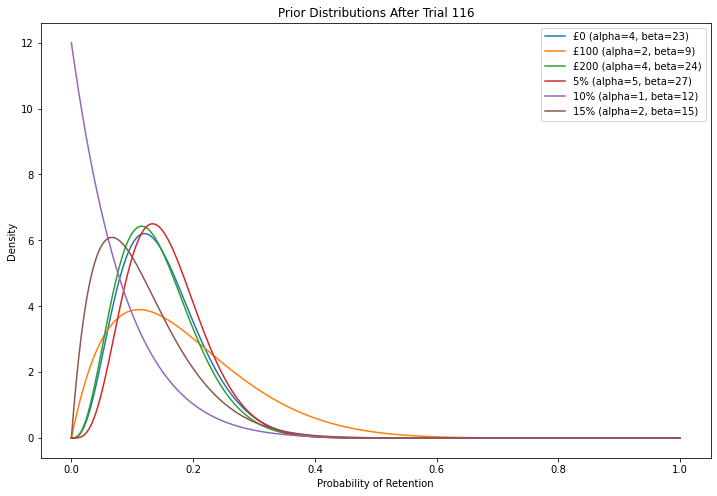

Trial 117: CustomerID = CUST0117, Selected treatment = 5%
Was the customer CUST0117 retained? (y/n): 


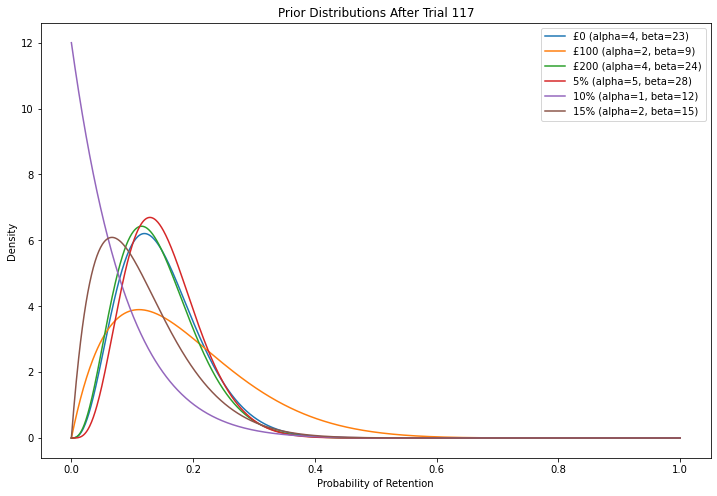

Trial 118: CustomerID = CUST0118, Selected treatment = 5%
Was the customer CUST0118 retained? (y/n): 


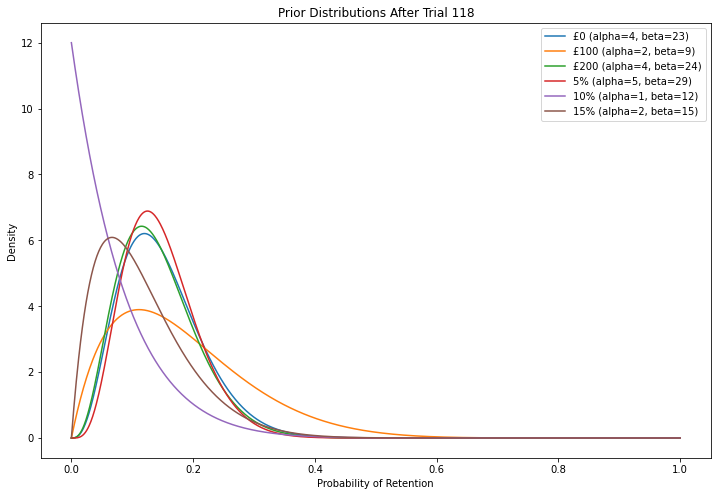

Trial 119: CustomerID = CUST0119, Selected treatment = £200
Was the customer CUST0119 retained? (y/n): 


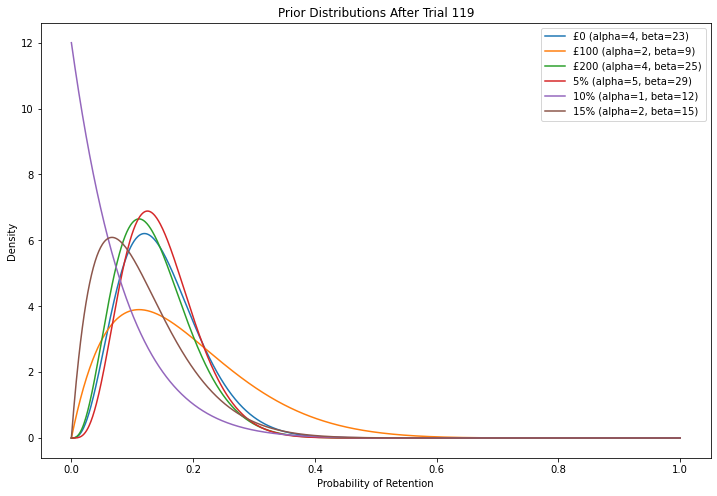

Trial 120: CustomerID = CUST0120, Selected treatment = 5%
Was the customer CUST0120 retained? (y/n): 


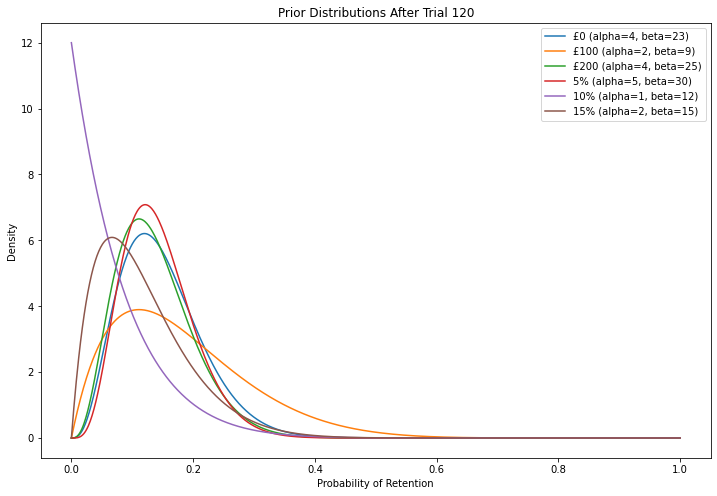

Trial 121: CustomerID = CUST0121, Selected treatment = £0
Was the customer CUST0121 retained? (y/n): 


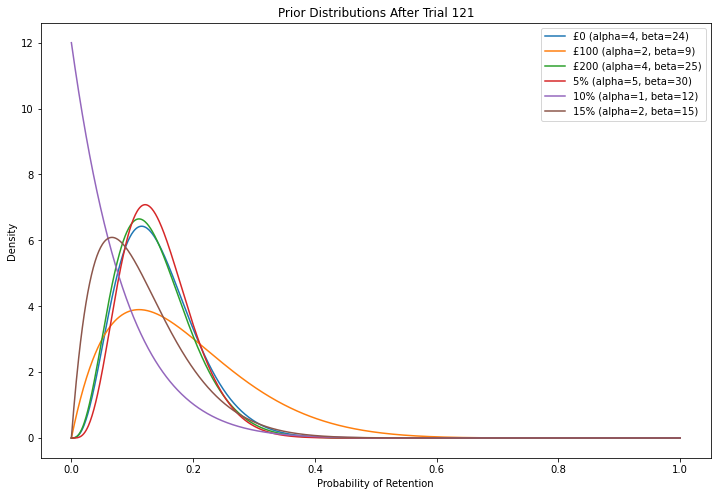

Trial 122: CustomerID = CUST0122, Selected treatment = £100
Was the customer CUST0122 retained? (y/n): 


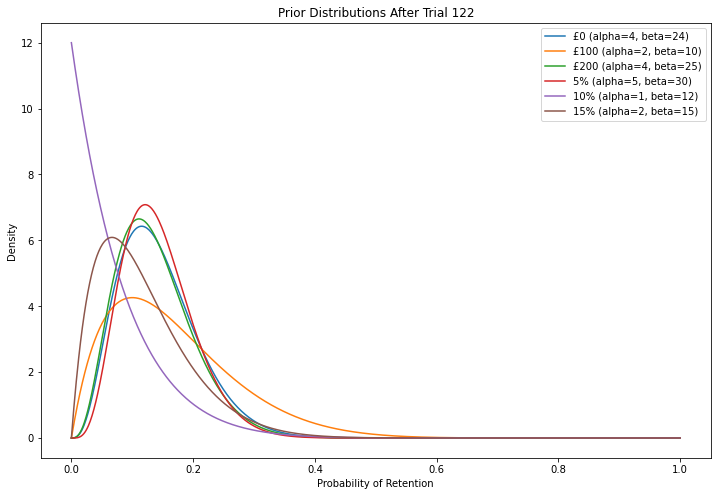

Trial 123: CustomerID = CUST0123, Selected treatment = 15%
Was the customer CUST0123 retained? (y/n): n


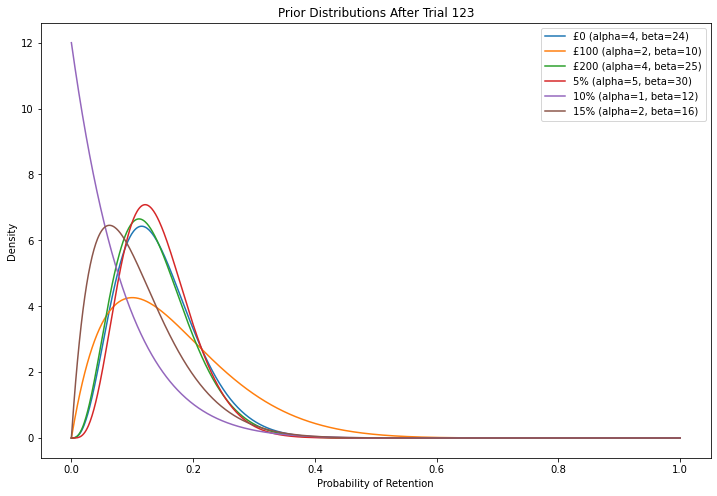

Trial 124: CustomerID = CUST0124, Selected treatment = 15%
Was the customer CUST0124 retained? (y/n): n


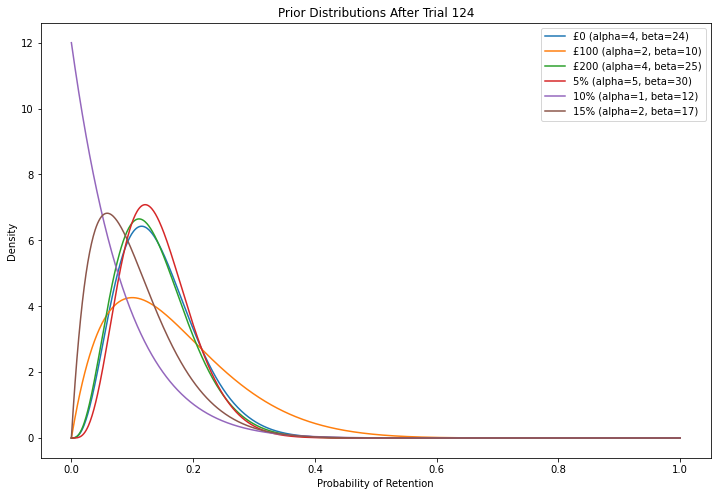

Trial 125: CustomerID = CUST0125, Selected treatment = 5%
Was the customer CUST0125 retained? (y/n): 


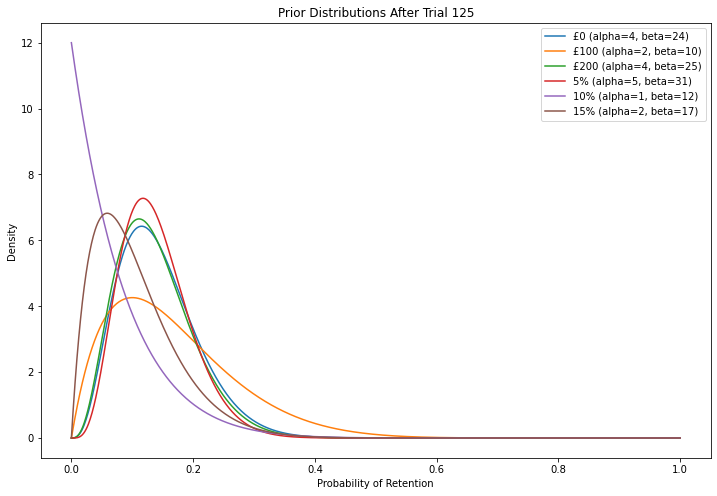

Trial 126: CustomerID = CUST0126, Selected treatment = £100
Was the customer CUST0126 retained? (y/n): 


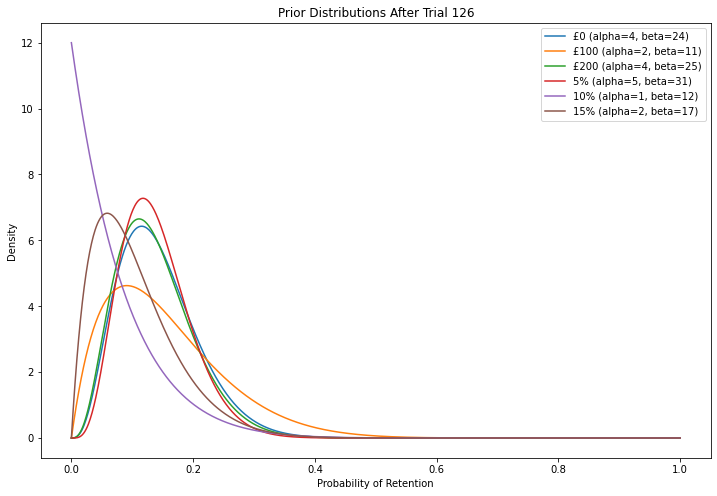

Trial 127: CustomerID = CUST0127, Selected treatment = £200
Was the customer CUST0127 retained? (y/n): 


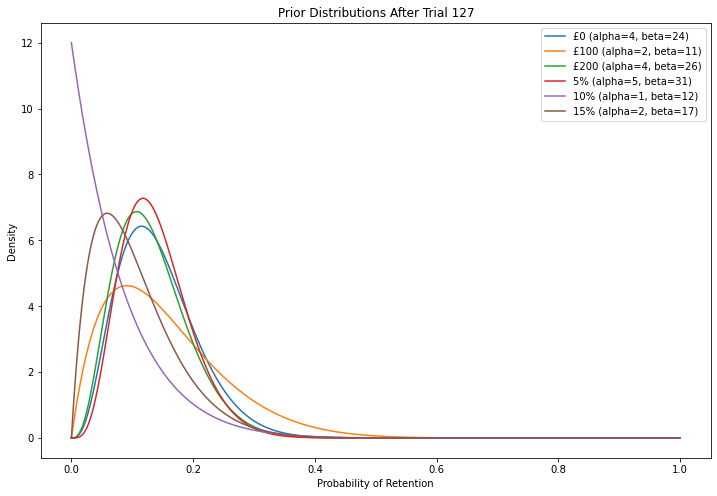

Trial 128: CustomerID = CUST0128, Selected treatment = £100
Was the customer CUST0128 retained? (y/n): 


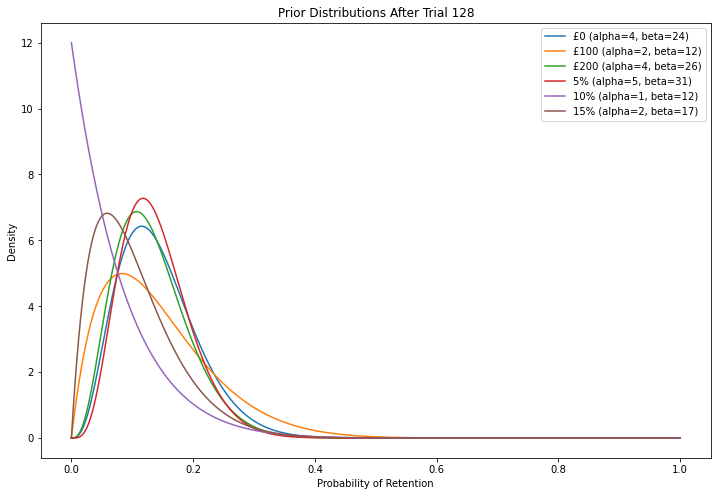

Trial 129: CustomerID = CUST0129, Selected treatment = 15%
Was the customer CUST0129 retained? (y/n): 


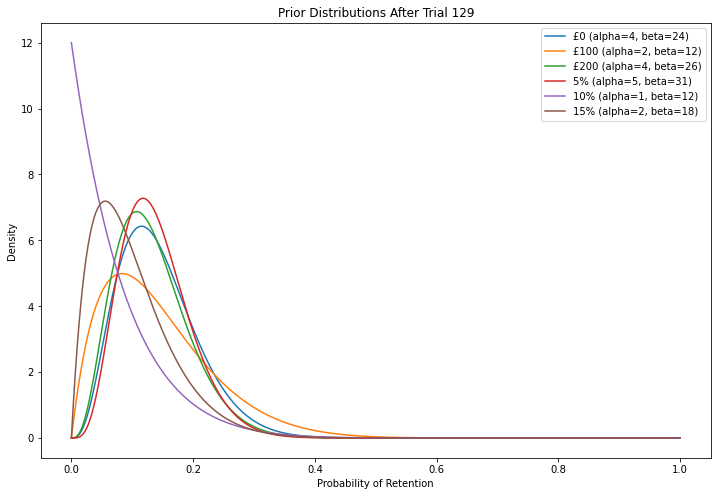

Trial 130: CustomerID = CUST0130, Selected treatment = £100
Was the customer CUST0130 retained? (y/n): 


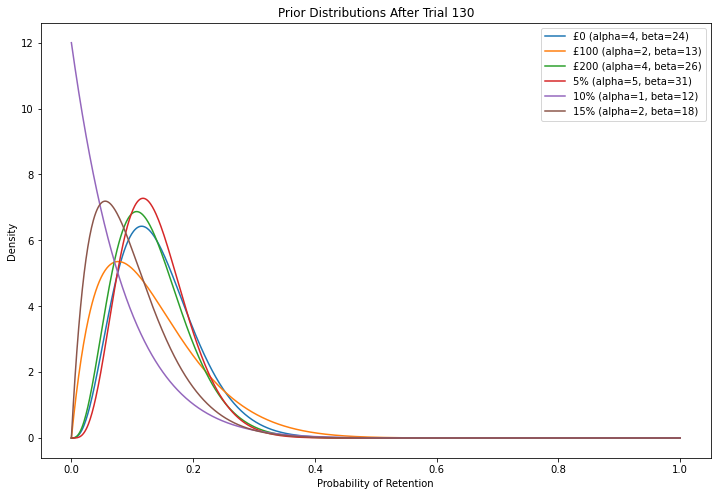

Trial 131: CustomerID = CUST0131, Selected treatment = £100
Was the customer CUST0131 retained? (y/n): 


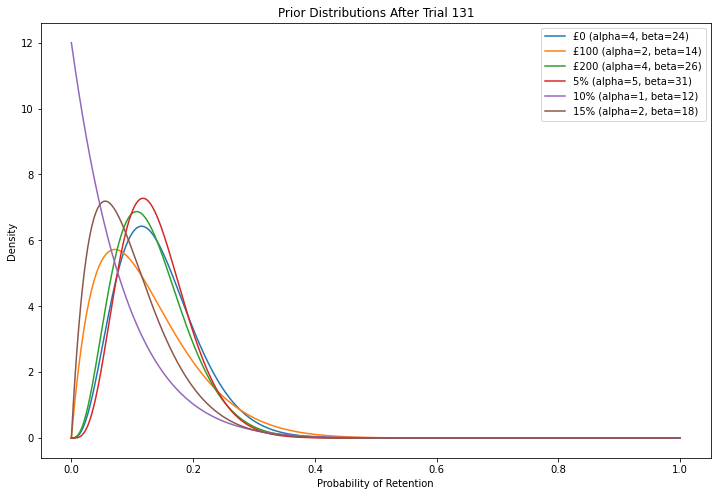

Trial 132: CustomerID = CUST0132, Selected treatment = 5%
Was the customer CUST0132 retained? (y/n): 


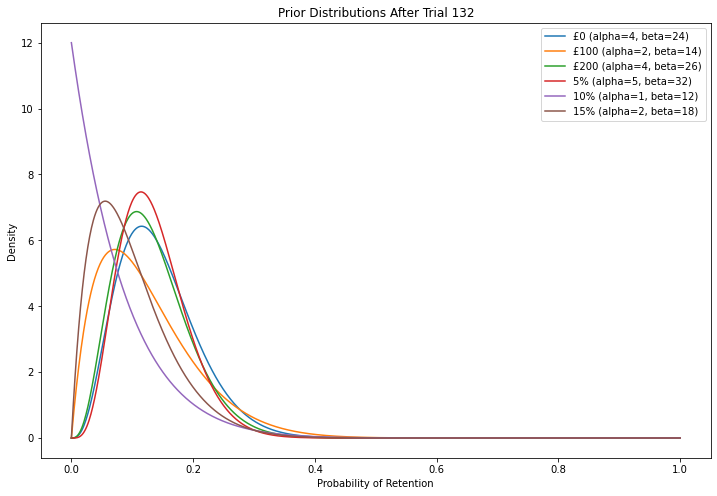

Trial 133: CustomerID = CUST0133, Selected treatment = £200
Was the customer CUST0133 retained? (y/n): 


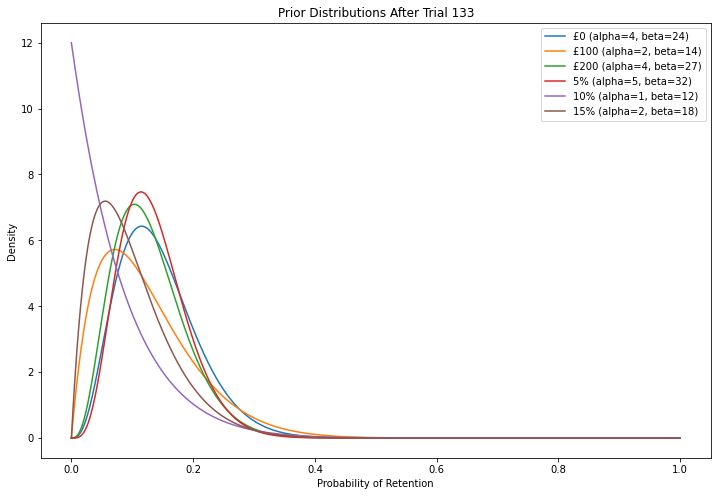

Trial 134: CustomerID = CUST0134, Selected treatment = 10%
Was the customer CUST0134 retained? (y/n): 


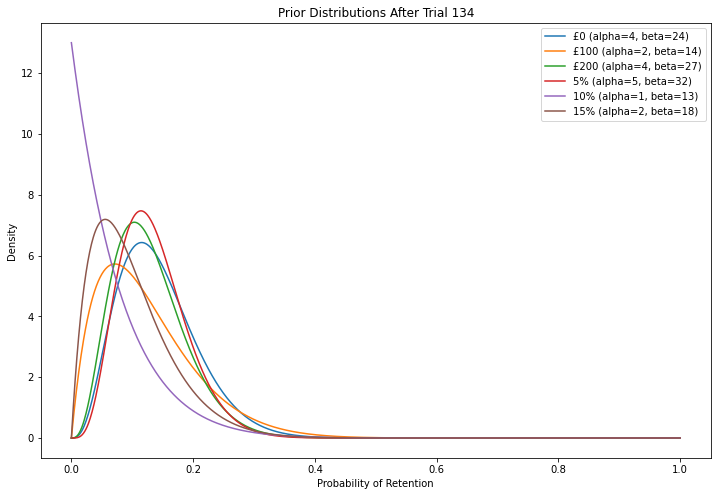

Trial 135: CustomerID = CUST0135, Selected treatment = 15%
Was the customer CUST0135 retained? (y/n): 


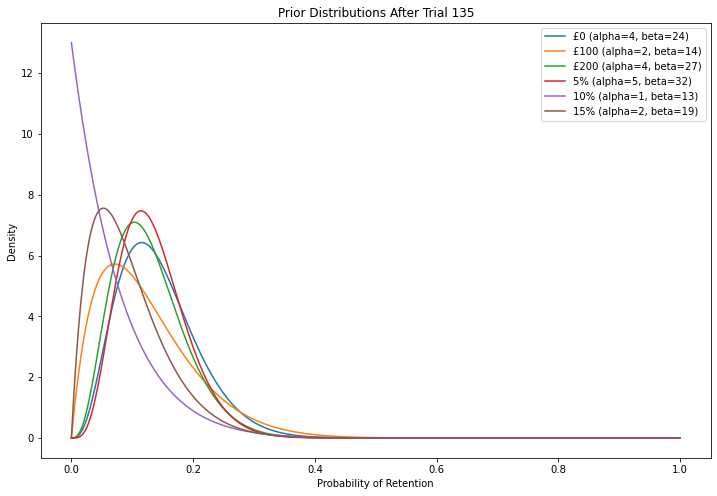

Trial 136: CustomerID = CUST0136, Selected treatment = 5%
Was the customer CUST0136 retained? (y/n): 


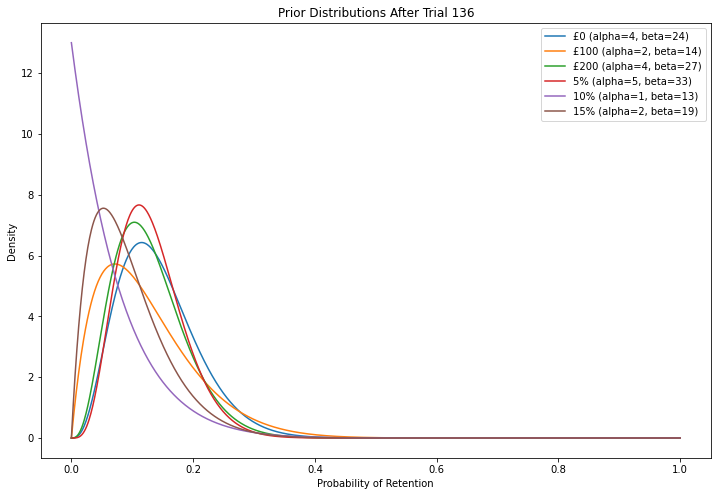

Trial 137: CustomerID = CUST0137, Selected treatment = 5%
Was the customer CUST0137 retained? (y/n): 


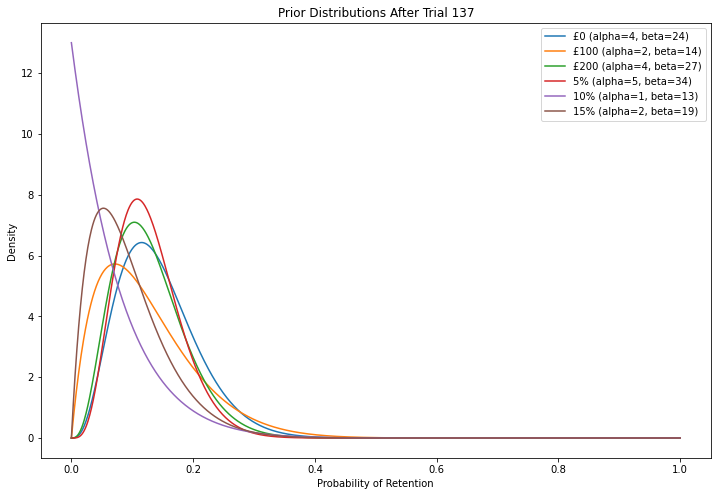

Trial 138: CustomerID = CUST0138, Selected treatment = 5%
Was the customer CUST0138 retained? (y/n): 


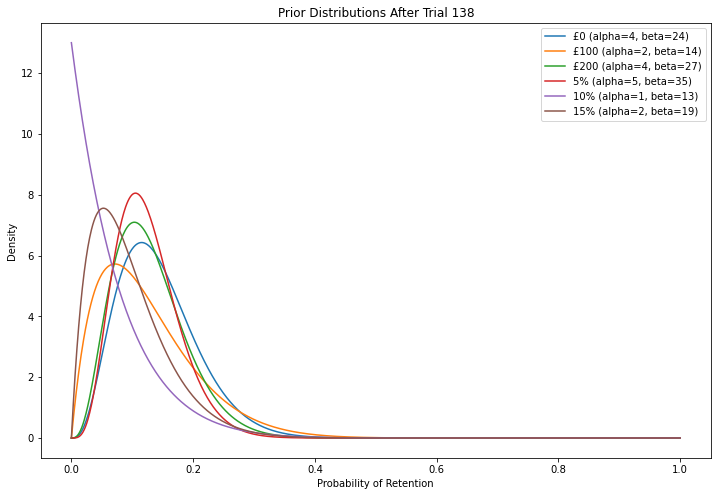

Trial 139: CustomerID = CUST0139, Selected treatment = £100
Was the customer CUST0139 retained? (y/n): 


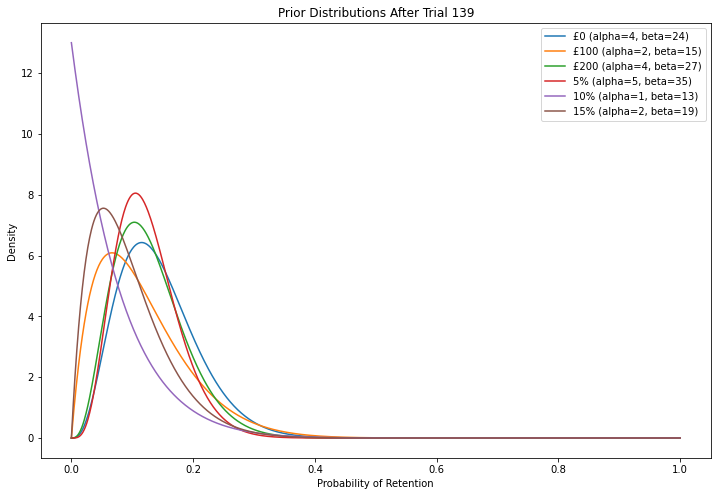

Trial 140: CustomerID = CUST0140, Selected treatment = 10%
Was the customer CUST0140 retained? (y/n): 


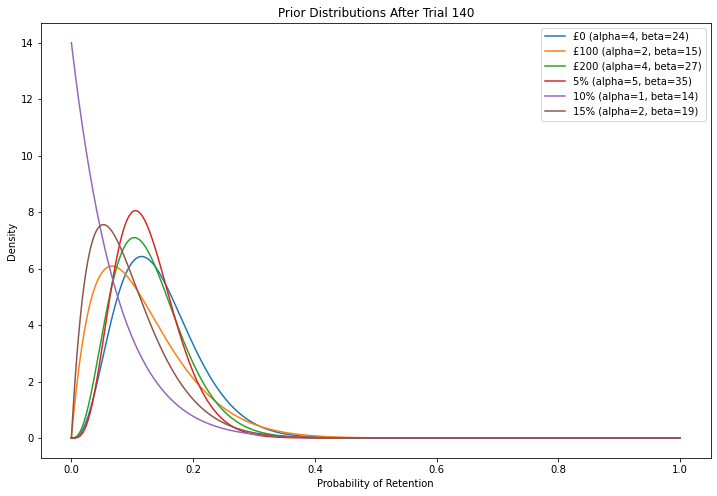

Trial 141: CustomerID = CUST0141, Selected treatment = £200
Was the customer CUST0141 retained? (y/n): 


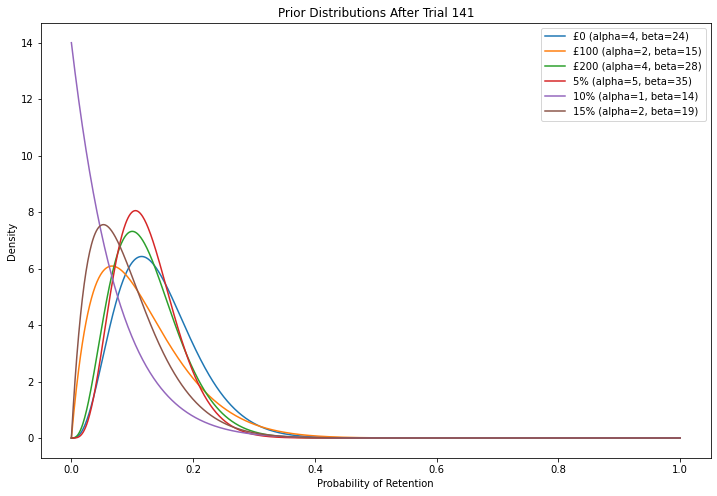

Trial 142: CustomerID = CUST0142, Selected treatment = £100
Was the customer CUST0142 retained? (y/n): 


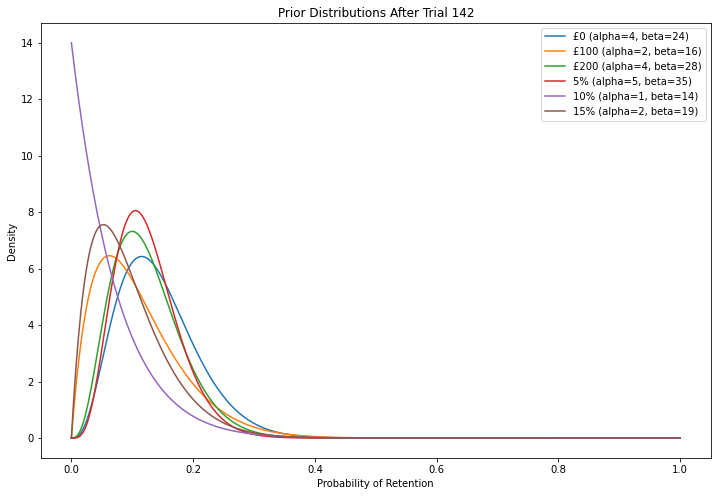

Trial 143: CustomerID = CUST0143, Selected treatment = £0
Was the customer CUST0143 retained? (y/n): 


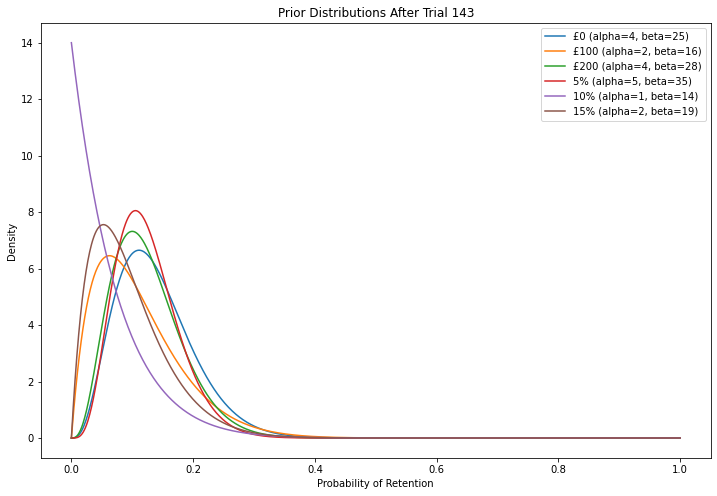

Trial 144: CustomerID = CUST0144, Selected treatment = £100
Was the customer CUST0144 retained? (y/n): 


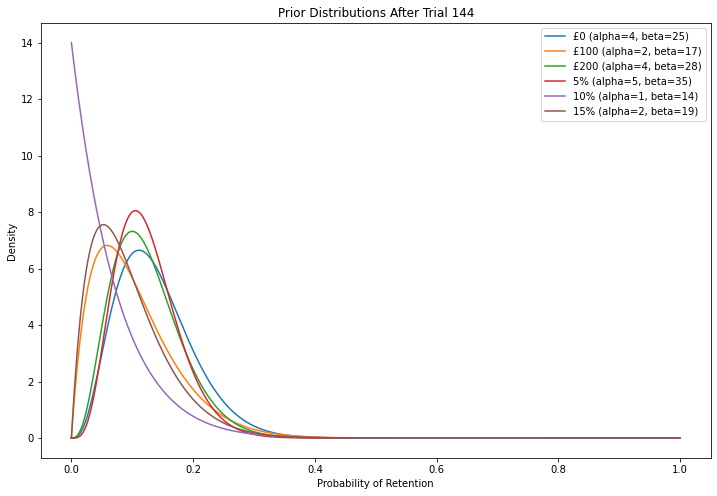

Trial 145: CustomerID = CUST0145, Selected treatment = £100
Was the customer CUST0145 retained? (y/n): 


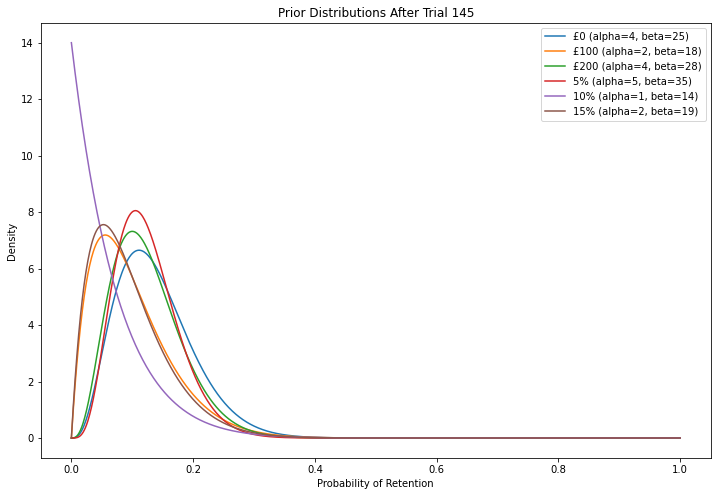

Trial 146: CustomerID = CUST0146, Selected treatment = £0
Was the customer CUST0146 retained? (y/n): 


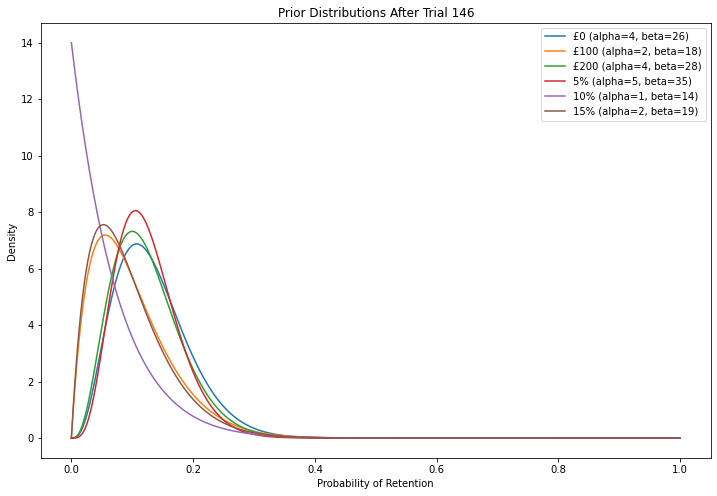

Trial 147: CustomerID = CUST0147, Selected treatment = £200
Was the customer CUST0147 retained? (y/n): 


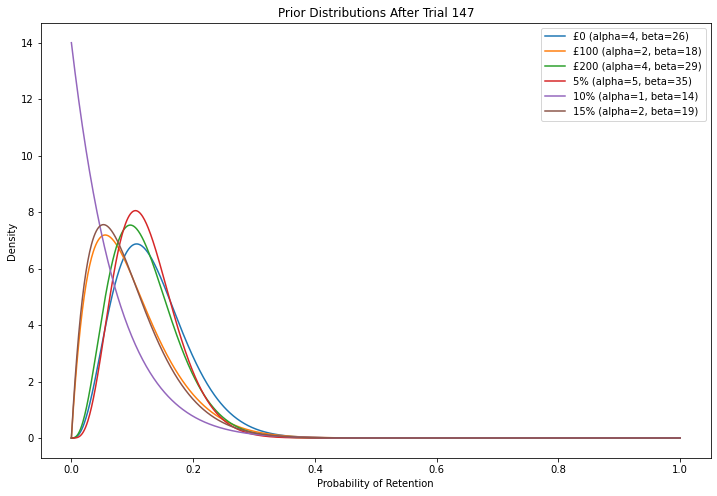

Trial 148: CustomerID = CUST0148, Selected treatment = £100
Was the customer CUST0148 retained? (y/n): 


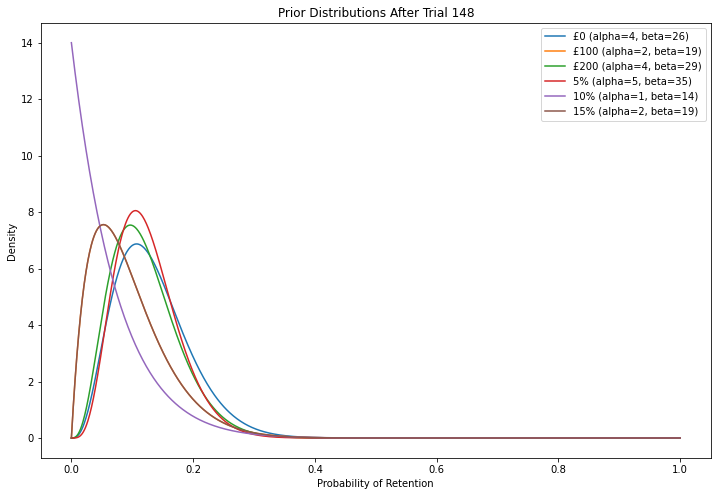

Trial 149: CustomerID = CUST0149, Selected treatment = 5%
Was the customer CUST0149 retained? (y/n): 


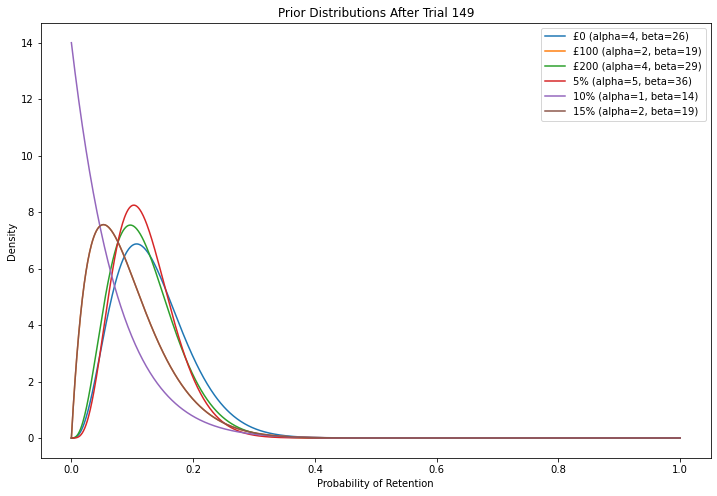

Trial 150: CustomerID = CUST0150, Selected treatment = 10%
Was the customer CUST0150 retained? (y/n): 


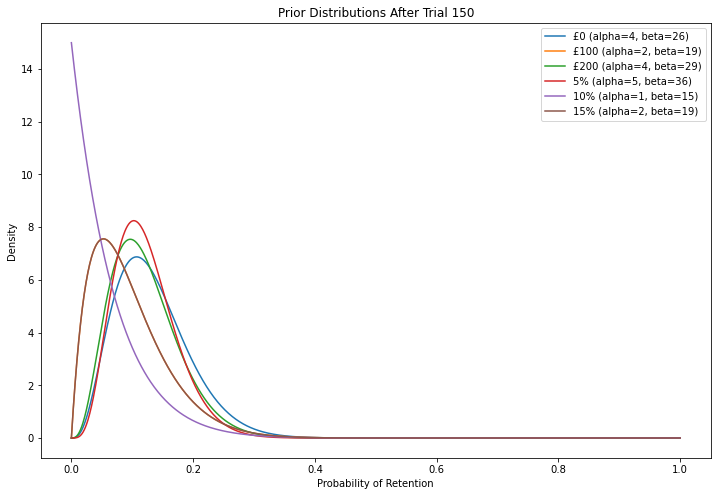

Trial 151: CustomerID = CUST0151, Selected treatment = £0
Was the customer CUST0151 retained? (y/n): 


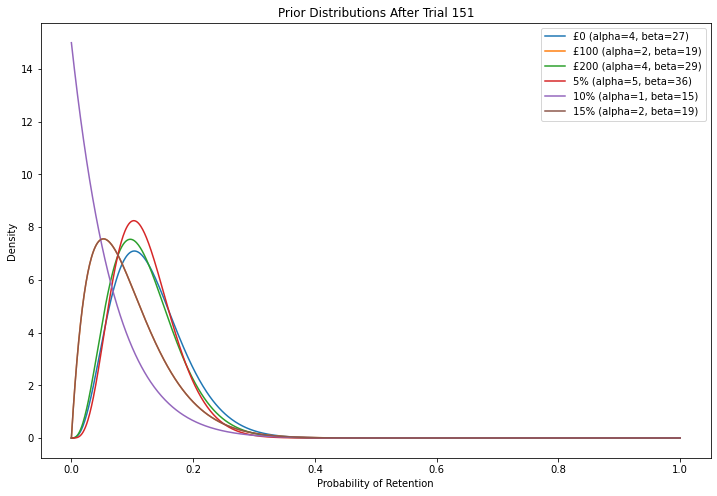

Trial 152: CustomerID = CUST0152, Selected treatment = £0
Was the customer CUST0152 retained? (y/n): 


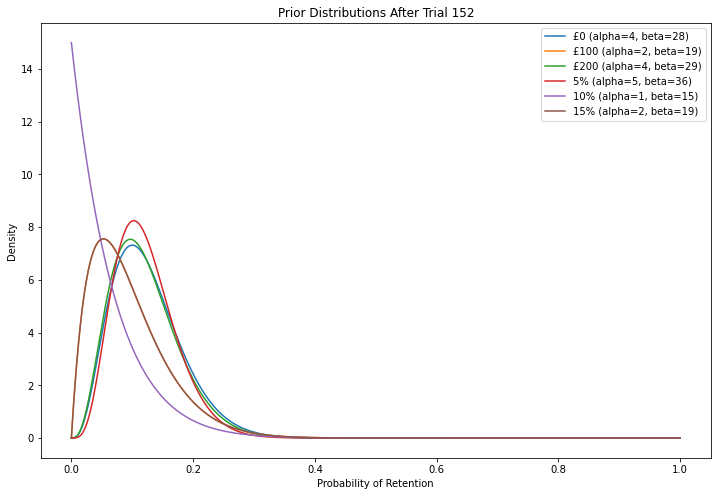

Trial 153: CustomerID = CUST0153, Selected treatment = £200
Was the customer CUST0153 retained? (y/n): 


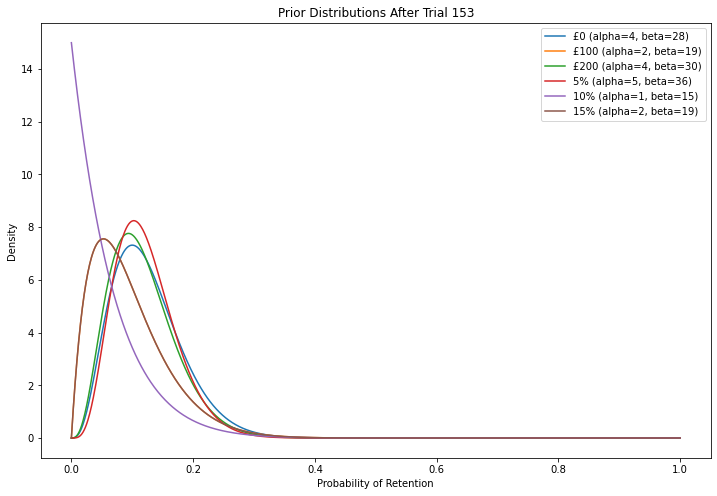

Trial 154: CustomerID = CUST0154, Selected treatment = 5%
Was the customer CUST0154 retained? (y/n): 


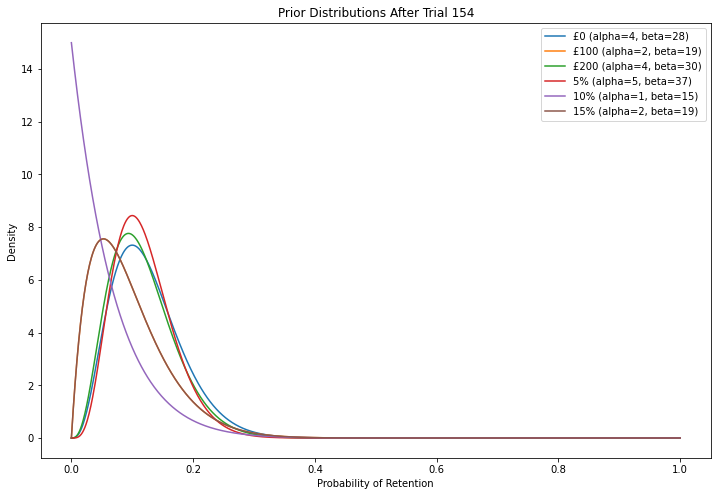

Trial 155: CustomerID = CUST0155, Selected treatment = £0
Was the customer CUST0155 retained? (y/n): y


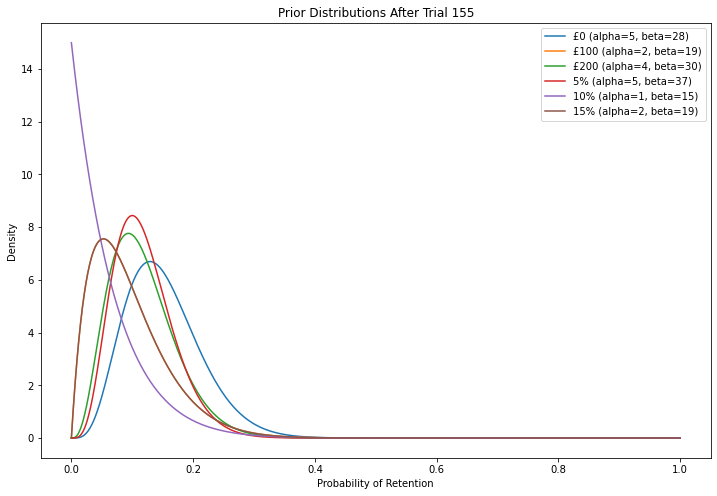

Trial 156: CustomerID = CUST0156, Selected treatment = £100
Was the customer CUST0156 retained? (y/n): 


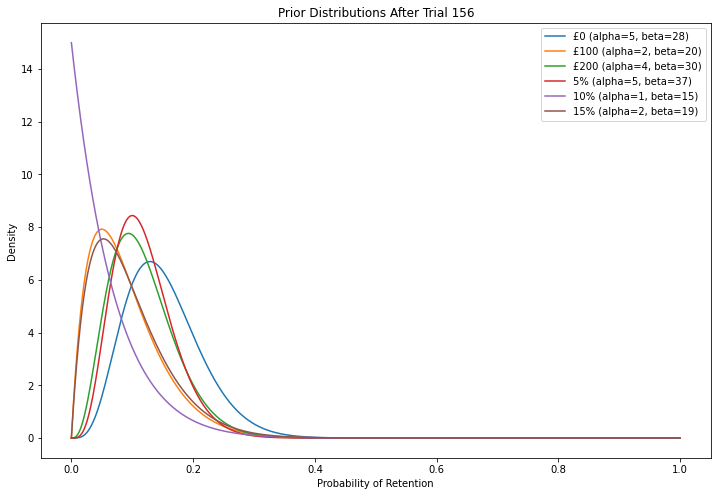

Trial 157: CustomerID = CUST0157, Selected treatment = 5%
Was the customer CUST0157 retained? (y/n): y


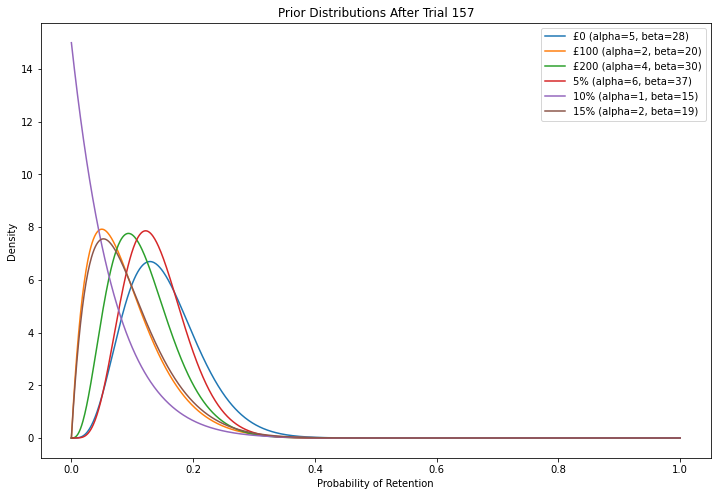

Trial 158: CustomerID = CUST0158, Selected treatment = £100
Was the customer CUST0158 retained? (y/n): 


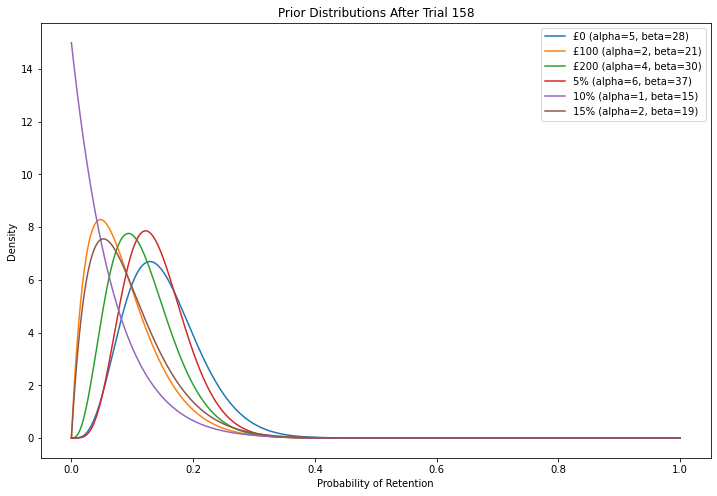

Trial 159: CustomerID = CUST0159, Selected treatment = £0
Was the customer CUST0159 retained? (y/n): 


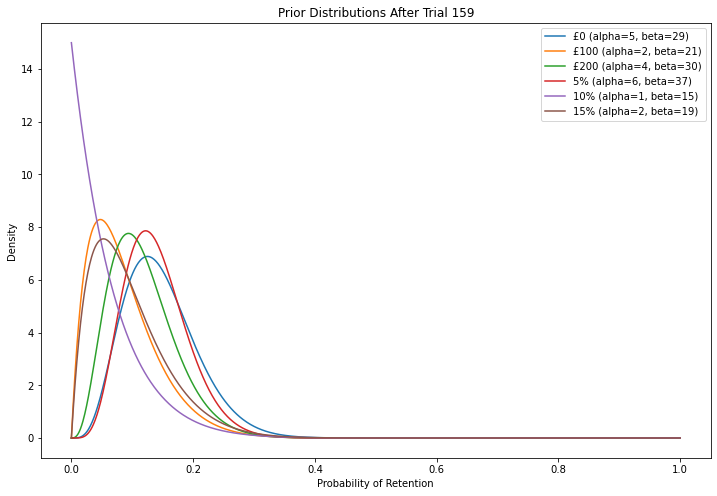

Trial 160: CustomerID = CUST0160, Selected treatment = £0
Was the customer CUST0160 retained? (y/n): 


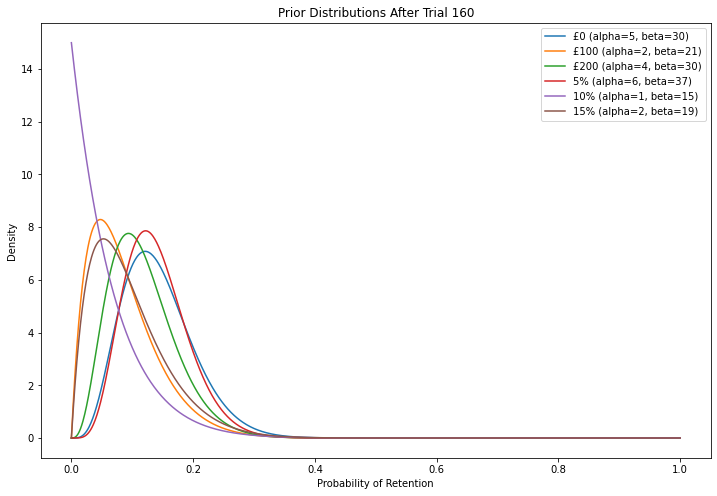

Trial 161: CustomerID = CUST0161, Selected treatment = 5%
Was the customer CUST0161 retained? (y/n): 


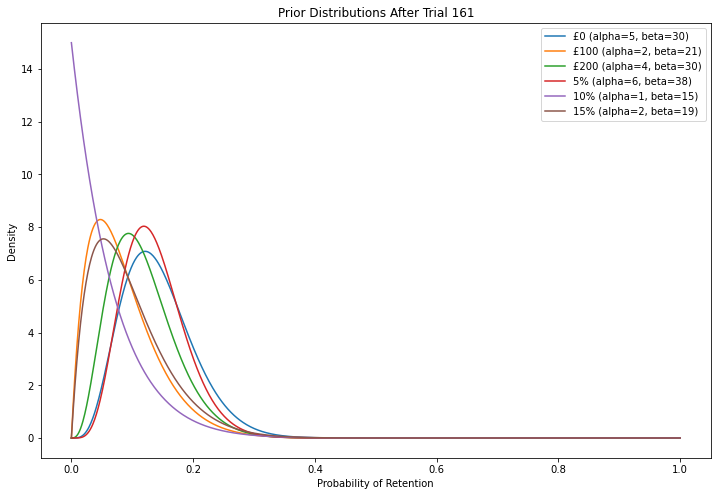

Trial 162: CustomerID = CUST0162, Selected treatment = £0
Was the customer CUST0162 retained? (y/n): 


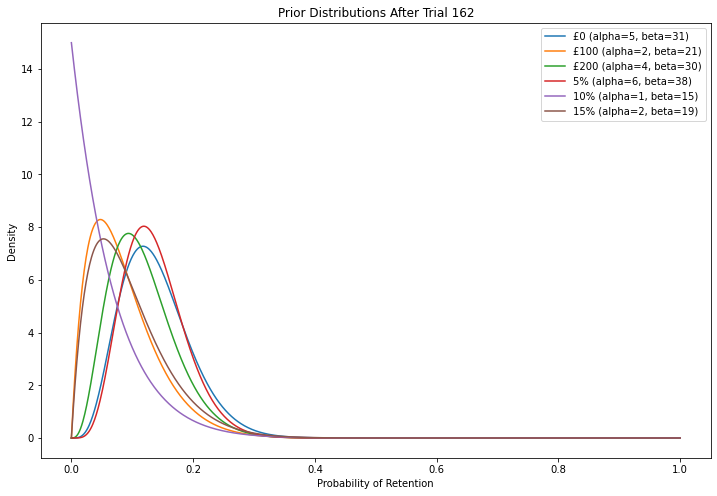

Trial 163: CustomerID = CUST0163, Selected treatment = £200
Was the customer CUST0163 retained? (y/n): 


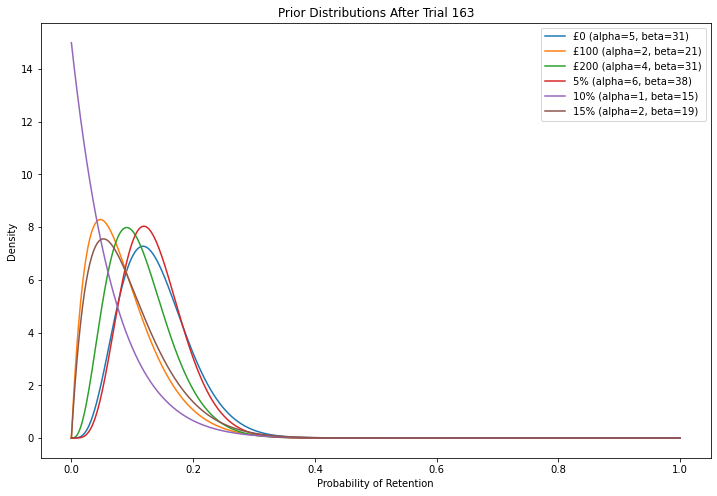

Trial 164: CustomerID = CUST0164, Selected treatment = 5%
Was the customer CUST0164 retained? (y/n): 


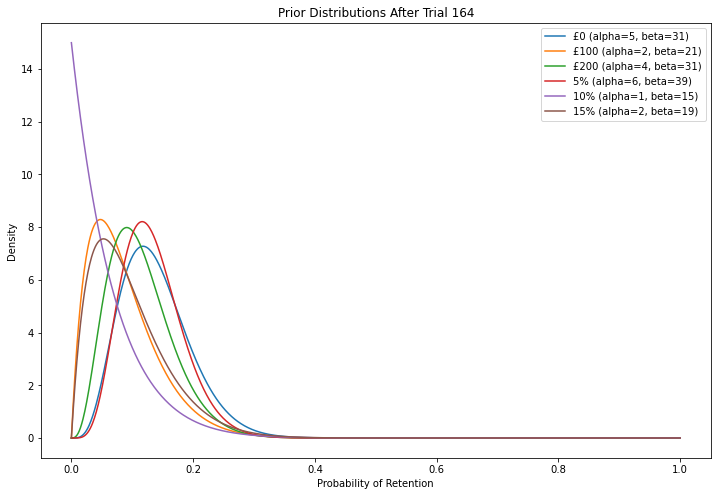

Trial 165: CustomerID = CUST0165, Selected treatment = £200
Was the customer CUST0165 retained? (y/n): 


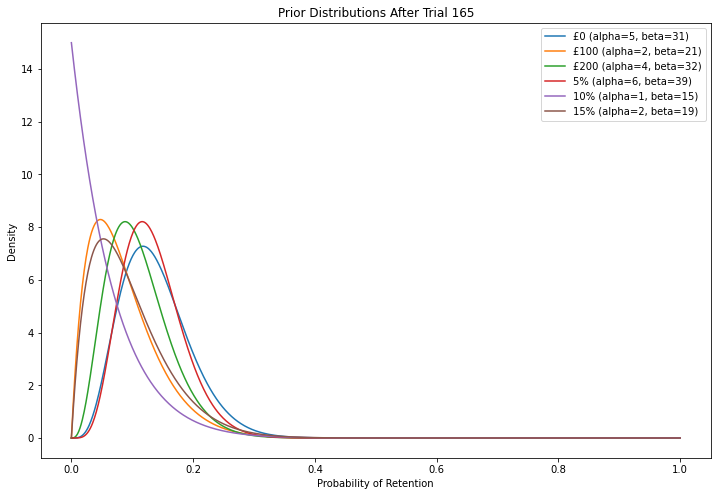

Trial 166: CustomerID = CUST0166, Selected treatment = £0
Was the customer CUST0166 retained? (y/n): 


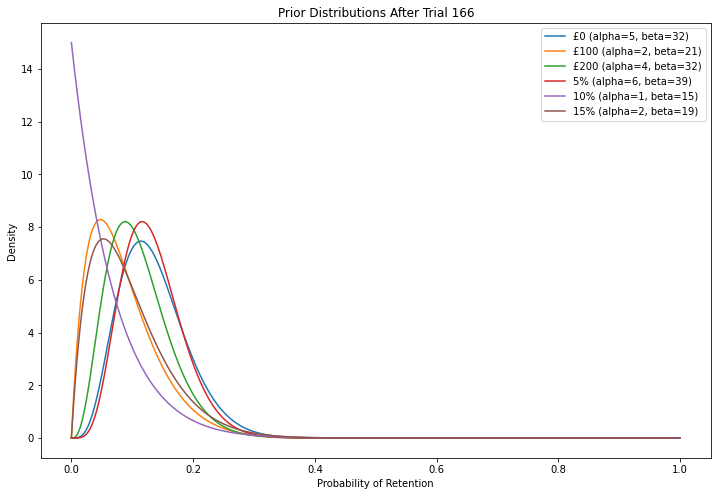

Trial 167: CustomerID = CUST0167, Selected treatment = 5%
Was the customer CUST0167 retained? (y/n): 


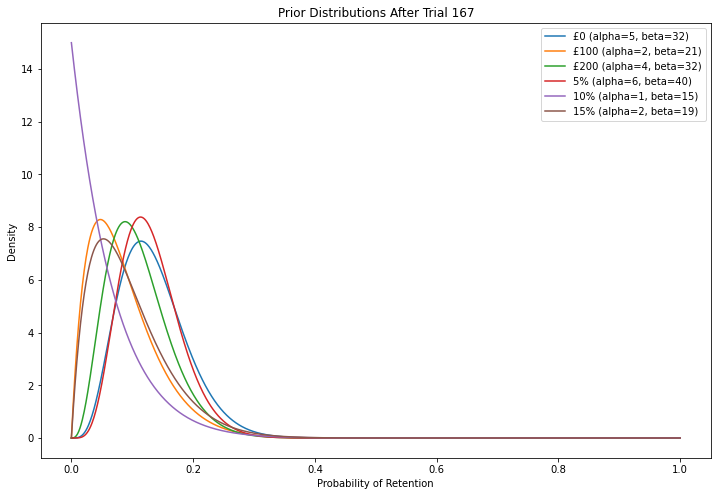

Trial 168: CustomerID = CUST0168, Selected treatment = £0
Was the customer CUST0168 retained? (y/n): 


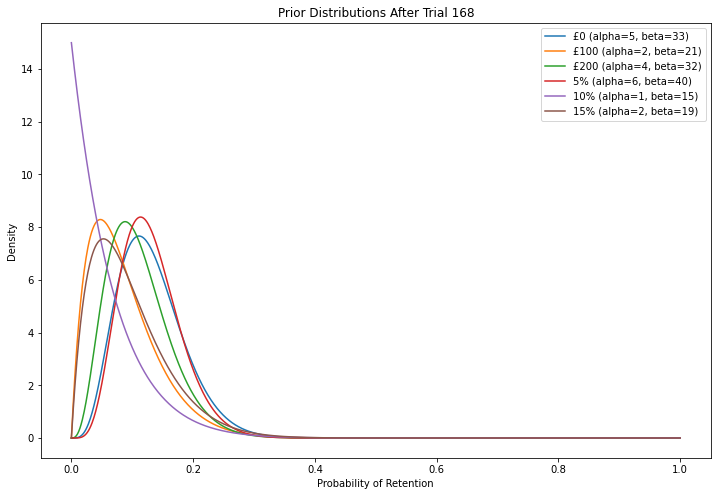

Trial 169: CustomerID = CUST0169, Selected treatment = £0
Was the customer CUST0169 retained? (y/n): 


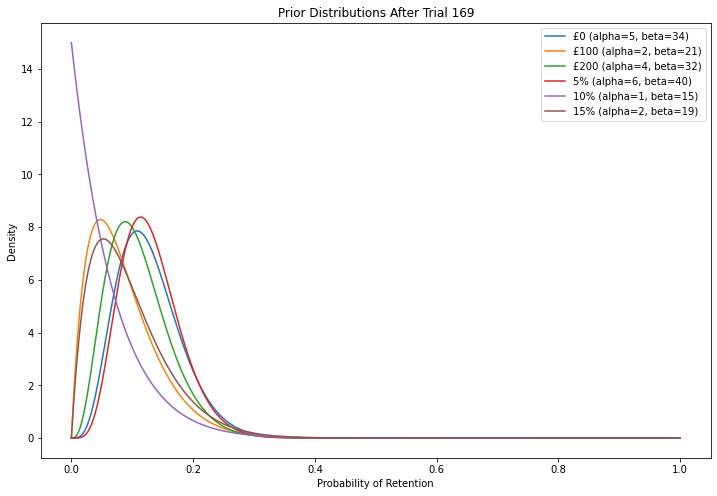

Trial 170: CustomerID = CUST0170, Selected treatment = 5%
Was the customer CUST0170 retained? (y/n): 


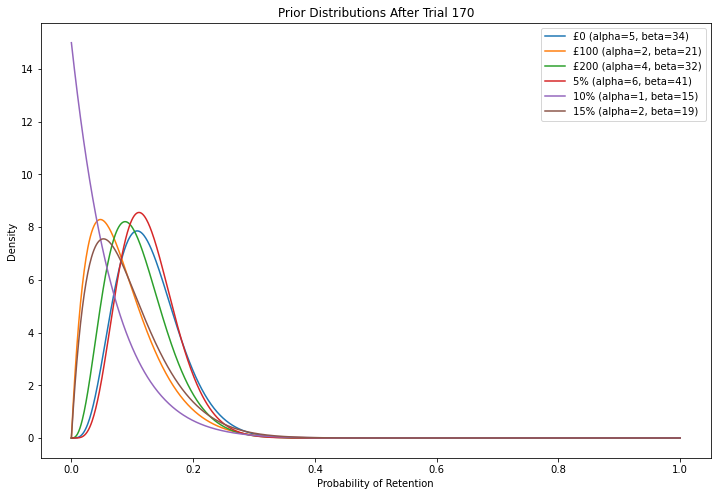

Trial 171: CustomerID = CUST0171, Selected treatment = £0
Was the customer CUST0171 retained? (y/n): 


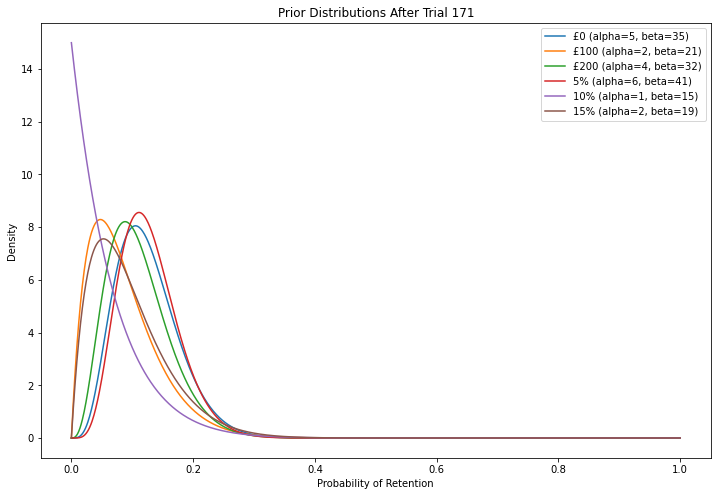

Trial 172: CustomerID = CUST0172, Selected treatment = £200
Was the customer CUST0172 retained? (y/n): 


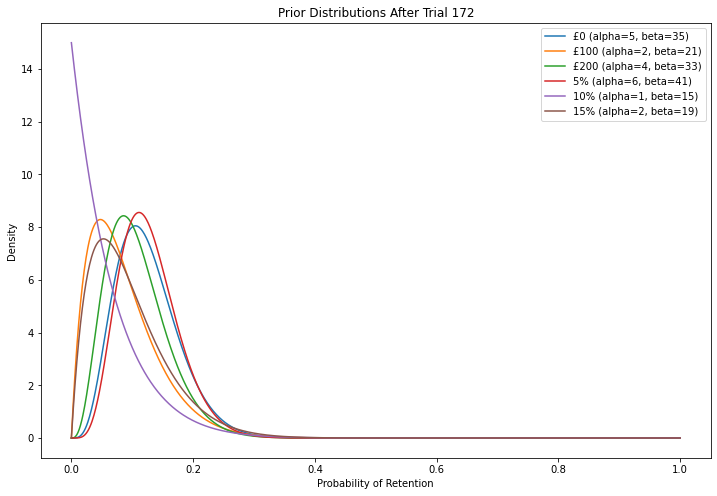

Trial 173: CustomerID = CUST0173, Selected treatment = £200
Was the customer CUST0173 retained? (y/n): 


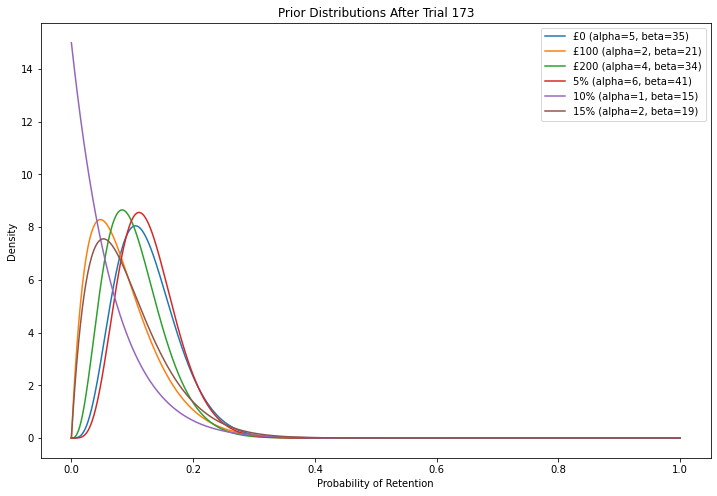

Trial 174: CustomerID = CUST0174, Selected treatment = £200
Was the customer CUST0174 retained? (y/n): 


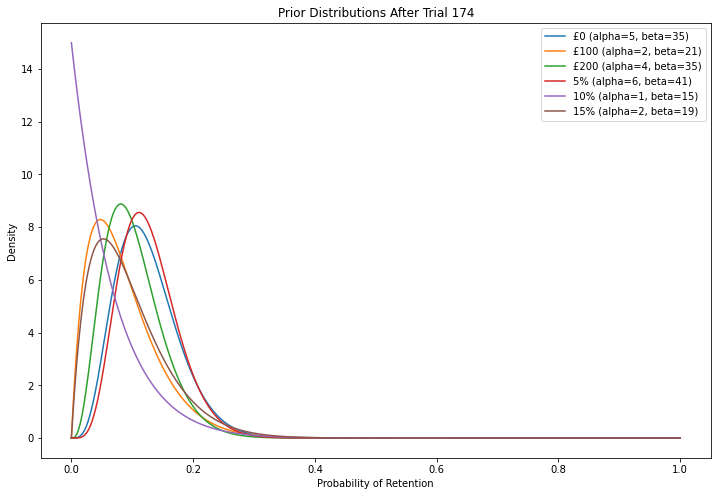

Trial 175: CustomerID = CUST0175, Selected treatment = 5%
Was the customer CUST0175 retained? (y/n): 


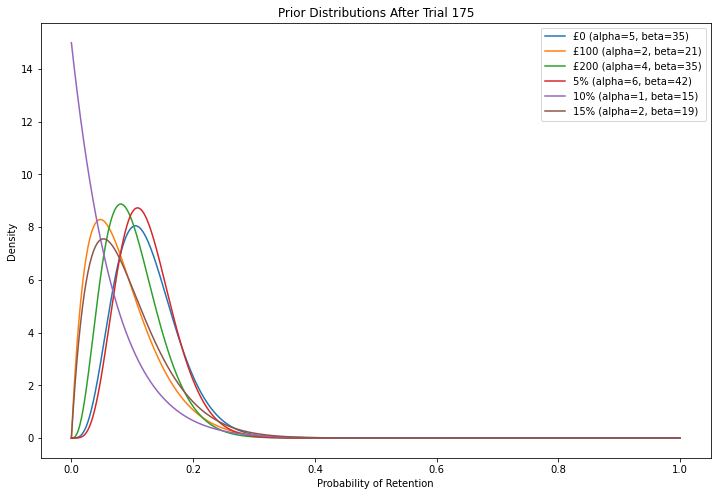

Trial 176: CustomerID = CUST0176, Selected treatment = £0
Was the customer CUST0176 retained? (y/n): 


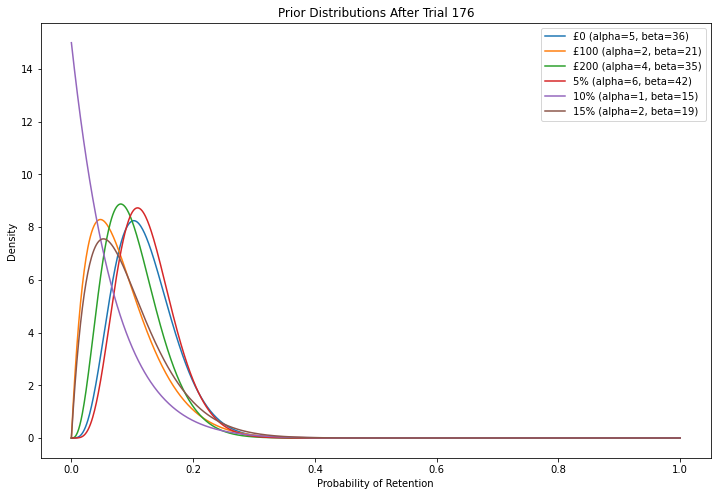

Trial 177: CustomerID = CUST0177, Selected treatment = £100
Was the customer CUST0177 retained? (y/n): n


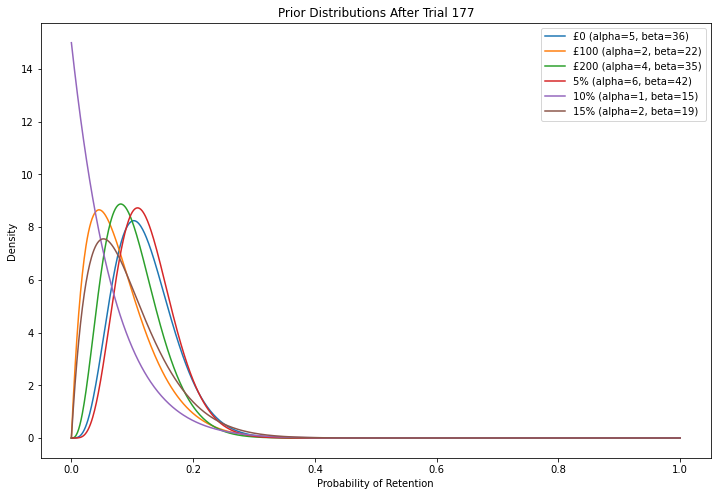

Trial 178: CustomerID = CUST0178, Selected treatment = £0
Was the customer CUST0178 retained? (y/n): 


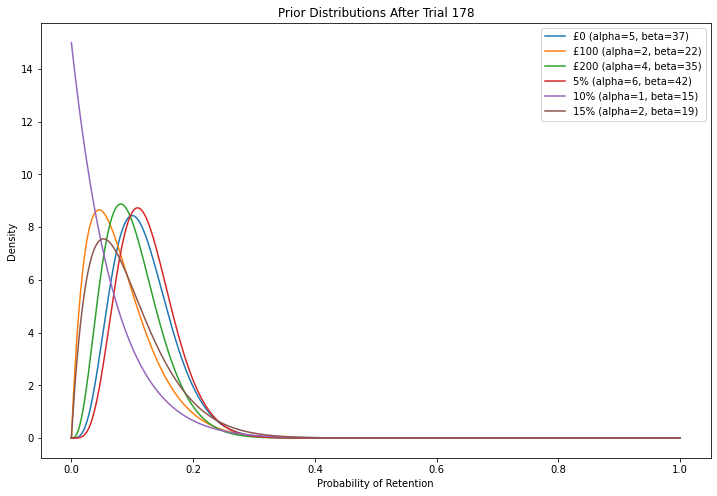

Trial 179: CustomerID = CUST0179, Selected treatment = 10%
Was the customer CUST0179 retained? (y/n): n


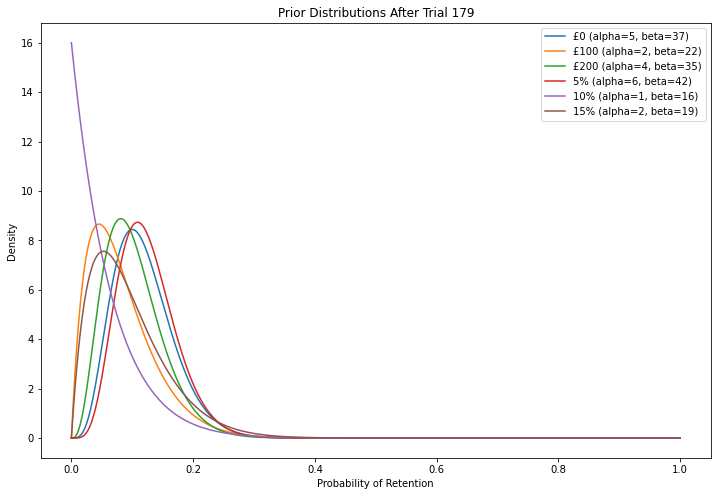

Trial 180: CustomerID = CUST0180, Selected treatment = £0
Was the customer CUST0180 retained? (y/n): 


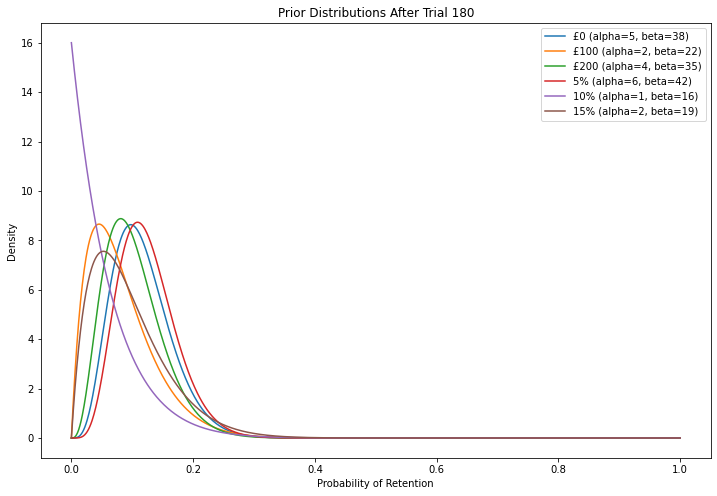

Trial 181: CustomerID = CUST0181, Selected treatment = £0
Was the customer CUST0181 retained? (y/n): 


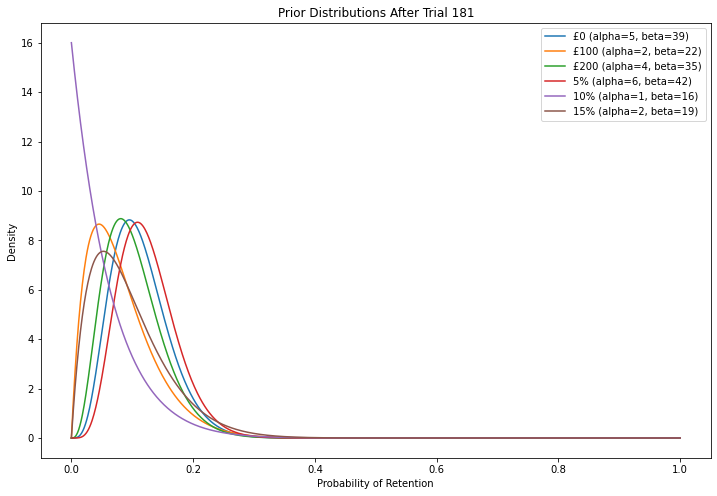

Trial 182: CustomerID = CUST0182, Selected treatment = 5%
Was the customer CUST0182 retained? (y/n): 


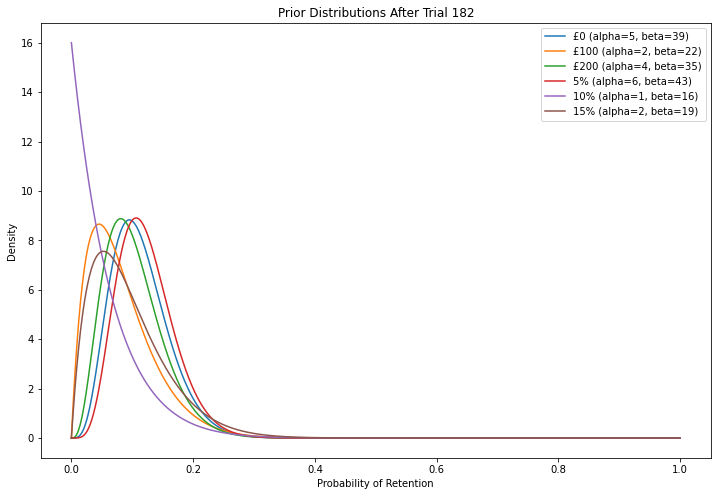

Trial 183: CustomerID = CUST0183, Selected treatment = £200
Was the customer CUST0183 retained? (y/n): 


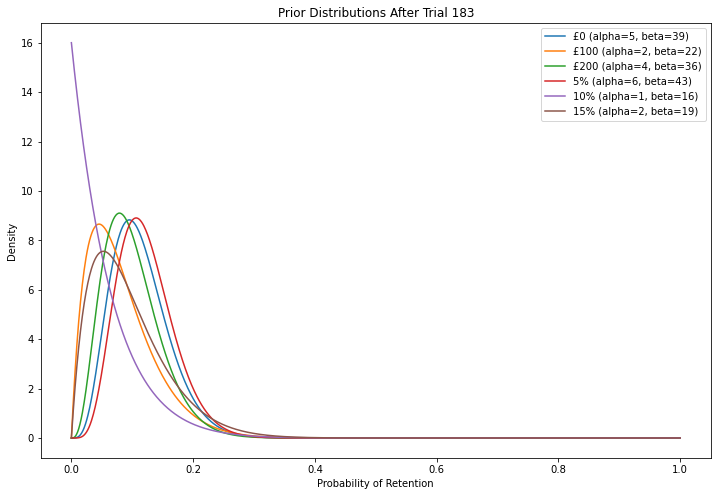

Trial 184: CustomerID = CUST0184, Selected treatment = £200
Was the customer CUST0184 retained? (y/n): 


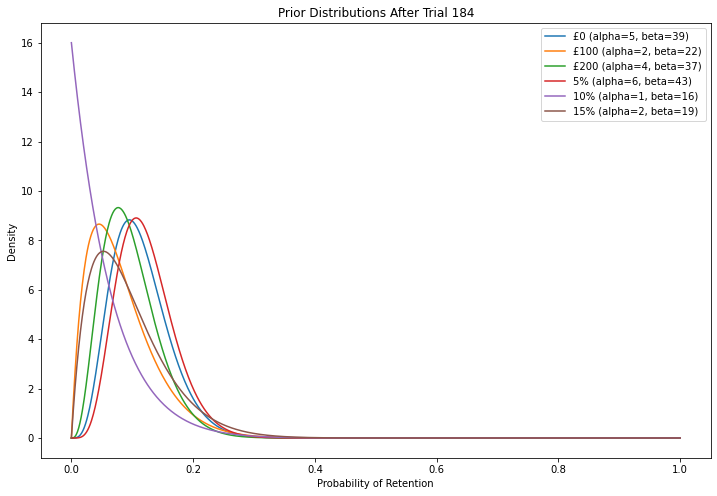

Trial 185: CustomerID = CUST0185, Selected treatment = £0
Was the customer CUST0185 retained? (y/n): 


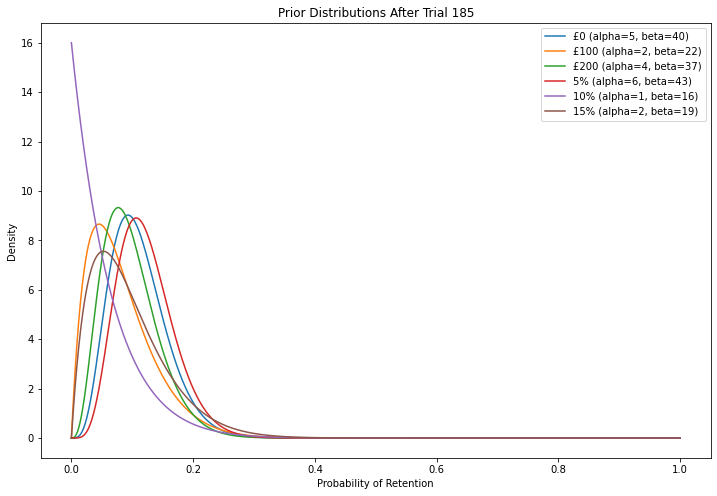

Trial 186: CustomerID = CUST0186, Selected treatment = 15%
Was the customer CUST0186 retained? (y/n): 


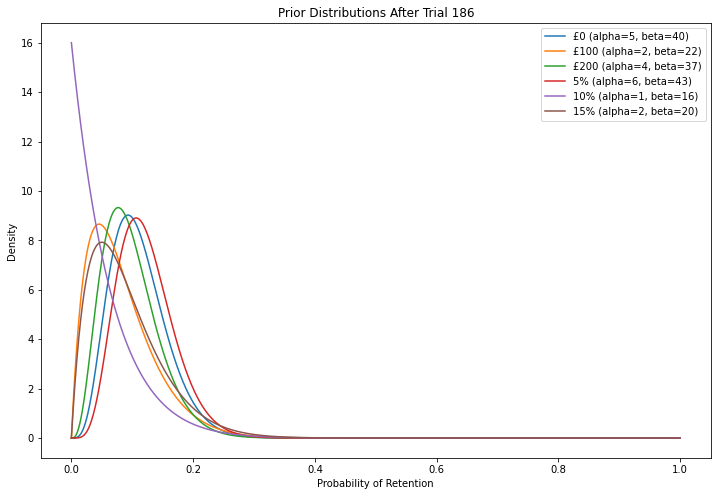

Trial 187: CustomerID = CUST0187, Selected treatment = £100
Was the customer CUST0187 retained? (y/n): 


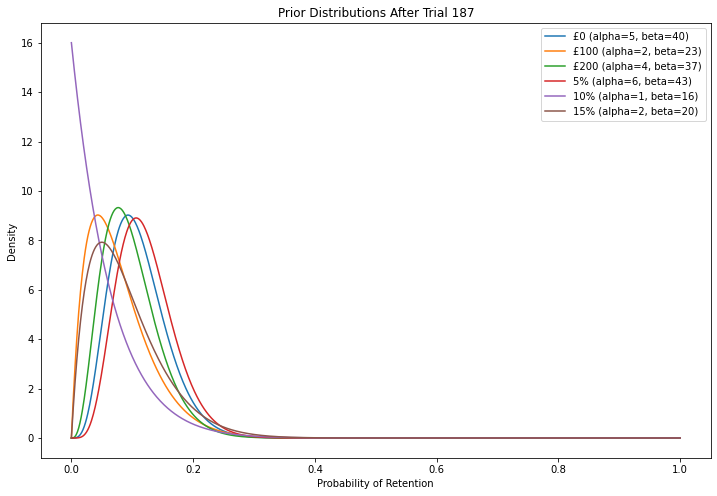

Trial 188: CustomerID = CUST0188, Selected treatment = £100
Was the customer CUST0188 retained? (y/n): 


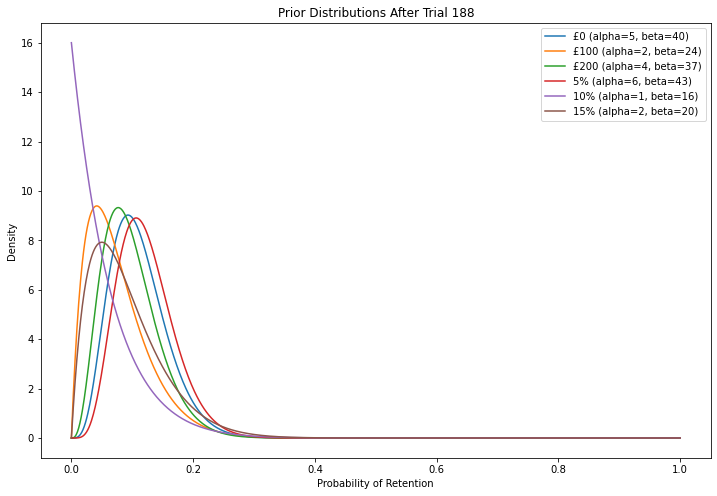

Trial 189: CustomerID = CUST0189, Selected treatment = 15%
Was the customer CUST0189 retained? (y/n): 


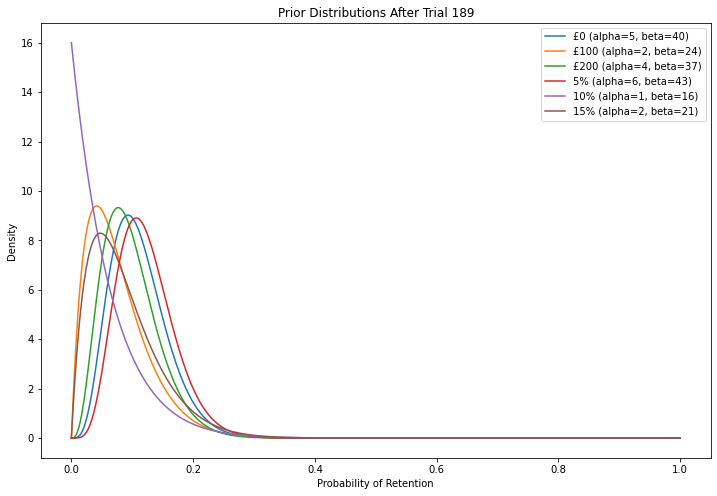

Trial 190: CustomerID = CUST0190, Selected treatment = 5%
Was the customer CUST0190 retained? (y/n): 


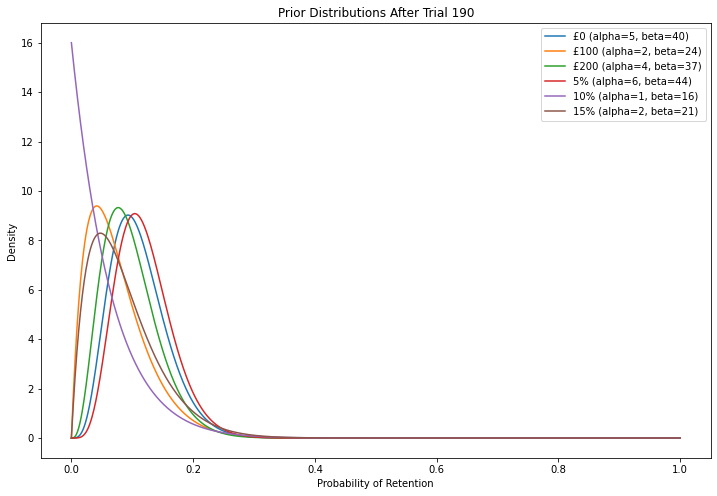

Trial 191: CustomerID = CUST0191, Selected treatment = £0
Was the customer CUST0191 retained? (y/n): 


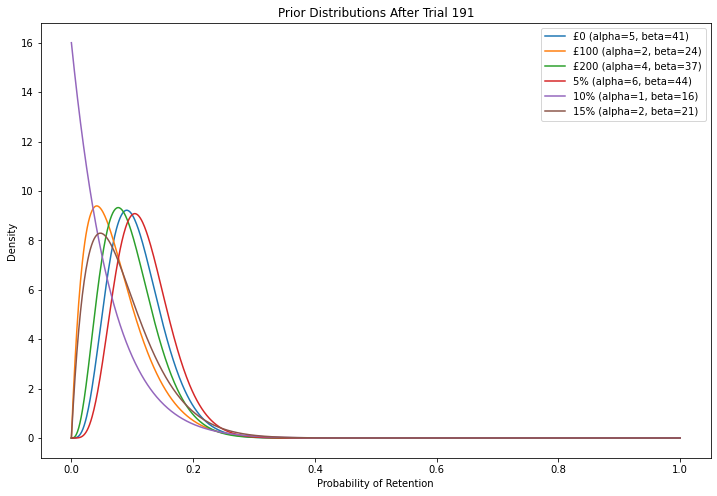

Trial 192: CustomerID = CUST0192, Selected treatment = £100
Was the customer CUST0192 retained? (y/n): 


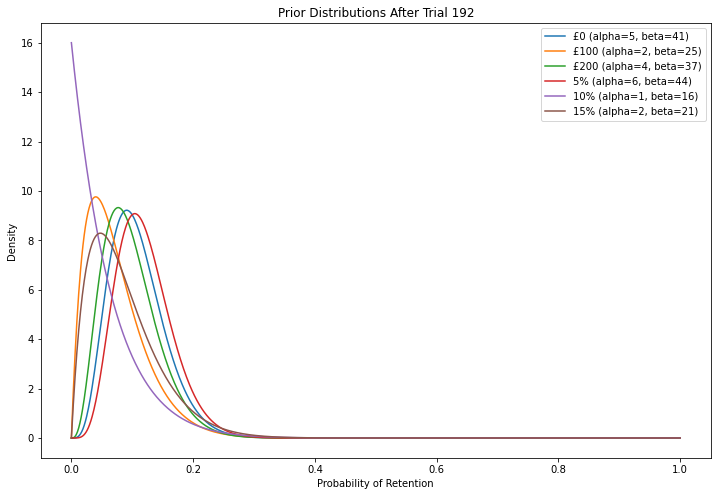

Trial 193: CustomerID = CUST0193, Selected treatment = 5%
Was the customer CUST0193 retained? (y/n): 


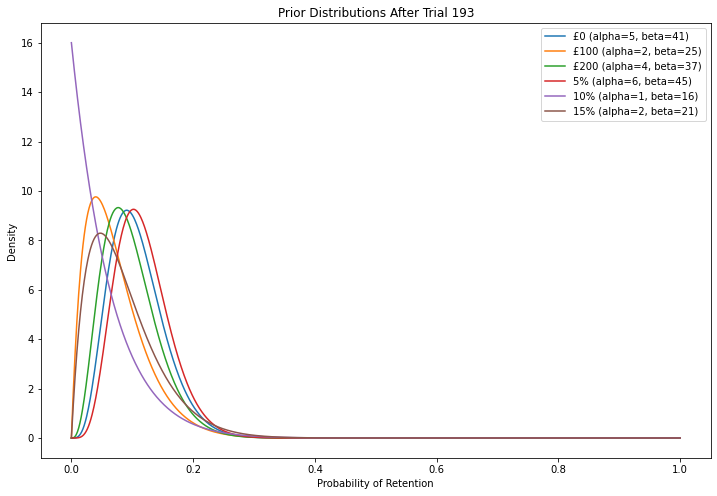

Trial 194: CustomerID = CUST0194, Selected treatment = £0
Was the customer CUST0194 retained? (y/n): 


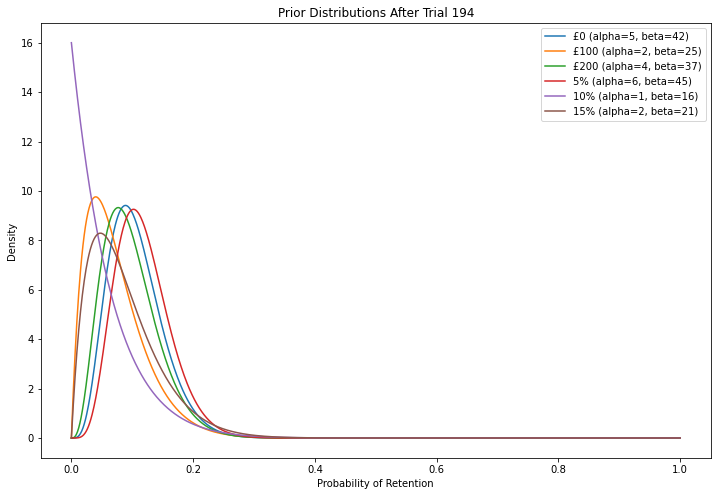

Trial 195: CustomerID = CUST0195, Selected treatment = £200
Was the customer CUST0195 retained? (y/n): 


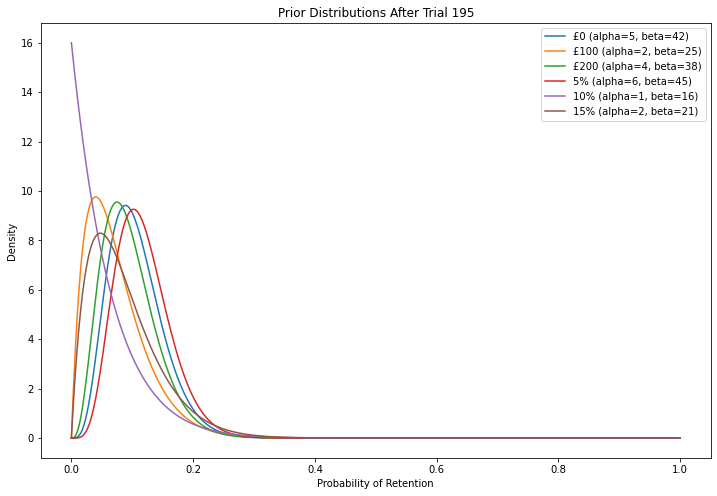

Trial 196: CustomerID = CUST0196, Selected treatment = 15%
Was the customer CUST0196 retained? (y/n): 


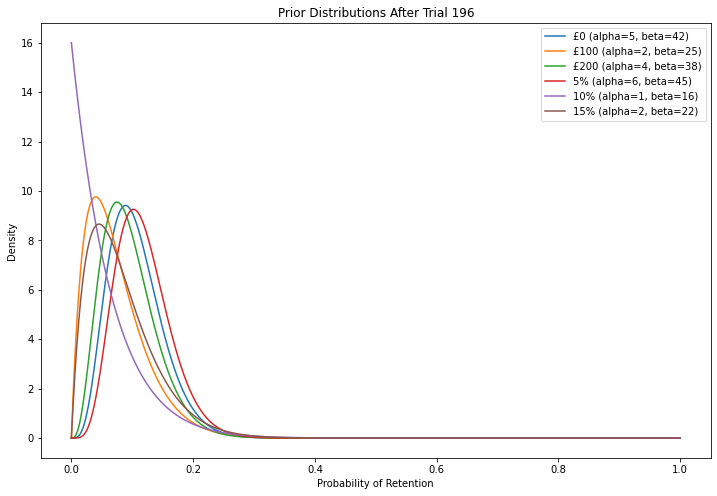

Trial 197: CustomerID = CUST0197, Selected treatment = 5%
Was the customer CUST0197 retained? (y/n): 


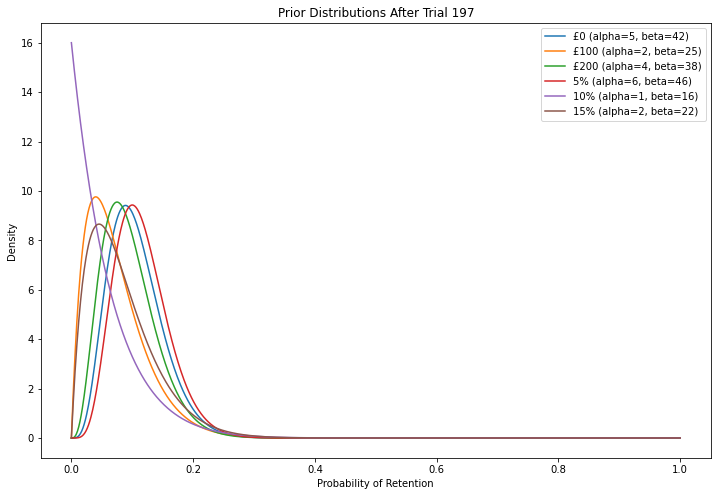

Trial 198: CustomerID = CUST0198, Selected treatment = 15%
Was the customer CUST0198 retained? (y/n): 


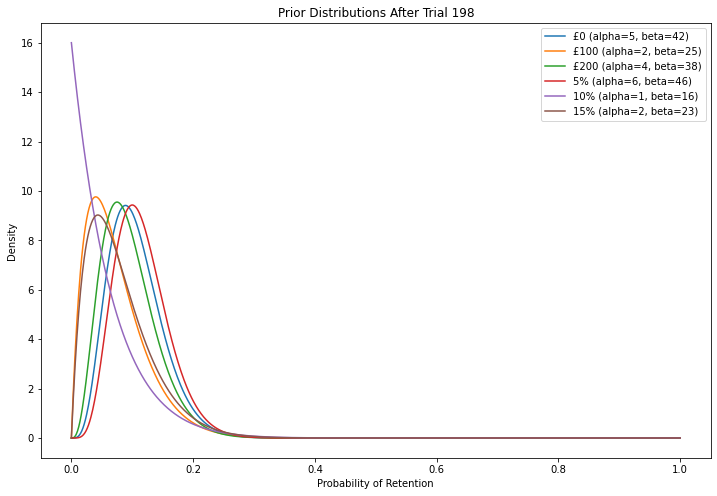

Trial 199: CustomerID = CUST0199, Selected treatment = 15%
Was the customer CUST0199 retained? (y/n): 


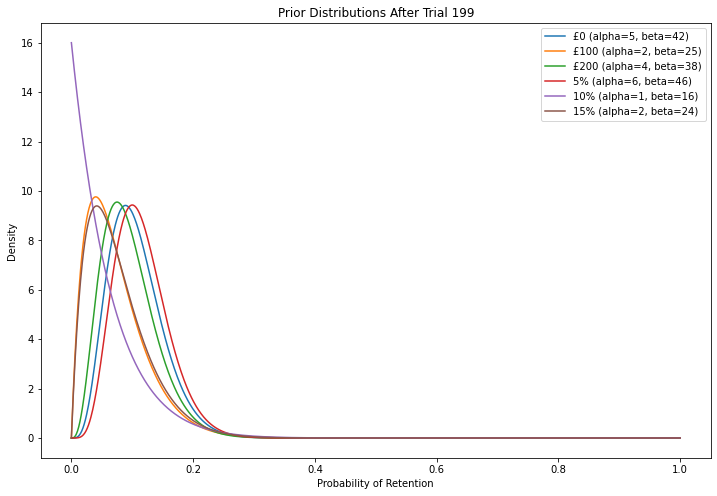

Trial 200: CustomerID = CUST0200, Selected treatment = 10%
Was the customer CUST0200 retained? (y/n): 


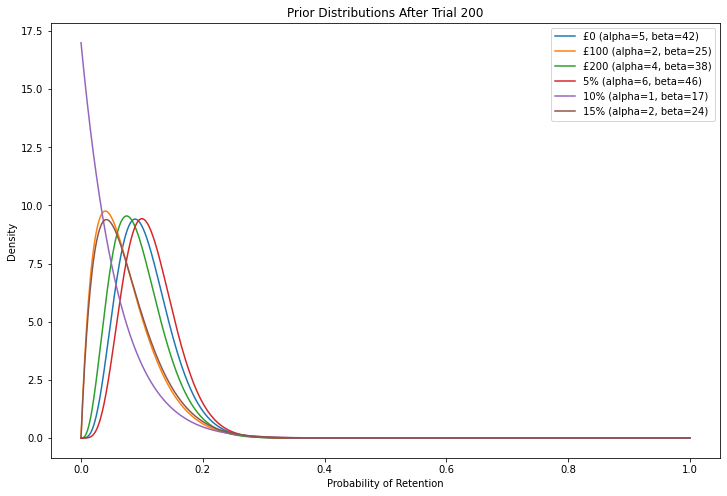

Trial 201: CustomerID = CUST0201, Selected treatment = £100
Was the customer CUST0201 retained? (y/n): 


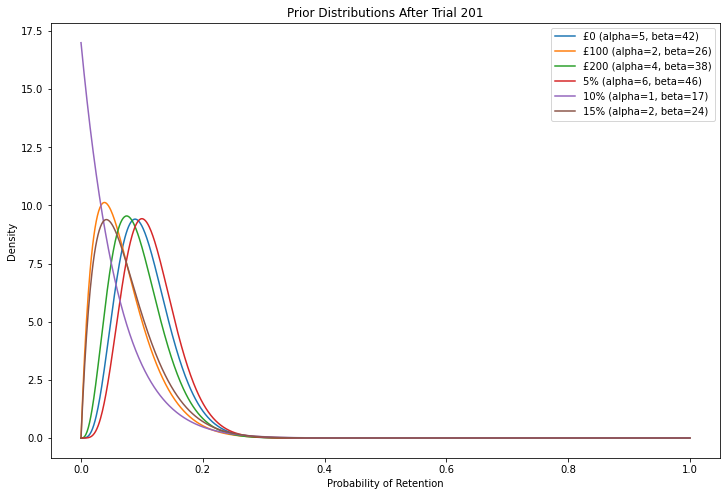

Trial 202: CustomerID = CUST0202, Selected treatment = 5%
Was the customer CUST0202 retained? (y/n): 


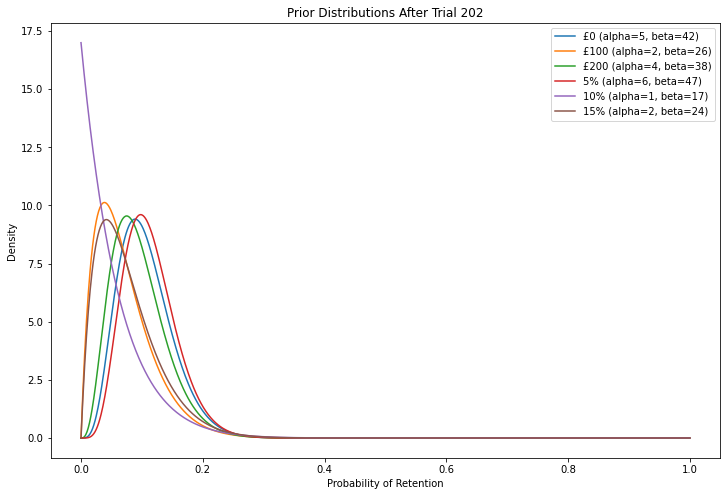

Trial 203: CustomerID = CUST0203, Selected treatment = £100
Was the customer CUST0203 retained? (y/n): 


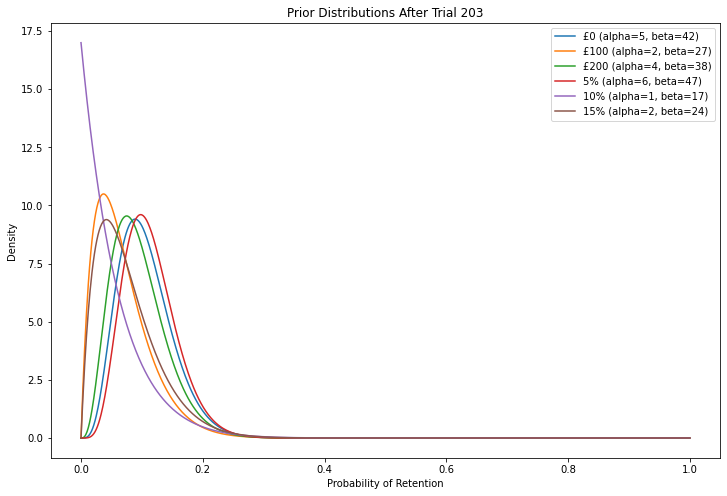

Trial 204: CustomerID = CUST0204, Selected treatment = 5%
Was the customer CUST0204 retained? (y/n): 


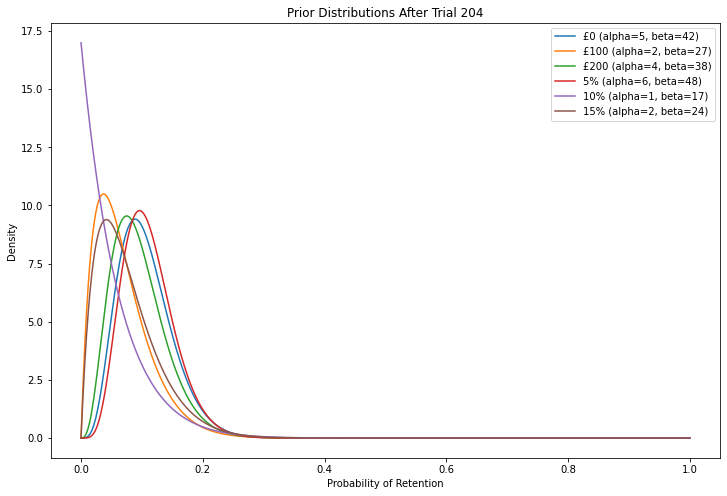

Trial 205: CustomerID = CUST0205, Selected treatment = £0
Was the customer CUST0205 retained? (y/n): 


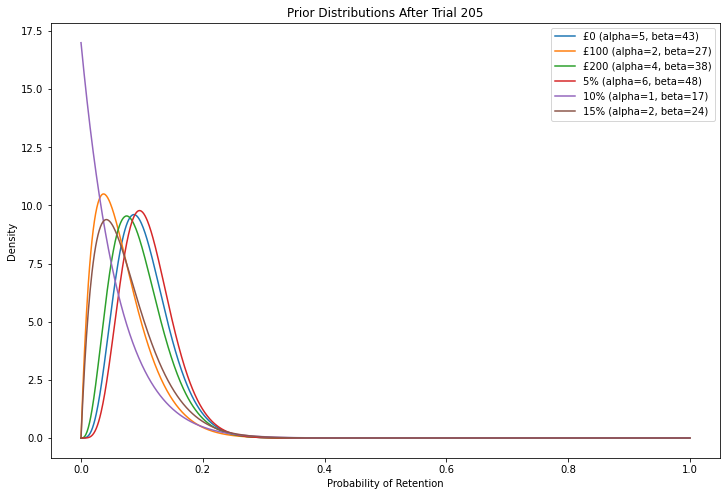

Trial 206: CustomerID = CUST0206, Selected treatment = £0
Was the customer CUST0206 retained? (y/n): 


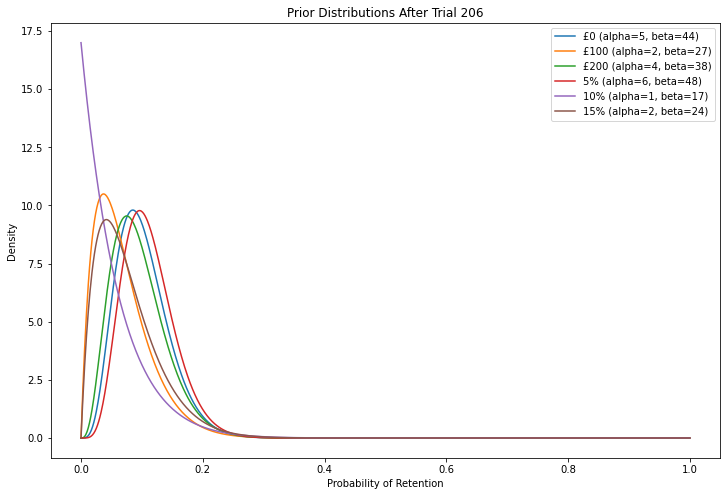

Trial 207: CustomerID = CUST0207, Selected treatment = 5%
Was the customer CUST0207 retained? (y/n): 


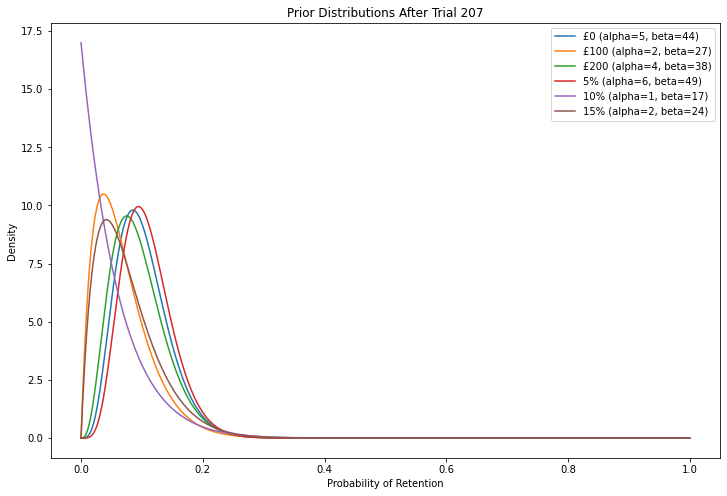

Trial 208: CustomerID = CUST0208, Selected treatment = 10%
Was the customer CUST0208 retained? (y/n): 


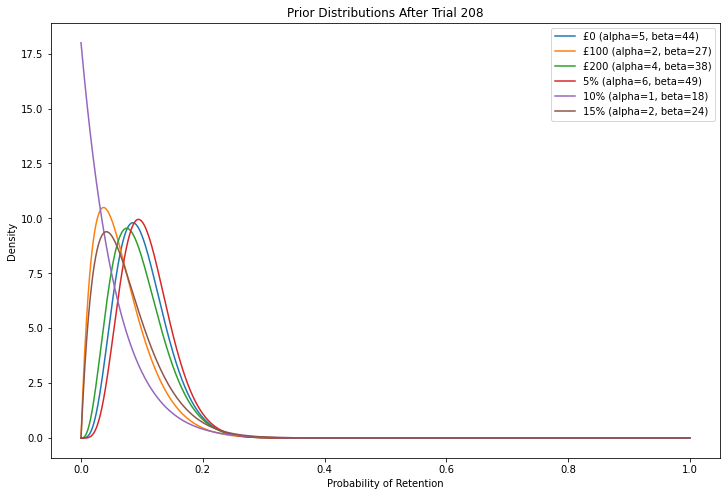

Trial 209: CustomerID = CUST0209, Selected treatment = 5%
Was the customer CUST0209 retained? (y/n): 


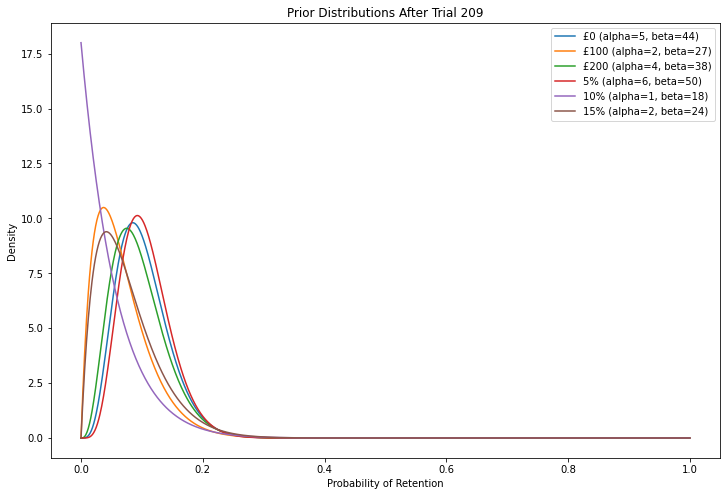

Trial 210: CustomerID = CUST0210, Selected treatment = £200
Was the customer CUST0210 retained? (y/n): 


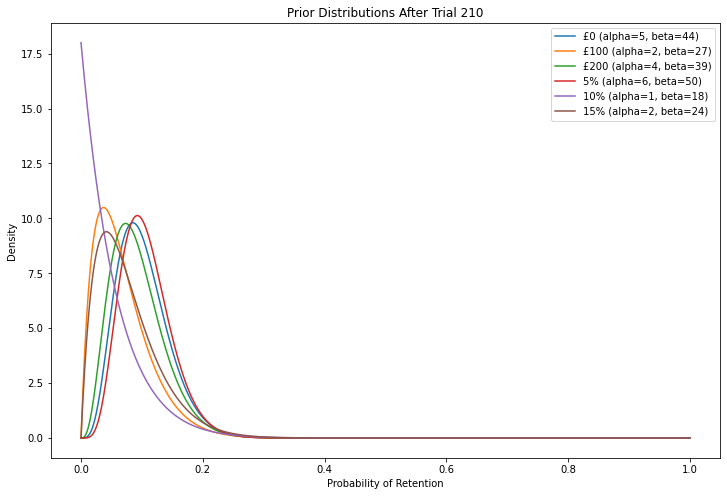

Trial 211: CustomerID = CUST0211, Selected treatment = 5%
Was the customer CUST0211 retained? (y/n): 


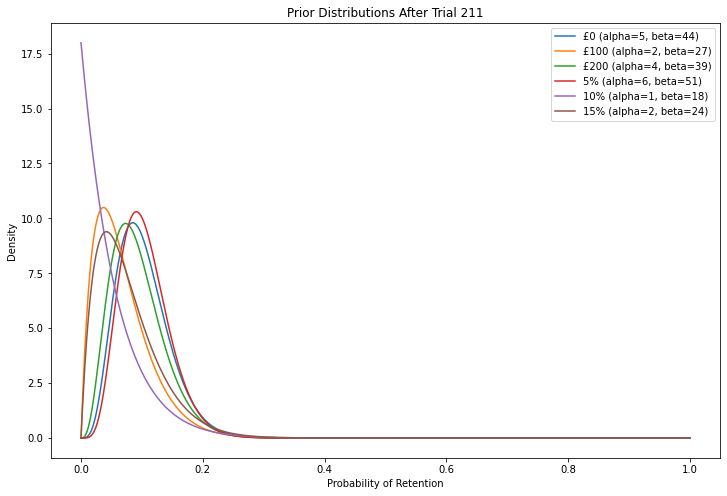

Trial 212: CustomerID = CUST0212, Selected treatment = £0
Was the customer CUST0212 retained? (y/n): 


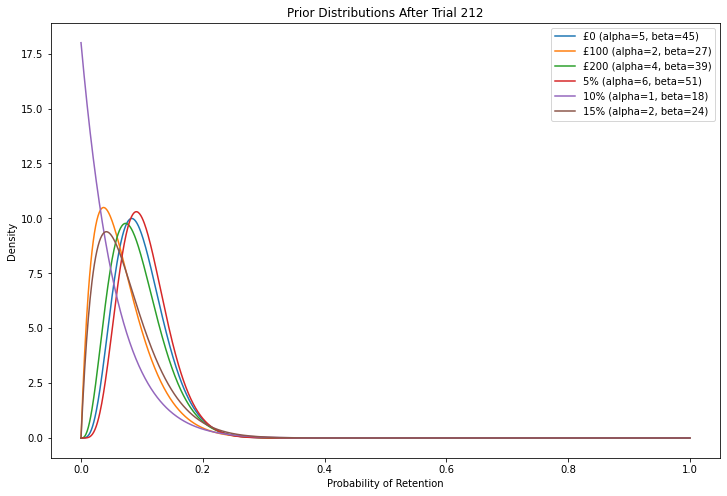

Trial 213: CustomerID = CUST0213, Selected treatment = £0
Was the customer CUST0213 retained? (y/n): 


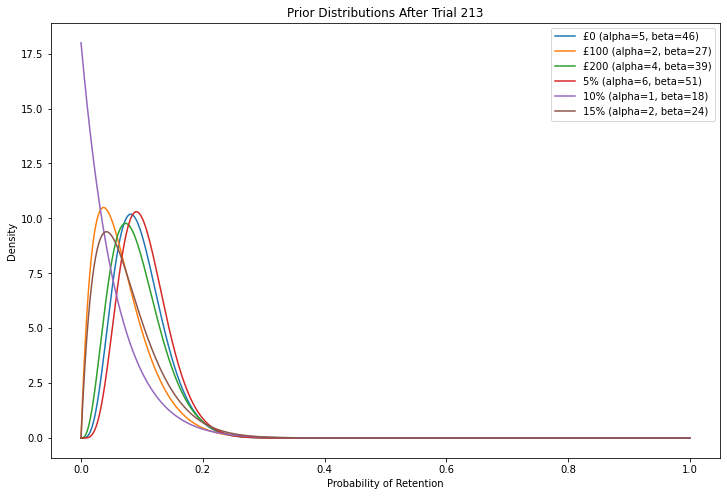

Trial 214: CustomerID = CUST0214, Selected treatment = £0
Was the customer CUST0214 retained? (y/n): 


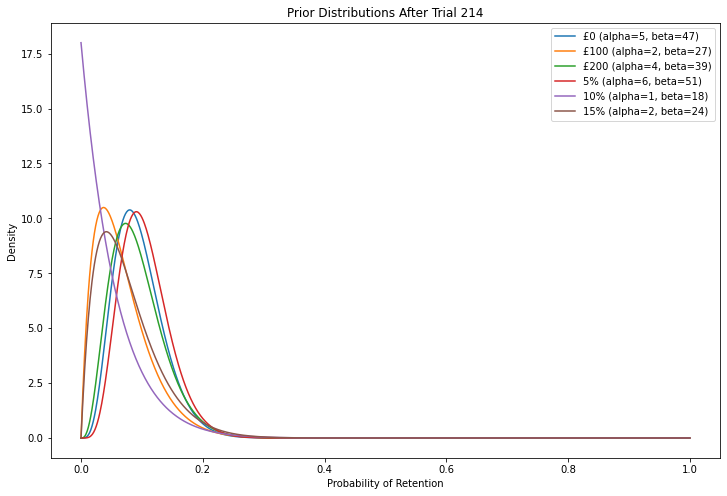

Trial 215: CustomerID = CUST0215, Selected treatment = 15%
Was the customer CUST0215 retained? (y/n): 


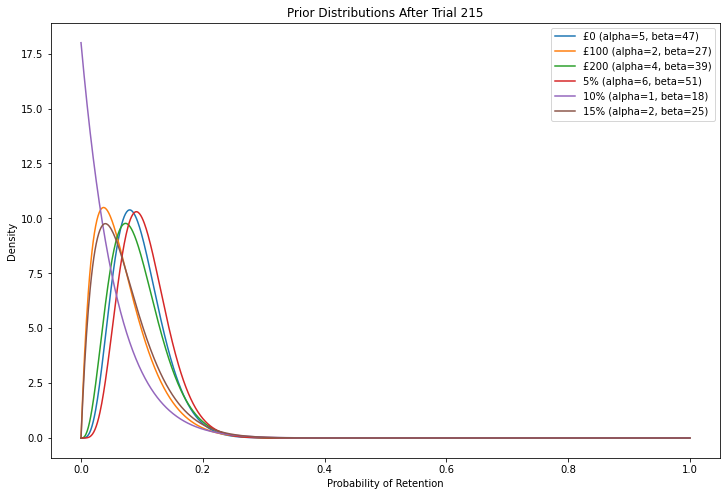

Trial 216: CustomerID = CUST0216, Selected treatment = 5%
Was the customer CUST0216 retained? (y/n): 


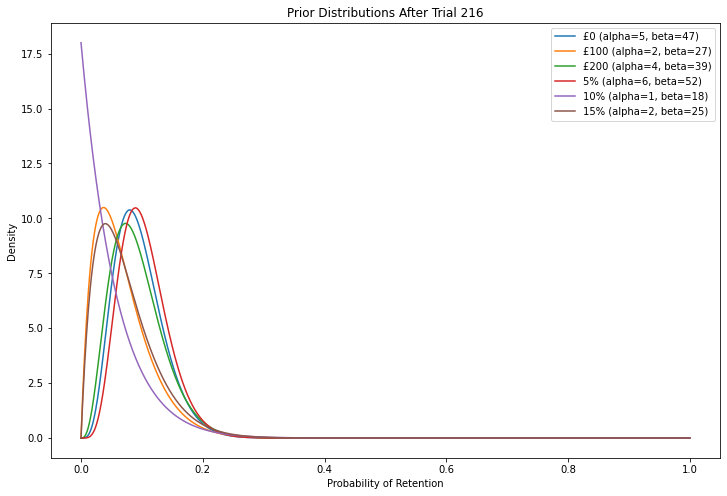

Trial 217: CustomerID = CUST0217, Selected treatment = 5%
Was the customer CUST0217 retained? (y/n): 


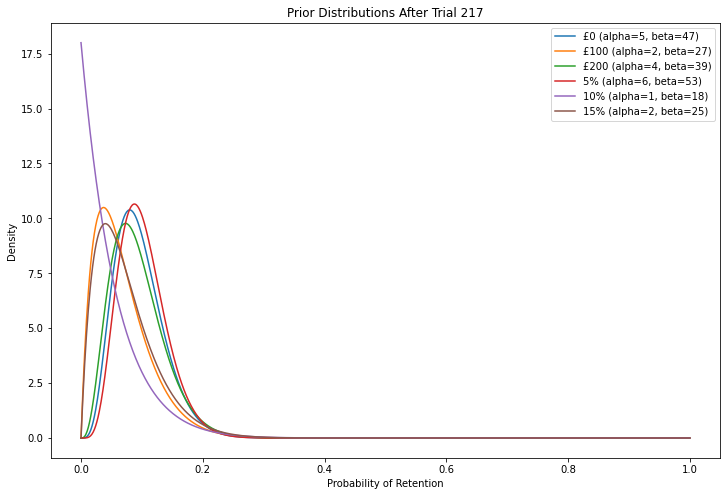

Trial 218: CustomerID = CUST0218, Selected treatment = £0
Was the customer CUST0218 retained? (y/n): 


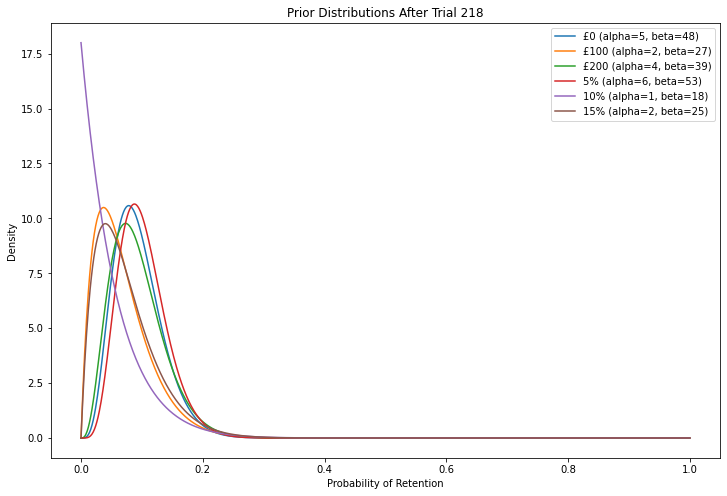

Trial 219: CustomerID = CUST0219, Selected treatment = £0
Was the customer CUST0219 retained? (y/n): y


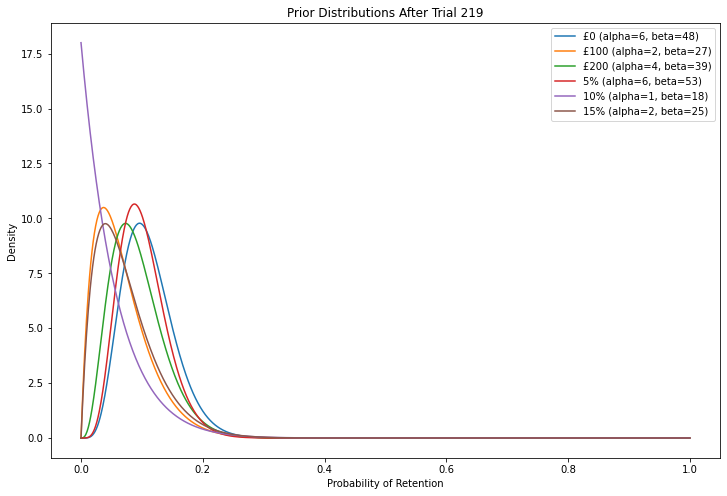

Trial 220: CustomerID = CUST0220, Selected treatment = £200
Was the customer CUST0220 retained? (y/n): 


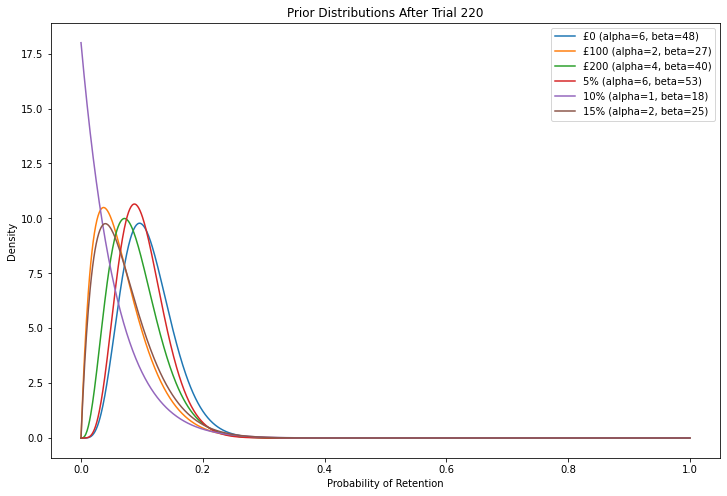

Trial 221: CustomerID = CUST0221, Selected treatment = £0
Was the customer CUST0221 retained? (y/n): 


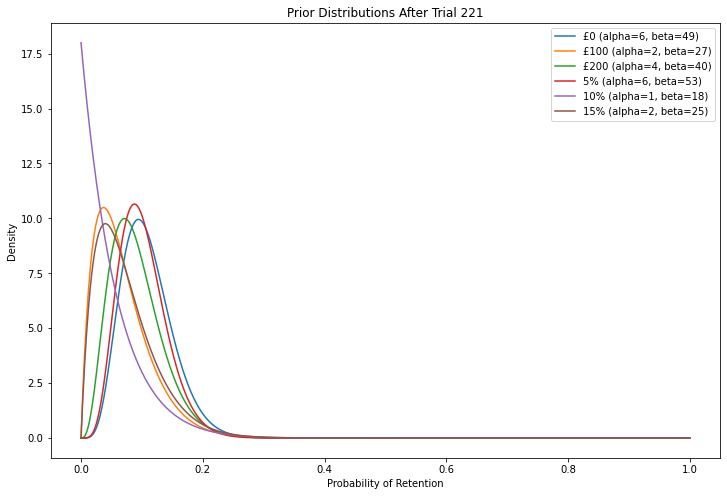

Trial 222: CustomerID = CUST0222, Selected treatment = £0
Was the customer CUST0222 retained? (y/n): 


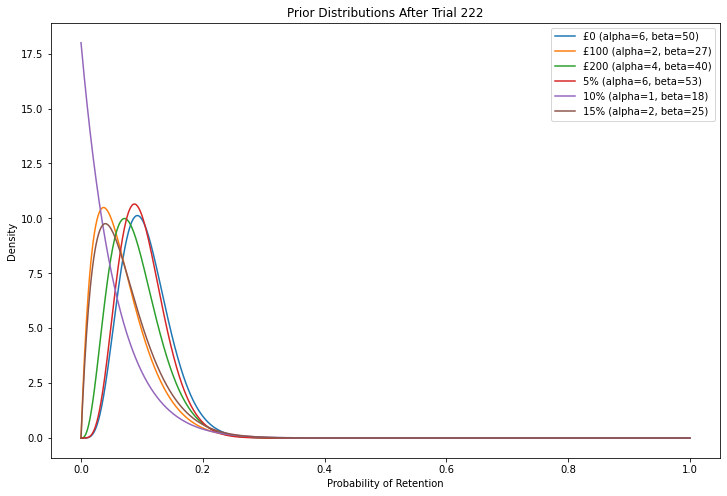

Trial 223: CustomerID = CUST0223, Selected treatment = £100
Was the customer CUST0223 retained? (y/n): y


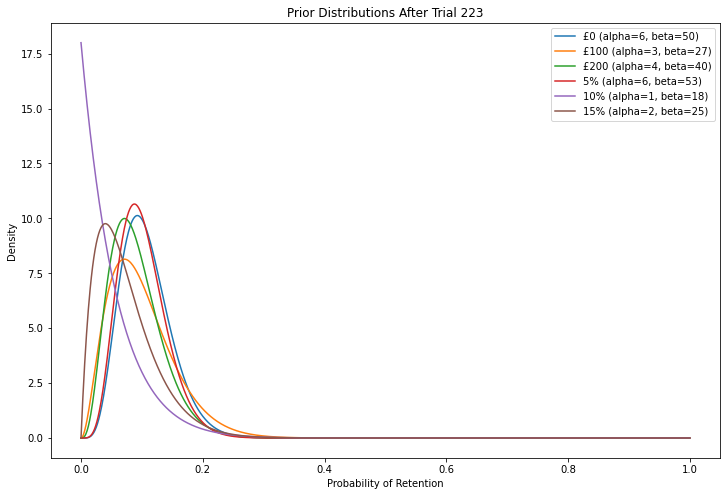

Trial 224: CustomerID = CUST0224, Selected treatment = 5%
Was the customer CUST0224 retained? (y/n): 


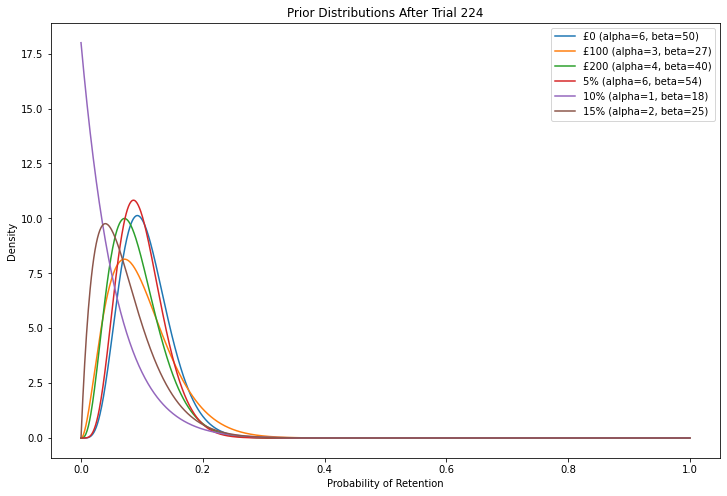

Trial 225: CustomerID = CUST0225, Selected treatment = £0
Was the customer CUST0225 retained? (y/n): 


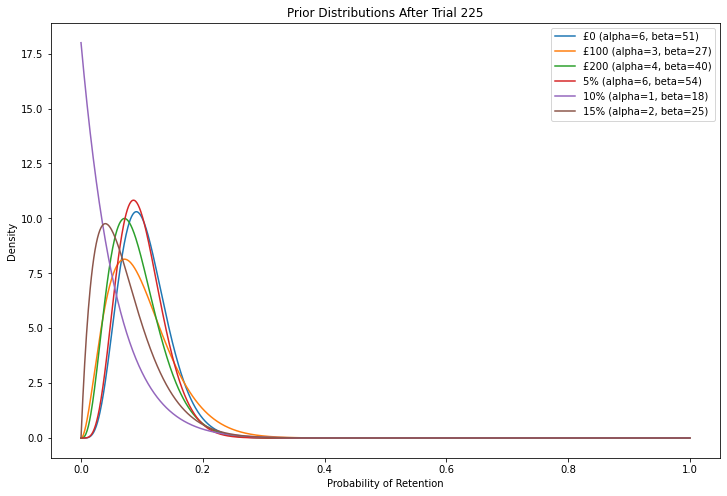

Trial 226: CustomerID = CUST0226, Selected treatment = £0
Was the customer CUST0226 retained? (y/n): 


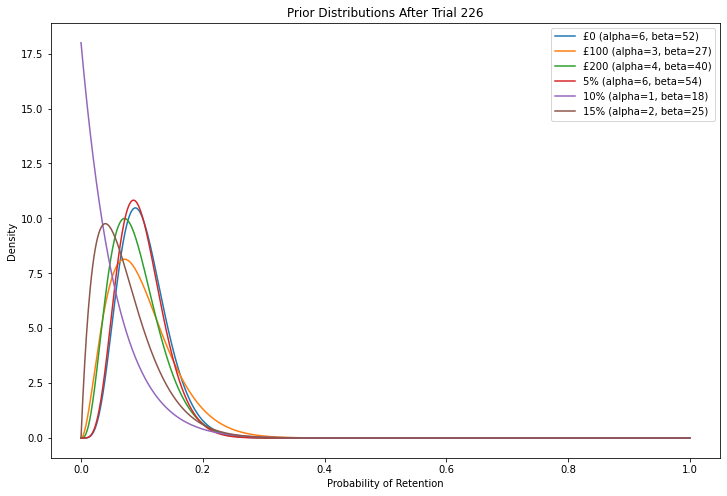

Trial 227: CustomerID = CUST0227, Selected treatment = £200
Was the customer CUST0227 retained? (y/n): 


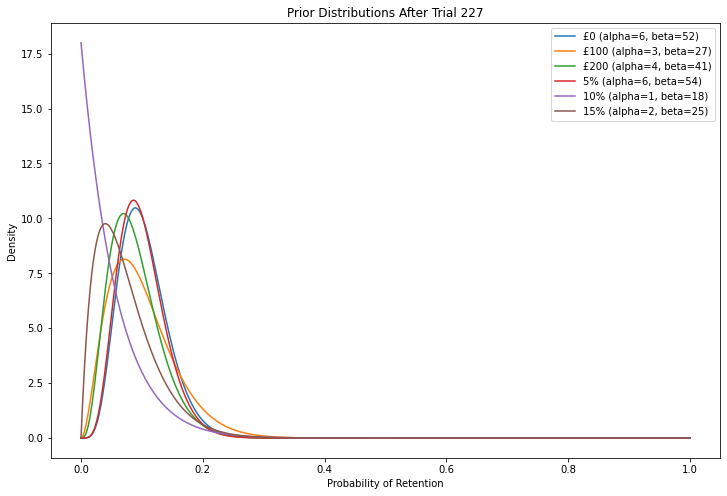

Trial 228: CustomerID = CUST0228, Selected treatment = £200
Was the customer CUST0228 retained? (y/n): 


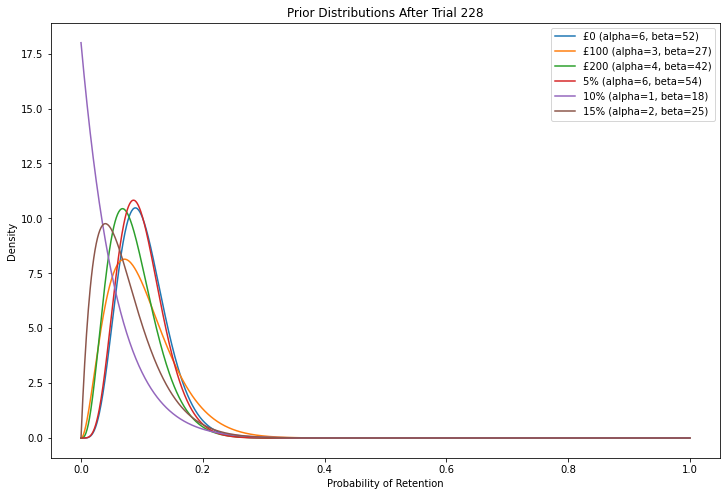

Trial 229: CustomerID = CUST0229, Selected treatment = 5%
Was the customer CUST0229 retained? (y/n): 


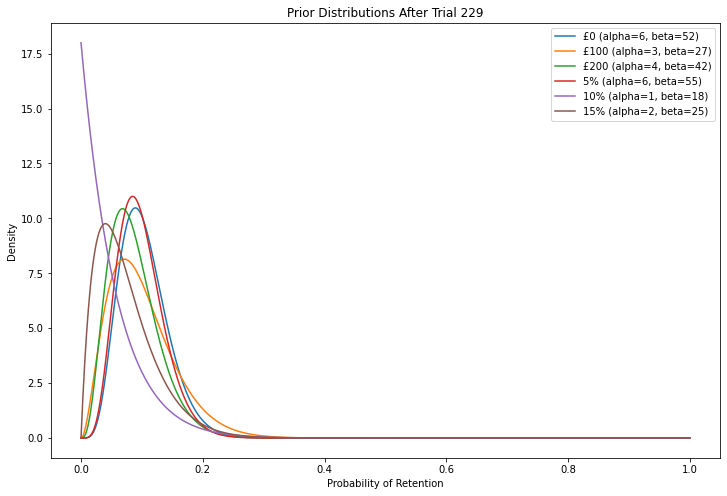

Trial 230: CustomerID = CUST0230, Selected treatment = 5%
Was the customer CUST0230 retained? (y/n): 


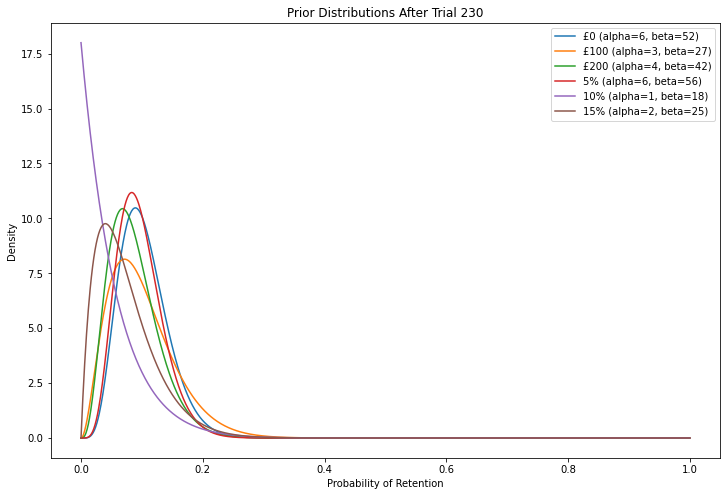

Trial 231: CustomerID = CUST0231, Selected treatment = £100
Was the customer CUST0231 retained? (y/n): 


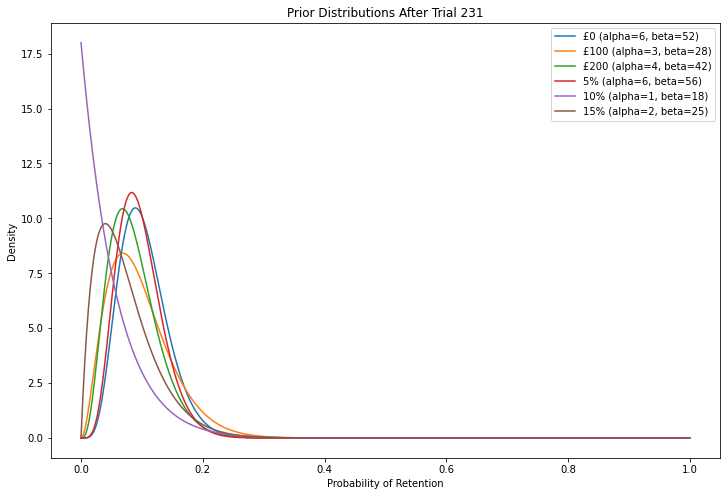

Trial 232: CustomerID = CUST0232, Selected treatment = £100
Was the customer CUST0232 retained? (y/n): 


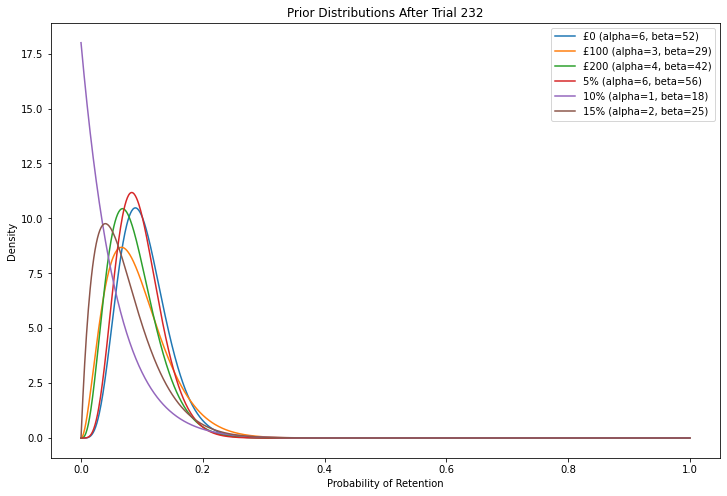

Trial 233: CustomerID = CUST0233, Selected treatment = £100
Was the customer CUST0233 retained? (y/n): 


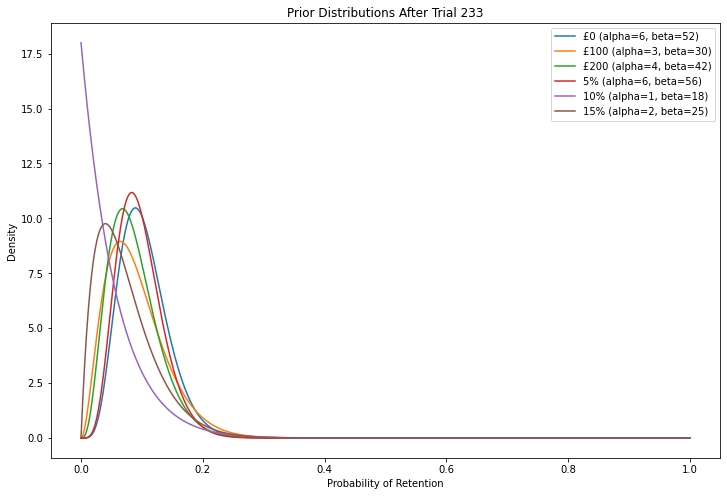

Trial 234: CustomerID = CUST0234, Selected treatment = £0
Was the customer CUST0234 retained? (y/n): 


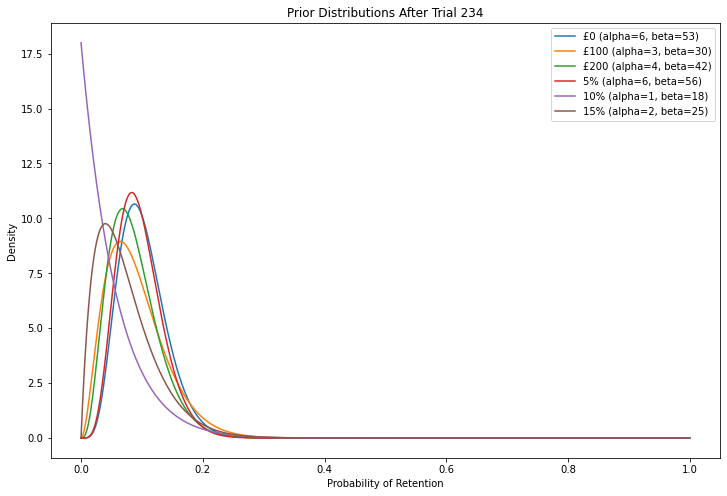

Trial 235: CustomerID = CUST0235, Selected treatment = £100
Was the customer CUST0235 retained? (y/n): 


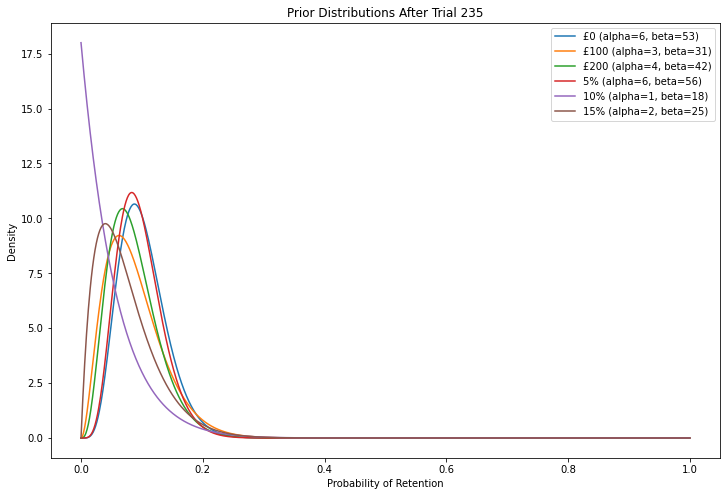

Trial 236: CustomerID = CUST0236, Selected treatment = 15%
Was the customer CUST0236 retained? (y/n): 


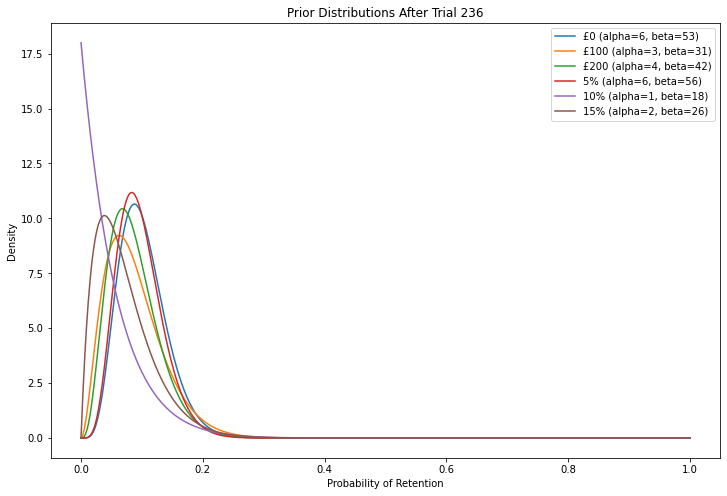

Trial 237: CustomerID = CUST0237, Selected treatment = £0
Was the customer CUST0237 retained? (y/n): 


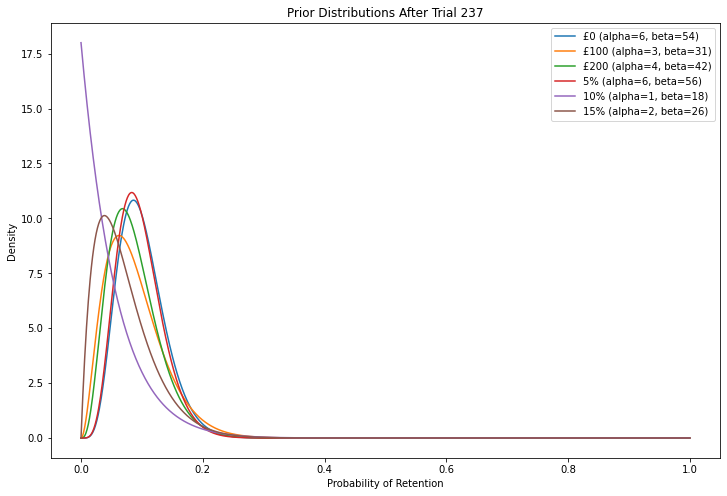

Trial 238: CustomerID = CUST0238, Selected treatment = £200
Was the customer CUST0238 retained? (y/n): 


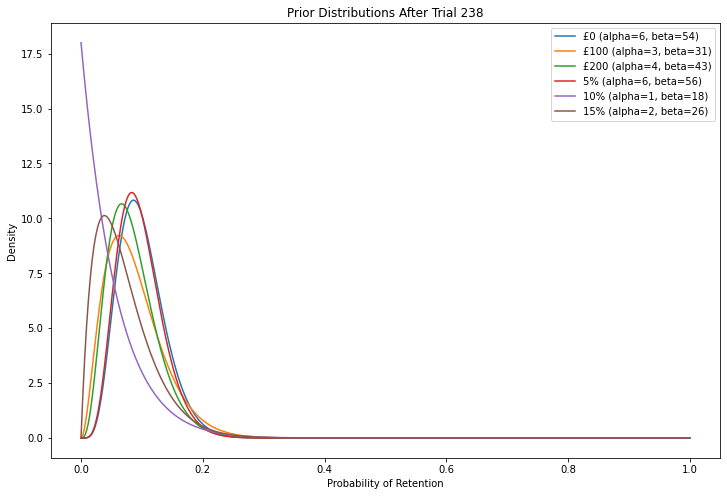

Trial 239: CustomerID = CUST0239, Selected treatment = £100
Was the customer CUST0239 retained? (y/n): 


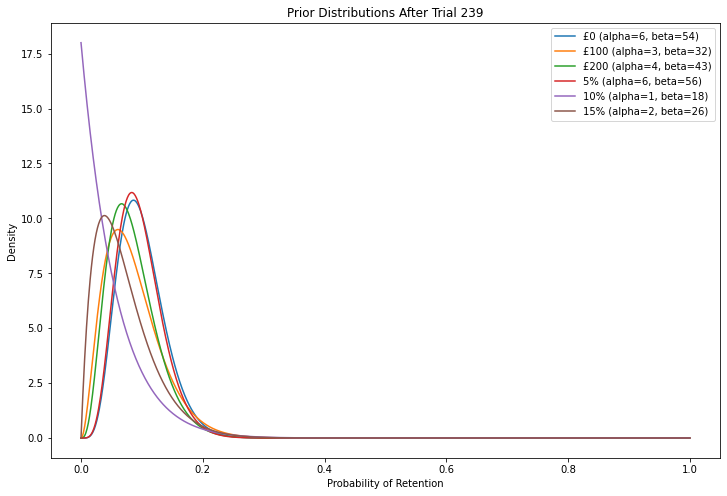

Trial 240: CustomerID = CUST0240, Selected treatment = £200
Was the customer CUST0240 retained? (y/n): n


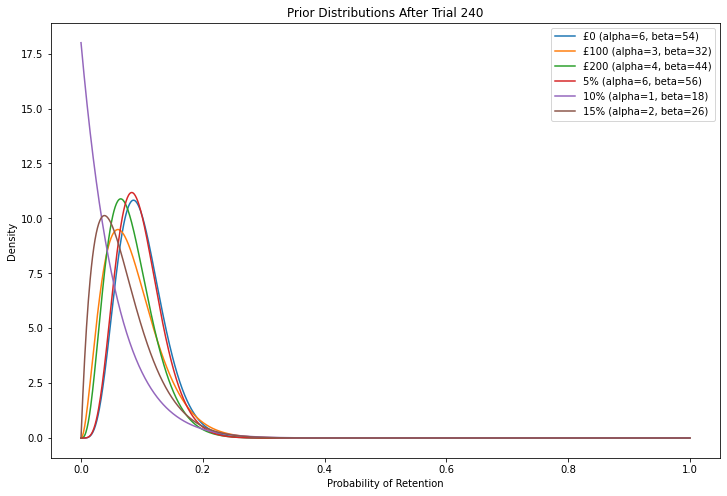

Trial 241: CustomerID = CUST0241, Selected treatment = £200
Was the customer CUST0241 retained? (y/n): 


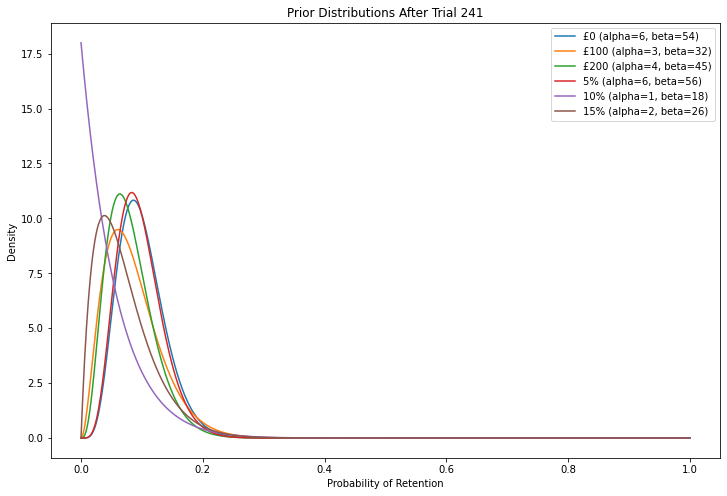

Trial 242: CustomerID = CUST0242, Selected treatment = £0
Was the customer CUST0242 retained? (y/n): 


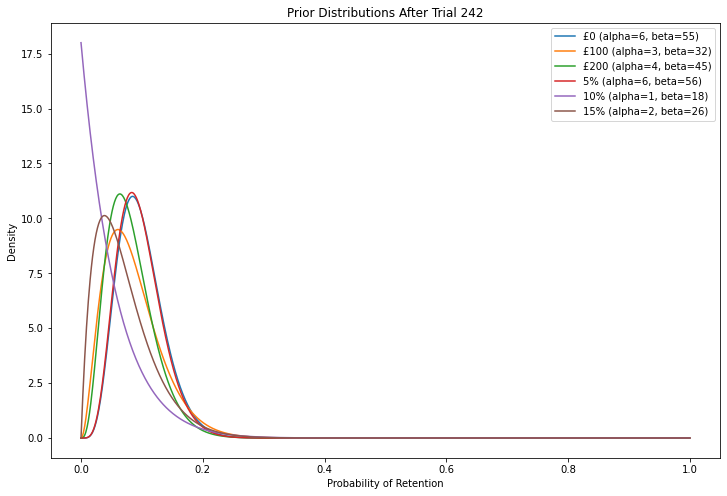

Trial 243: CustomerID = CUST0243, Selected treatment = £0
Was the customer CUST0243 retained? (y/n): 


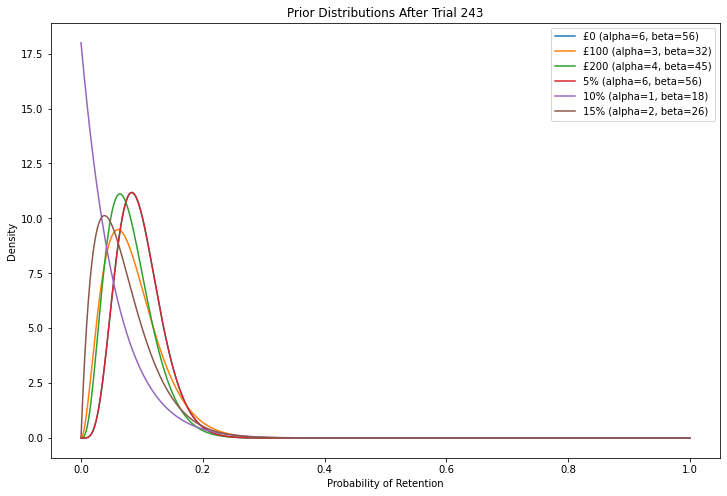

Trial 244: CustomerID = CUST0244, Selected treatment = £0
Was the customer CUST0244 retained? (y/n): 


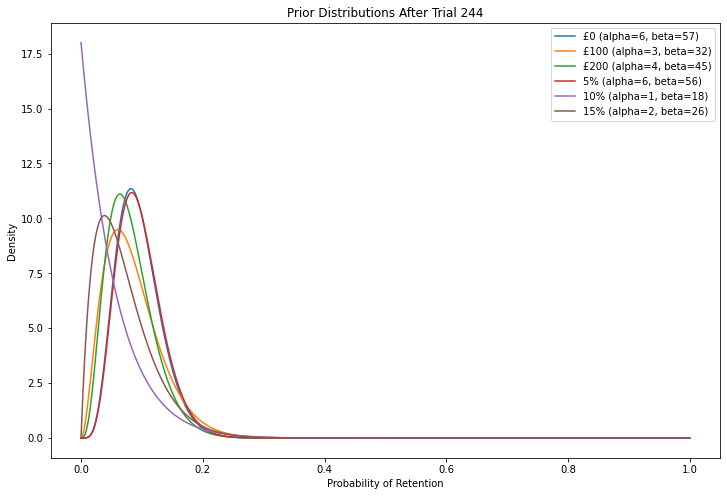

Trial 245: CustomerID = CUST0245, Selected treatment = 15%
Was the customer CUST0245 retained? (y/n): 


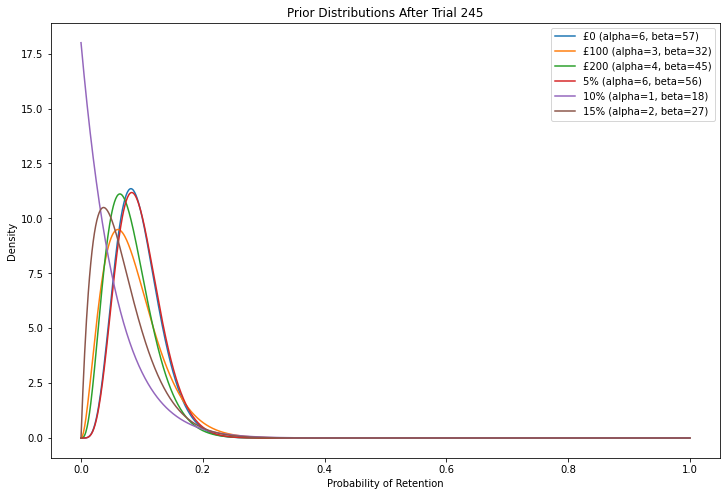

Trial 246: CustomerID = CUST0246, Selected treatment = £0
Was the customer CUST0246 retained? (y/n): 


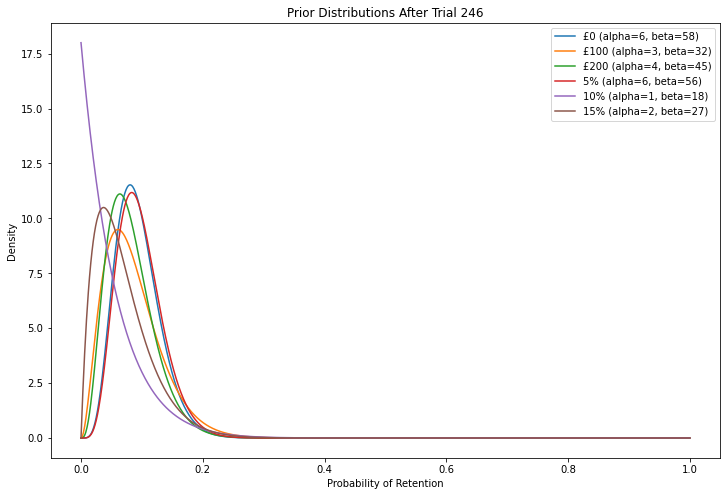

Trial 247: CustomerID = CUST0247, Selected treatment = 5%
Was the customer CUST0247 retained? (y/n): 


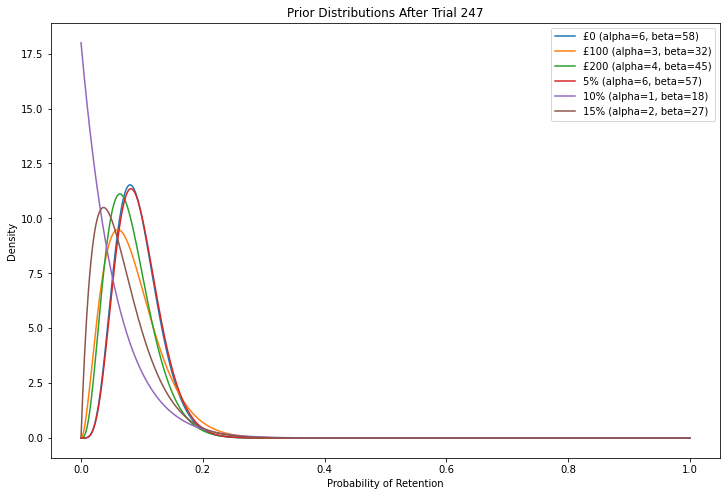

Trial 248: CustomerID = CUST0248, Selected treatment = £100
Was the customer CUST0248 retained? (y/n): 


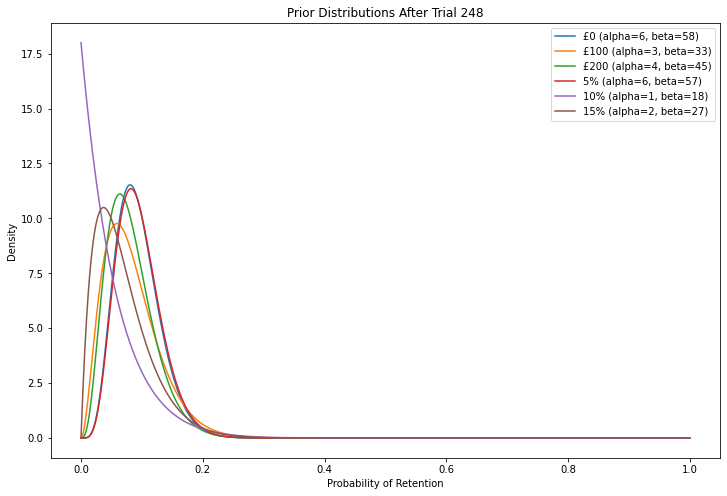

Trial 249: CustomerID = CUST0249, Selected treatment = 5%
Was the customer CUST0249 retained? (y/n): y


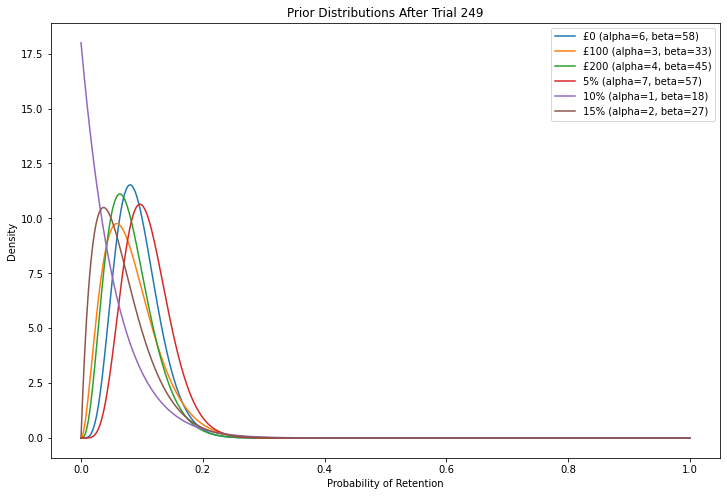

Trial 250: CustomerID = CUST0250, Selected treatment = 10%
Was the customer CUST0250 retained? (y/n): 


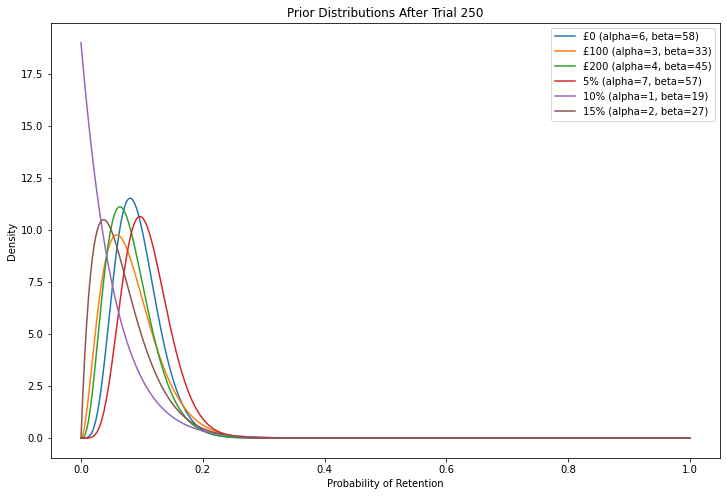

In [5]:
# Treatments
treatments = ['£0', '£100', '£200', '5%', '10%', '15%']

# Initialize priors for each treatment (Beta(1, 1) for each treatment)
priors = {treatment: {'alpha': 1, 'beta': 1} for treatment in treatments}
    
# Plot initial priors
plot_beta_distributions(priors, 'Initial Prior Distributions')
        
# Initialize logging DataFrame
log_columns = ['trial', 'customer_id', 'contract_start_date', 'treatment', 'alpha', 'beta', 'outcome']
log_df = pd.DataFrame(columns=log_columns)y

# Run the experiment for the dataset
run_experiment(df)

# Exploitation Phase

In [12]:
# Treatments
treatments = ['£0', '£100', '£200', '5%', '10%', '15%']

# Reaad the csvs
df=pd.read_csv('data/customer_learning_dataset.csv')
output_df = pd.read_csv('data/experimentation_output.csv')

# Join with the main DataFrame df on customer_id and contract_start_date
df = df.merge(output_df, on=['customer_id', 'contract_start_date'], how='left')

# Convert the outcome column to a binary field called retained
df['retained'] = df['outcome'].apply(lambda x: 1 if x == 'y' else 0)

In [13]:
# Define a function to create an uplift model
def create_uplift_model(df, treatment):
    # Filter the data for the specific treatment
    treatment_df = df[df['treatment'] == treatment]
    
    features = ['age', 'premium', 'claims', 'has_existing_discount']

    # Define features and target
    X = treatment_df[features]
    y = treatment_df['retained']

    # Split the data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Train the model
    model = LogisticRegression(max_iter=1000)
    model.fit(X, y)

    # Evaluate the model
    y_pred_proba = model.predict_proba(X)[:, 1]
    auc = roc_auc_score(y, y_pred_proba)
    print(f"AUC for {treatment}: {auc}")

    return model

# Define a function to create an LTV model
def create_ltv_model(df):
    
    features = ['age', 'premium', 'claims', 'has_existing_discount']
    
    # Define features and target
    X = df[features]
    y = df['premium'] - df['claims']  # LTV = Premium - Claims

    # Split the data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Train the model
    model = LinearRegression()
    model.fit(X_train, y_train)

    # Evaluate the model
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    print(f"MSE for LTV model: {mse}")

    return model

# Define a function to apply business rules
def apply_business_rules(row):
    if row['claims'] > 10000:
        return 'No Discount'
    if row['has_existing_discount'] == 1:
        return 'No Discount'
    return 'Allowed'

In [14]:
# Define a function to calculate net benefits
def calculate_net_benefits(row, uplift_models, ltv_model):
    # Predict uplift for each treatment
    uplift_scores = {treatment: row[f'uplift_{treatment}'] for treatment in treatments}

    # Predict LTV
    ltv = row['ltv']

    # Define the cost of each treatment
    treatment_costs = {
        '£0': 0,
        '£100': 100,
        '£200': 200,
        '5%': row['premium'] * 0.05,
        '10%': row['premium'] * 0.10,
        '15%': row['premium'] * 0.15
    }

    # Calculate the net benefit for each treatment
    net_benefits = {treatment: (uplift_scores[treatment] * ltv) - treatment_costs[treatment] for treatment in treatments}

    return net_benefits

# Define a function to allocate the best option
def allocate_best_option(row, experimentation_rate=0.1):
    if row['business_rules'] == 'No Discount':
        return '£0', 'business_rules'

    # Experimentation parameter
    if np.random.rand() < experimentation_rate:
        return np.random.choice(treatments), 'experiment'

    # Allocate the best option based on net benefits
    net_benefits = {treatment: row[f'net_benefit_{treatment}'] for treatment in treatments}
    best_treatment = max(net_benefits, key=net_benefits.get)
    return best_treatment, 'model'

In [15]:
# Create uplift models for each treatment and save them
os.makedirs('models', exist_ok=True)
uplift_models = {}
for treatment in treatments:
    model = create_uplift_model(df, treatment)
    joblib.dump(model, f'models/uplift_model_{treatment}.pkl')
    uplift_models[treatment] = model

# Create the LTV model and save it
ltv_model = create_ltv_model(df)
joblib.dump(ltv_model, 'models/ltv_model.pkl')

AUC for £0: 0.8105263157894737
AUC for £100: 0.703125
AUC for £200: 0.9166666666666667
AUC for 5%: 0.6488095238095238
AUC for 10%: 0.8
AUC for 15%: 1.0
MSE for LTV model: 2.350356162387001e-25


['models/ltv_model.pkl']

In [17]:
df=pd.read_csv('data/customer_predicting_dataset.csv')

# Preprocess the data
features = ['age', 'premium', 'claims', 'has_existing_discount']
imputer = SimpleImputer(strategy='mean')
df[features] = imputer.fit_transform(df[features])

# Predict uplift for each treatment
for treatment in treatments:
    model = uplift_models[treatment]
    df[f'uplift_{treatment}'] = model.predict_proba(df[features])[:, 1]

# Predict LTV
df['ltv'] = ltv_model.predict(df[features])

# Apply business rules to the DataFrame
df['business_rules'] = df.apply(apply_business_rules, axis=1)

# Calculate net benefits for each treatment and store them in the DataFrame
for treatment in treatments:
    df[f'net_benefit_{treatment}'] = df.apply(lambda row: calculate_net_benefits(row, uplift_models, ltv_model)[treatment], axis=1)

# Allocate the best option for each customer
df['best_treatment'], df['allocation_source'] = zip(*df.apply(lambda row: allocate_best_option(row), axis=1))

# Save the final DataFrame to a CSV
df.to_csv('data/new_customer_dataset_predicted.csv', index=False)


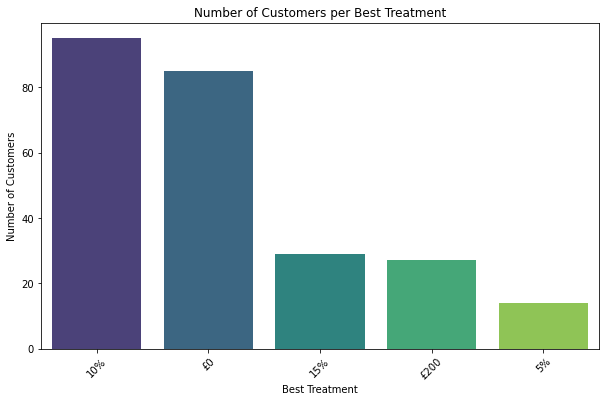

In [18]:
# Group the data by best_treatment and count the number of customers in each group
treatment_counts = df['best_treatment'].value_counts().reset_index()
treatment_counts.columns = ['best_treatment', 'count']

# Create the plot
plt.figure(figsize=(10, 6))
sns.barplot(x='best_treatment', y='count', data=treatment_counts, palette='viridis')
plt.title('Number of Customers per Best Treatment')
plt.xlabel('Best Treatment')
plt.ylabel('Number of Customers')
plt.xticks(rotation=45)
plt.show()

In [19]:
df.head(10)

,customer_id,contract_start_date,contract_end_date,age,family_status,product,premium,claims,has_existing_discount,time_from_renewal,...,ltv,business_rules,net_benefit_£0,net_benefit_£100,net_benefit_£200,net_benefit_5%,net_benefit_10%,net_benefit_15%,best_treatment,allocation_source
0,CUST0251,2023-12-04,2024-12-03,70.0,Widowed,ProductC,1298.367483,486.597662,0.0,-337,...,811.769821,Allowed,66.346620,-70.891890,-162.952884,4.557266,426.638381,-194.755122,10%,model
1,CUST0252,2023-12-26,2024-12-25,71.0,Widowed,ProductB,688.612268,599.368966,0.0,-359,...,89.243302,Allowed,26.152597,-93.714397,-199.867881,-28.443381,6.703414,-103.291840,£0,model
2,CUST0253,2023-05-09,2024-05-08,71.0,Divorced,ProductC,699.071981,602.145644,0.0,-128,...,96.926337,Allowed,27.893004,-93.157582,-199.847652,-28.472893,11.757884,-104.860797,£0,model
3,CUST0254,2023-09-24,2024-09-23,20.0,Widowed,ProductC,715.313543,22.932811,1.0,-266,...,692.380732,No Discount,54.827639,-92.850175,-199.941627,71.999787,262.751105,578.500099,£0,business_rules
4,CUST0255,2023-05-31,2024-05-30,33.0,Married,ProductA,1909.729688,322.108004,0.0,-150,...,1587.621684,Allowed,5.943330,-77.746414,40.004282,97.870563,-87.656506,-280.962256,5%,model
5,CUST0256,2023-10-25,2024-10-24,40.0,Widowed,ProductB,1599.348378,636.490651,1.0,-297,...,962.857726,No Discount,22.946846,-59.593339,-160.690768,-17.821833,-95.904344,-239.896498,£0,business_rules
6,CUST0257,2023-04-09,2024-04-08,74.0,Divorced,ProductC,743.572842,148.999736,0.0,-98,...,594.573106,Allowed,173.980877,-89.347157,-198.459210,43.438076,502.132252,-111.535926,10%,model
7,CUST0258,2023-09-20,2024-09-19,28.0,Single,ProductB,782.523626,695.415648,0.0,-262,...,87.107977,Allowed,3.947830,-93.033637,-199.983700,-33.840265,-68.407625,-116.351947,£0,model
8,CUST0259,2023-09-09,2024-09-08,29.0,Married,ProductC,1596.244212,745.925209,0.0,-251,...,850.319003,Allowed,5.723767,-49.493662,-182.018135,-28.104389,-142.063688,-235.688730,£0,model
9,CUST0260,2023-05-24,2024-05-23,27.0,Single,ProductC,734.245767,981.969190,0.0,-143,...,-247.723423,Allowed,-12.057378,-144.213678,-200.031740,-46.064708,-84.312125,-111.256592,£0,model
